In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
import matplotlib as mpl
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

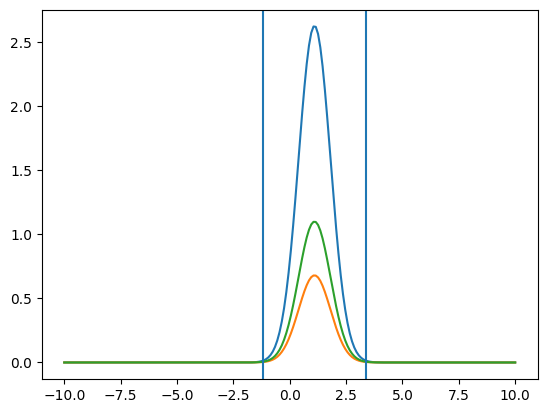

*Extracting Pieces for TH2*
Available Functions:
	Num_Xbins(TH2_) returns number of X bins for a TH2
	Num_Ybins(TH2_) returns number of Y bins for a TH2
	XEdges_2d(TH2_) returns edges of x bins for a TH2
	YEdges_2d(TH2_) returns edges of y bins for a TH2
	Center_Xbins(TH2_) returns center values for x bins for a TH2
	Center_Ybins(TH2_) returns center value for y bins for a TH2
	XY_Values(TH2_) returns a 2D np.array for z values arranged [x][y] for a TH2
	YX_Values(TH2_) returns a 2D np.array for z values arranged [y][x] for a TH2
Enjoy using TH2s

You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is conce

In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions-uproot3.ipynb
#uproot3
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [3]:
#date="06-13-2022"
exp_date="07-26-2024"
sim_date="06-18-2024"
par="pip"
run="e16"
exp_dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_"+run+"/"+exp_date
sim_dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_"+run+"/"+sim_date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file_exp=exp_dir+"/exp_"+run+"_clas6_kin_eff_"+par+"_"+exp_date+".root"
root_file_sim=sim_dir+"/sim_"+run+"_clas6_kin_eff_"+par+"_"+sim_date+".root"
xfile=uproot3.open(root_file_exp)
#rfile=uproot3.open(root_file_sim)

In [4]:
sel = 1
pid_cut = ["pid","event"]
#top = ["mnone","mall"]
top = ["mnone","mpim"]

sec_names = ["sec1","sec2","sec3","sec4","sec5","sec6","all"]

layer1 = "Kinematic Efficiency"
layer2 = "kinematic_eff_"+par
layer3 = layer2+"_"+pid_cut[sel]
#layer4 = layer3+"_"+top[sel]
#layer5 = layer4+"_cut"
#print(xfile[layer1+"/"+layer2+"/"+layer3+"/"+layer4+"/"+layer5].keys())

if sel ==1:
    layer4 = layer3+"_"+top[sel]
    layer5 = layer4+"_cut"
    #xhist = [xfile[layer1+"/"+layer2+"/"+layer3+"/"+layer4+"/"+layer5][i] for i in xfile[layer1+"/"+layer2+"/"+layer3+"/"+layer4+"/"+layer5]]
    xhist = [xfile[layer1+"/"+layer2+"/"+layer3+"/"+layer4+"/"+layer5]["Kinematic_eff_"+par+"_event_cut_"+sec_names[i]+"_"+top[sel]] for i in range(7)]
     #rhist = [rfile[layer1+"/"+layer2+"/"+layer3+"/"+layer4][i] in range(len(rfile[layer1+"/"+layer2+"/"+layer3+"/"+layer4].keys()))]
else:
    xhist = [xfile[layer1+"/"+layer2+"/"+layer3][i] for i in xfile[layer1+"/"+layer2+"/"+layer3].keys()]
    #rhist = [rfile[layer1+"/"+layer2+"/"+layer3][i] in range(len(rfile[layer1+"/"+layer2+"/"+layer3].keys()))]



In [5]:
cut_cols = ['b','g','r']
cut_name= ["tight","mid","loose"]
data_cols = ['m',"c",'y']

Particle=''
Theta = ''
Momentum = ''
if par == "pro":
    Particle = "Proton"
    Momentum='$p_{P}$'
    Theta = "$\u03B8_{P}$"
elif par == "pip":
    Particle = "$\u03C0^+$"
    Momentum='$p_{\u03C0^+}$'
    Theta = "$\u03B8_{\u03C0^+}$"
elif par == "pim":
    Particle = "$\u03C0^-$"
    Momentum='$p_{\u03C0^-}$'
    Theta = "$\u03B8_{\u03C0^-}$"
elif par == "ele":
    Particle = "Electron"
    #Momentum=r'$p_{e}$'
    #Theta = r'$\u03B8_{e}$'
    Momentum='$p_{e}$'
    Theta = '$\u03B8_{e}$'


xname = Momentum+" (GeV)"
yname=Theta+" (degrees)"


In [6]:
#Extracting X and Y bins
#X and Y binning is the same for all sectors
xbins=Center_Xbins(xhist[0])
ybins=Center_Ybins(xhist[0])
#Extracting Zvals for 2d histograms
exp_zvals_xy=[XY_Values(xhist[sec]) for sec in range(7)]
exp_zvals_yx=[YX_Values(xhist[sec]) for sec in range(7)]

# sim_zvals_xy=[XY_Values(rhist[sec]) for sec in range(6)]
# sim_zvals_yx=[YX_Values(rhist[sec]) for sec in range(6)]

In [475]:
#Determining Cell Merging 
xmerge=1
ymerge=1

#Merge -> No Zeros
x = Merge_Bins(xbins,xmerge)
y = Merge_Bins(ybins,ymerge)

xedges = Merge_Bin_Edges(XEdges_2d(xhist[0]),xmerge)
yedges = Merge_Bin_Edges(YEdges_2d(xhist[0]),ymerge)
exp_z_xy=[Merge_Z(exp_zvals_xy[i],xmerge,ymerge) for i in range(7)]
exp_z_yx=[Merge_Z(exp_zvals_yx[i],ymerge,xmerge) for i in range(7)]
# sim_z_xy=[Merge_Z(sim_zvals_xy[i],xmerge,ymerge) for i in range(7)]
# sim_z_yx=[Merge_Z(sim_zvals_yx[i],ymerge,xmerge) for i in range(7)]
exp_fit_x = [[Remove_Zeros_X(y,exp_z_xy[sec][xbin]) for xbin in range(len(x))] for sec in range(7)]
exp_fit_y = [[Remove_Zeros_Y(exp_z_xy[sec][xbin]) for xbin in range(len(x))] for sec in range(7)]

# sim_fit_x = [[Remove_Zeros_X(y,sim_z_xy[sec][xbin]) for xbin in range(len(x))] for sec in range(6)]
# sim_fit_y = [[Remove_Zeros_Y(sim_z_xy[sec][xbin]) for xbin in range(len(x))] for sec in range(6)]

xdim = len(x)
ydim = len(y)

xres = xedges[1]-xedges[0]
yres = yedges[1]-yedges[0]


In [476]:
#dumb_x= np.zeros((6,len(x)*len(y)))
#dumb_y= np.zeros((6,len(x)*len(y)))
#dense2 = np.zeros((6,len(x)*len(y)))
# xdumb_x= np.zeros((7,len(xbins)*len(ybins)))
# xdumb_y= np.zeros((7,len(xbins)*len(ybins)))
# xdense2 = np.zeros((7,len(xbins)*len(ybins)))
xdumb_x= np.zeros((7,xdim*ydim))
xdumb_y= np.zeros((7,xdim*ydim))
xdense2 = np.zeros((7,xdim*ydim))

rdumb_x= np.zeros((7,len(xbins)*len(ybins)))
rdumb_y= np.zeros((7,len(xbins)*len(ybins)))
rdense2 = np.zeros((7,len(xbins)*len(ybins)))
for sec in range(7):
    #for i in range(len(x)):
    #for i in range(len(xbins)):
    for i in range(xdim):
        #for j in range(len(y)):
        #for j in range(len(ybins)):
        for j in range(ydim):
            #dumb_x[sec][i+j*len(x)]+=x[i]
            #dumb_y[sec][i+j*len(x)]+=y[j]
            #dense2[sec][i+j*len(x)]+=zvals_xy[sec][i][j]
#             xdumb_x[sec][i+j*len(xbins)]+=xbins[i]
#             xdumb_y[sec][i+j*len(xbins)]+=ybins[j]
            xdumb_x[sec][i+j*xdim]+=x[i]
            xdumb_y[sec][i+j*xdim]+=y[j]
            #xdense2[sec][i+j*len(xbins)]+=exp_zvals_xy[sec][i][j]
            xdense2[sec][i+j*xdim]+=exp_z_xy[sec][i][j]
            
#             rdumb_x[sec][i+j*len(xbins)]+=xbins[i]
#             rdumb_y[sec][i+j*len(xbins)]+=ybins[j]
#             rdense2[sec][i+j*len(xbins)]+=sim_zvals_xy[sec][i][j]


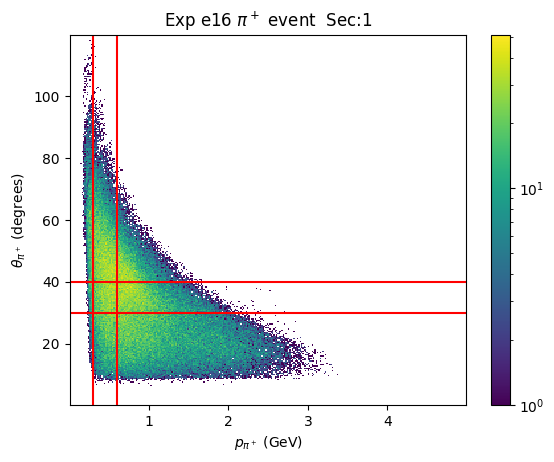

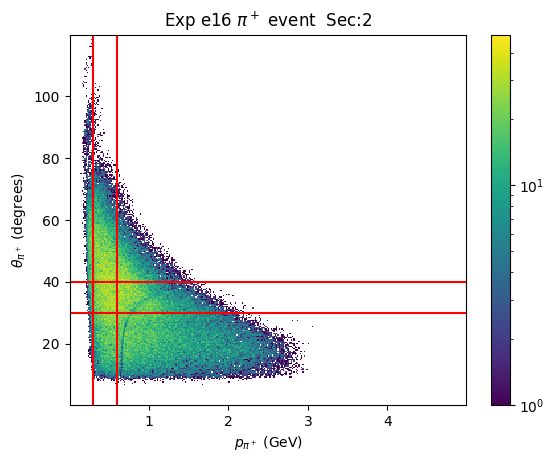

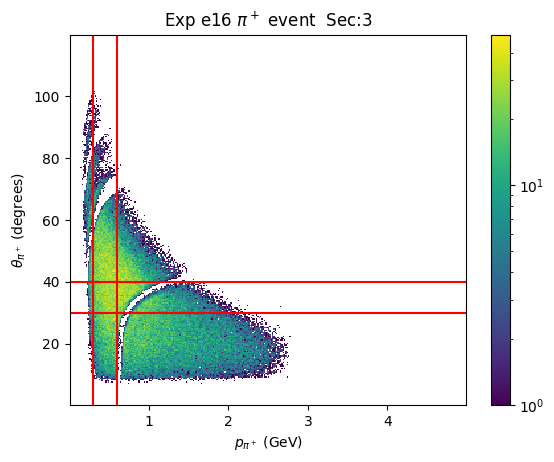

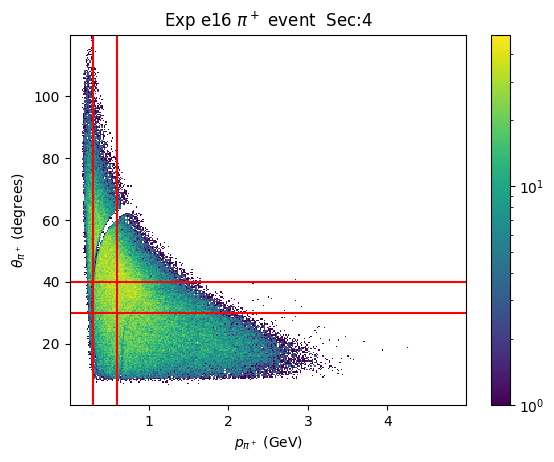

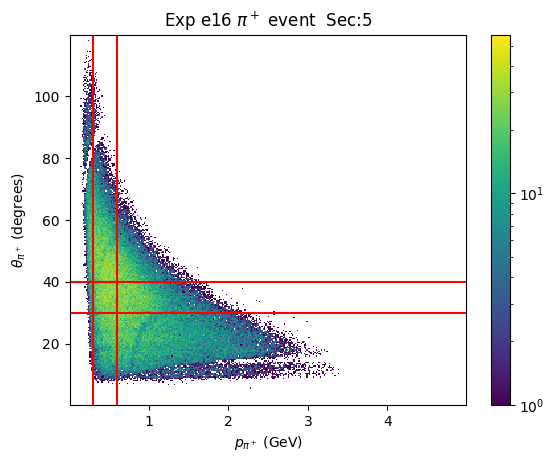

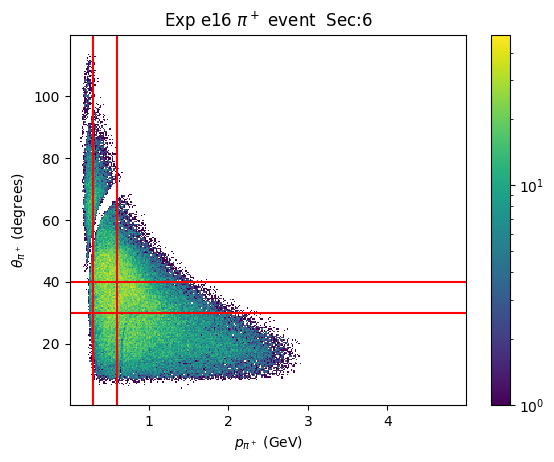

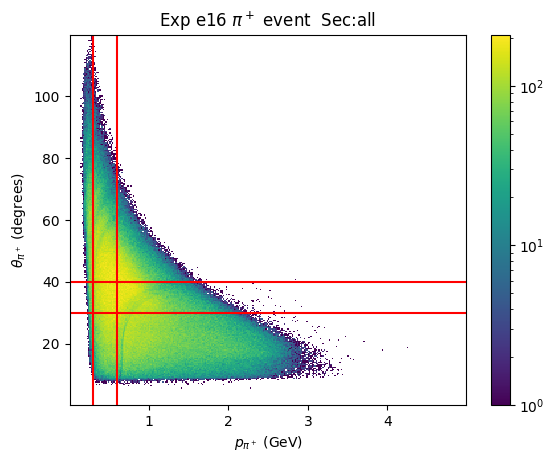

In [477]:
for sec in range(7):
    plt.hist2d(xdumb_x[sec], xdumb_y[sec], bins=(len(x), len(y)), weights=xdense2[sec],norm = mpl.colors.LogNorm())
    if sec==6:
        plt.title("Exp {} {} {}  Sec:{}".format(run,Particle,pid_cut[sel],"all"))
    else:
        plt.title("Exp {} {} {}  Sec:{}".format(run,Particle,pid_cut[sel],sec+1))
    plt.colorbar()
    plt.axvline(x=0.3,color='r')
    plt.axvline(x=0.6,color='r')
    plt.axhline(y=30,color='r')
    plt.axhline(y=40,color='r')
    plt.xlabel(xname)
    plt.ylabel(yname)
    plt.show()

In [478]:
# for sec in range(6):
#     plt.hist2d(rdumb_x[sec], rdumb_y[sec], bins=(len(x), len(y)), weights=rdense2[sec])
#     plt.title("Sim {} {} {} With Cut Superimposed Sec:{}".format(run,Particle,pid_cut[sel],sec+1))
#     plt.xlabel(xname)
#     plt.ylabel(yname)
#     plt.show()

In [479]:
def Integrate(zvals_):
    output = 0.0
    for bin1 in range(len(zvals_)):
        for bin2 in range(len(zvals_[0])):
            output += zvals_[bin1][bin2]
    return output

In [480]:
norm_exp_zvals_xy=np.zeros((7,7,xdim,ydim))
norm_exp_zvals_yx=np.zeros((7,7,ydim,xdim))

for sec1 in range(7):
    z1_xy_tmp = Bounds_on_Z_XY(exp_z_xy[sec1],x,y,0.32,0.6,30,40)
    for sec2 in range(7):
        z2_xy_tmp = Bounds_on_Z_XY(exp_z_xy[sec2],x,y,0.32,0.6,30,40)
        ratio = Integrate(z1_xy_tmp)/Integrate(z2_xy_tmp)
        for i in range(xdim):
            for j in range(ydim):
                norm_exp_zvals_xy[sec1][sec2][i][j] += exp_z_xy[sec1][i][j]
                norm_exp_zvals_xy[sec1][sec2][i][j] -= exp_z_xy[sec2][i][j]*ratio*1.5
                norm_exp_zvals_yx[sec1][sec2][j][i] += exp_z_yx[sec1][j][i]
                norm_exp_zvals_yx[sec1][sec2][j][i] -= exp_z_yx[sec2][j][i]*1.5*ratio
        for i in range(xdim):
            for j in range(ydim):
                if norm_exp_zvals_xy[sec1][sec2][i][j] < 0:
                    norm_exp_zvals_xy[sec1][sec2][i][j] = 0
                if norm_exp_zvals_yx[sec1][sec2][j][i] < 0:
                    norm_exp_zvals_yx[sec1][sec2][j][i] = 0

In [481]:
#dumb_x= np.zeros((6,len(x)*len(y)))
#dumb_y= np.zeros((6,len(x)*len(y)))
#dense2 = np.zeros((6,len(x)*len(y)))
nxdumb_x= np.zeros((7,7,xdim*ydim))
nxdumb_y= np.zeros((7,7,xdim*ydim))
nxdense2 = np.zeros((7,7,xdim*ydim))

nrdumb_x= np.zeros((7,7,xdim*ydim))
nrdumb_y= np.zeros((7,7,xdim*ydim))
nrdense2 = np.zeros((7,7,xdim*ydim))
for sec1 in range(7):
    for sec2 in range(7):
        #for i in range(len(x)):
        for i in range(xdim):
            #for j in range(len(y)):
            for j in range(ydim):
                #dumb_x[sec][i+j*len(x)]+=x[i]
                #dumb_y[sec][i+j*len(x)]+=y[j]
                #dense2[sec][i+j*len(x)]+=zvals_xy[sec][i][j]
                nxdumb_x[sec1][sec2][i+j*len(x)]+=x[i]
                nxdumb_y[sec1][sec2][i+j*len(x)]+=y[j]
                nxdense2[sec1][sec2][i+j*len(x)]+=norm_exp_zvals_xy[sec1][sec2][i][j]
            
#             rdumb_x[sec][i+j*len(xbins)]+=xbins[i]
#             rdumb_y[sec][i+j*len(xbins)]+=ybins[j]
#             rdense2[sec][i+j*len(xbins)]+=sim_zvals_xy[sec][i][j]


In [482]:
def xidx(x_):
    for i in range(len(x)):
        if i < len(x)-1:
            if x_ >= x[i] and x_<x[i+1]:
                return i
        elif i == len(x)-1:
            if x_ == x[i]:
                return i
        else:
            return -1

def yidx(y_):
    for i in range(len(y)):
        if i < len(y)-1:
            if y_ >= y[i] and y_< y[i+1]:
                return i
        elif i == len(y)-1:
            if y_ == y[i]:
                return i
        else:
            return -1

TypeError: 'int' object is not callable

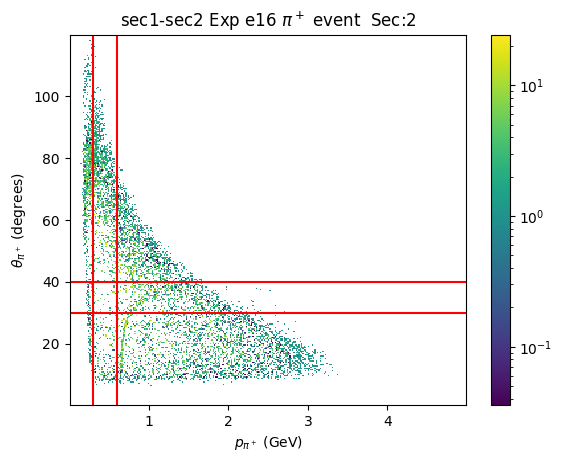

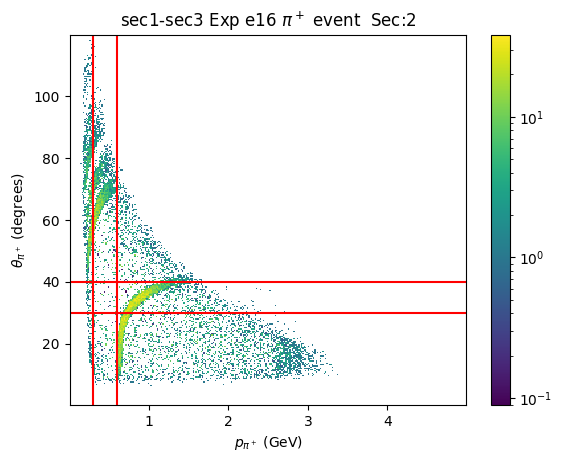

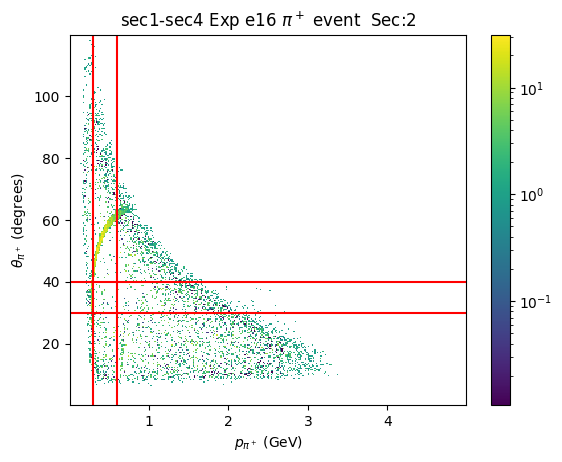

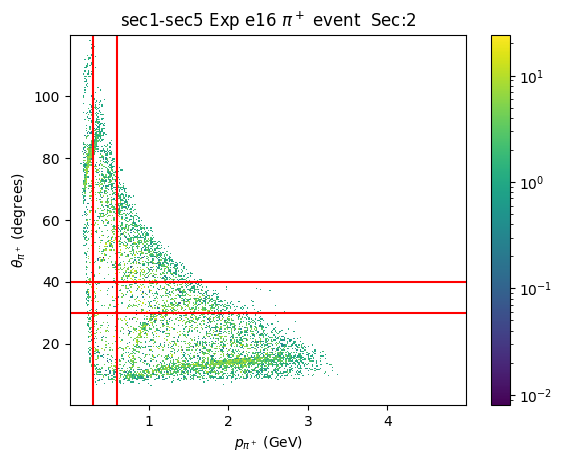

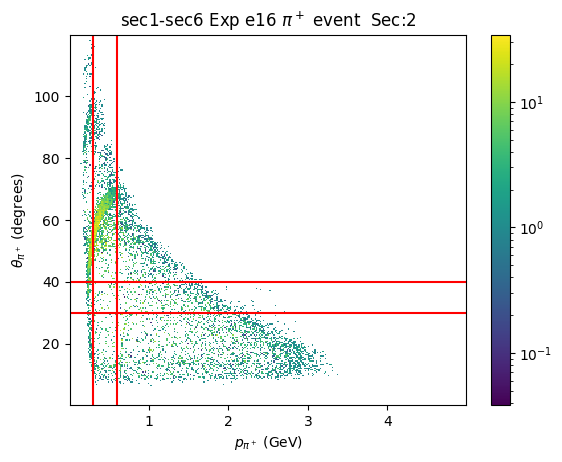

...

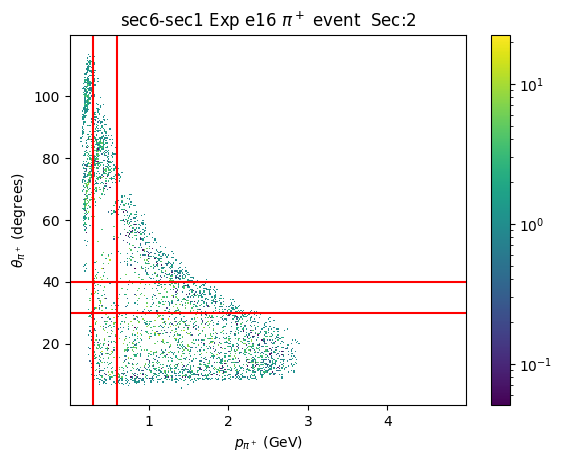

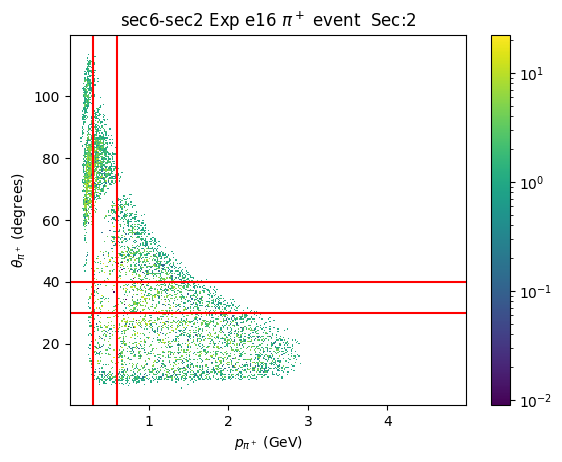

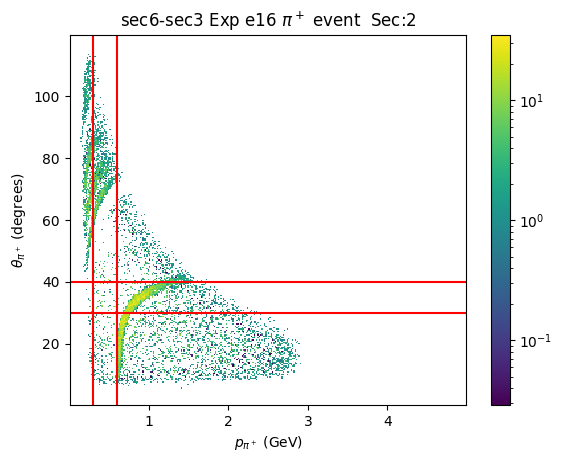

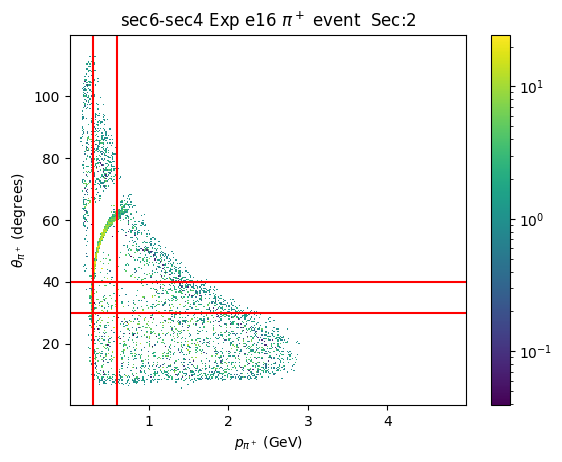

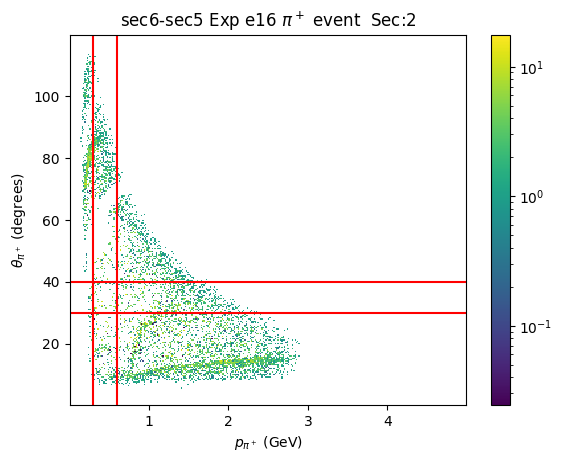

In [488]:


for sec1 in range(6):
    for sec2 in range(6):
        if sec1 != sec2:
            #if (sec1 == 0 and sec2 ==3) or ((sec1 == 1 or sec1==2 or sec1==4 or sec1==5) and (sec2 ==0 or sec2 == 3)) or (sec1 == 3 and (sec2==0 or sec2==1)):
            plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())

            if sec==6:
                plt.title("{}-{} Exp {} {} {}  Sec:{}".format(sec_names[sec1],sec_names[sec2],run,Particle,pid_cut[sel],"all"))
            else:
                plt.title("{}-{} Exp {} {} {}  Sec:{}".format(sec_names[sec1],sec_names[sec2],run,Particle,pid_cut[sel],sec+1))
            #print("asdf",h[3])
            plt.colorbar()
            plt.axvline(x=0.3,color='r')
            plt.axvline(x=0.6,color='r')
            plt.axhline(y=30,color='r')
            plt.axhline(y=40,color='r')
            plt.xlabel(xname)
            plt.ylabel(yname)
            plt.show()

In [489]:
def Pbin_low(xbin_):
    return round(xedges[xbin_],3)
def Pbin_top(xbin_):
    return round(xedges[xbin_+1],3)

In [490]:
def fit_func1(x_,a_,b_,c_):
    return c_ + a_/(x_-b_)

def fit_func2(x_,a_,b_,c_):
    out = 0.0
    try: 
        out = c_ + a_*np.log(x_-b_)
        if np.isnan(out):
            return 0.0
        return out
    except RuntimeWarning:
        return c_ + a_*np.log(x_-b_)

def Linear(x_, a_, b_):
    return a_ + b_*x_

def fit_2n(x_,a_,b_,c_):
    out = np.zeros(len(x_))
    for i in range(len(x_)):
        out[i] = fit_func2(x_[i],a_,b_,c_)
    return out

def inv_fit_func2(y_,a_,b_,c_):
    return b_ + np.exp((y_-c_)/a_)

In [491]:
pars = [7.4,0.6,50]
print(fit_func2(0.8,*pars))
print(inv_fit_func2(fit_func2(0.8,*pars),*pars))

38.09015944798766
0.8


In [492]:
def theta_bin(theta_):
    output = 0
    for i in range(ydim-1):
        if theta_ >= yedges[i] and theta_ < yedges[i+1]:
            return i
    return -1

def p_bin(p_):
    output = 0
    for i in range(xdim-1):
        if p_ >= xedges[i] and p_ < xedges[i+1]:
            return i
    return -1

In [493]:
side_name = ['bot','top']

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


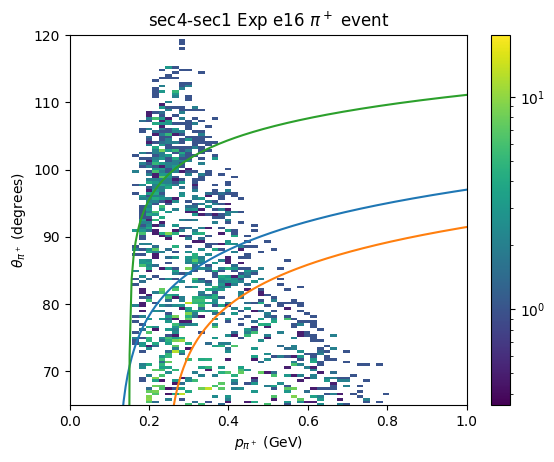

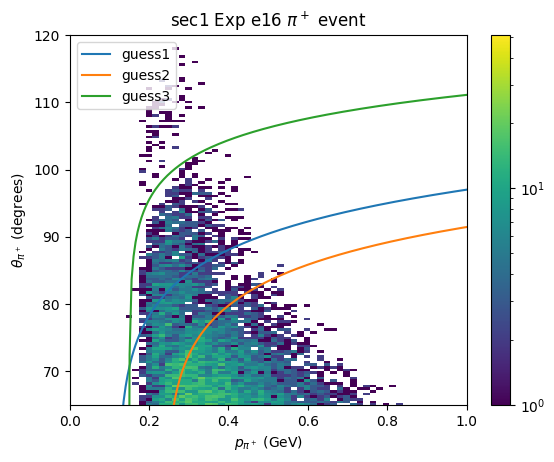

In [494]:
# Sector 1 Experiment Focused

xbounds = [0.0,1.0]
ybounds = [65.0,120.0]


#Just an upper edge bound
#norm_exp_zvals_xy[sec1][sec2][i][j]
#exp_z_xy[sec1][i][j]
#best isolation option is 4 - 1
#looks like it's close to theta = 90
sec1 = 3
sec2 = 0
cont_x = np.linspace(xbounds[0],xbounds[1],200)

ini_par = [7.817,0.12,98]
ini_par2 = [7.5,0.24,93.5]
ini_par3 = [5.5,0.15,112]

plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*ini_par),label='guess')
plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess')
plt.plot(cont_x,fit_2n(cont_x,*ini_par3),label='guess')
plt.title("{}-{} Exp {} {} {}".format(sec_names[sec1],sec_names[sec2],run,Particle,pid_cut[sel]))
plt.xlabel(xname)
plt.ylabel(yname)
plt.colorbar()
plt.ylim(ybounds)
plt.xlim(xbounds)
plt.show()

plt.hist2d(xdumb_x[sec2], xdumb_y[sec2], bins=(len(x), len(y)), weights=xdense2[sec2],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*ini_par),label='guess1')
plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess2')
plt.plot(cont_x,fit_2n(cont_x,*ini_par3),label='guess3')
plt.title("{} Exp {} {} {}".format(sec_names[sec2],run,Particle,pid_cut[sel]))
plt.xlabel(xname)
plt.ylabel(yname)
plt.colorbar()
plt.ylim(ybounds)
plt.xlim(xbounds)
plt.legend()
plt.show()




In [495]:
cut1_sec1_x = x
cut1_sec1_y = y
cut1_sec1_z_yx = np.zeros((ydim,xdim))
cut1_sec1_z_xy =np.zeros((xdim,ydim))

cut2_sec1_x = x
cut2_sec1_y = y
cut2_sec1_z_yx = np.zeros((ydim,xdim))
cut2_sec1_z_xy =np.zeros((xdim,ydim))

for xbin in range(len(x)):
    for ybin in range(len(y)):
        if y[ybin] > fit_func2(x[xbin],*ini_par2) and y[ybin] < fit_func2(x[xbin],*ini_par):
            cut1_sec1_z_yx[ybin][xbin] = norm_exp_zvals_yx[sec1][sec2][ybin][xbin]
            cut1_sec1_z_xy[xbin][ybin] = norm_exp_zvals_xy[sec1][sec2][xbin][ybin]
        if y[ybin] < fit_func2(x[xbin],*ini_par3):
            cut2_sec1_z_yx[ybin][xbin] = exp_z_yx[sec2][ybin][xbin]
            cut2_sec1_z_xy[xbin][ybin] = exp_z_xy[sec2][xbin][ybin]

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


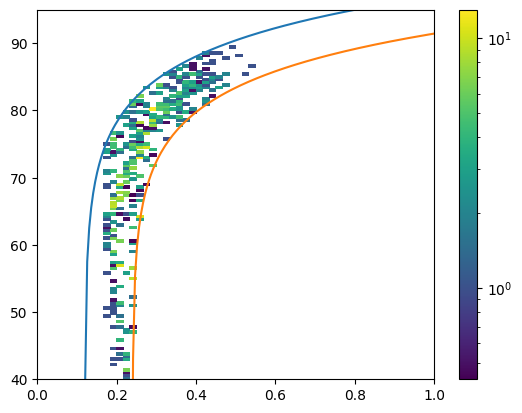

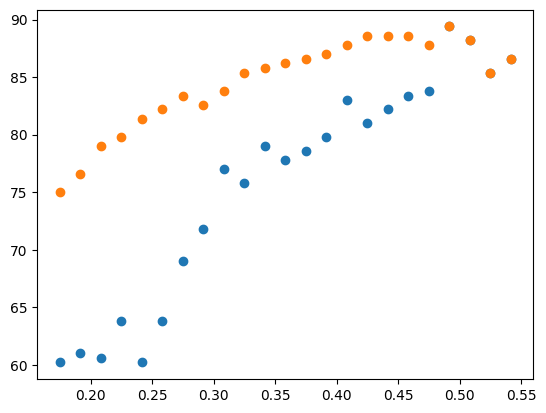

In [496]:
#cut1_xy = [[x[xbin],y]]

plt.pcolor(cut1_sec1_x,cut1_sec1_y,cut1_sec1_z_yx,norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*ini_par),label='guess')
plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess')
plt.ylim([40,95])
plt.xlim(xbounds)
plt.colorbar()
plt.show()


cut1_sec1_x2 = []
cut1_sec1_y2_0 = []
cut1_sec1_y2_1 = []
top = 0.0
bot = 0.0
for xbin in range(len(cut1_sec1_x)):
    if np.max(cut1_sec1_z_xy[xbin])>0.0:
        cut1_sec1_x2.append(cut1_sec1_x[xbin])
        top = 0.0
        bot = 100.0
        for ybin in range(len(cut1_sec1_y)):
            if cut1_sec1_y[ybin] > 60.0:
                if cut1_sec1_z_xy[xbin][ybin] > 0.0 and cut1_sec1_y[ybin]>top:
                    top = cut1_sec1_y[ybin]
                if cut1_sec1_z_xy[xbin][ybin] > 0.0 and cut1_sec1_y[ybin] < bot:
                    bot = cut1_sec1_y[ybin]
        cut1_sec1_y2_0.append(bot)
        cut1_sec1_y2_1.append(top)
        
plt.scatter(cut1_sec1_x2,cut1_sec1_y2_0)
plt.scatter(cut1_sec1_x2,cut1_sec1_y2_1)
plt.show()
                
                
    
        

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


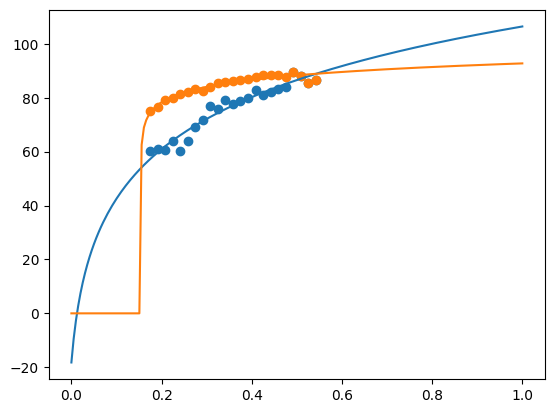

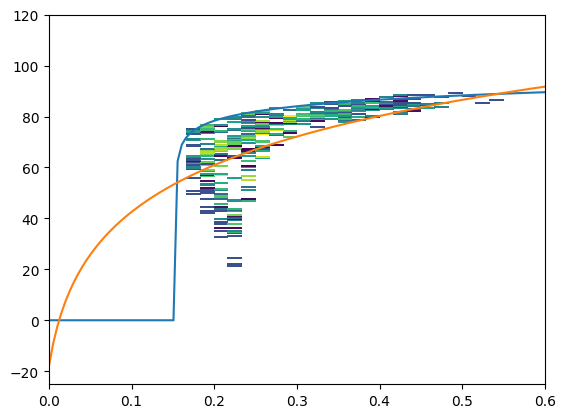

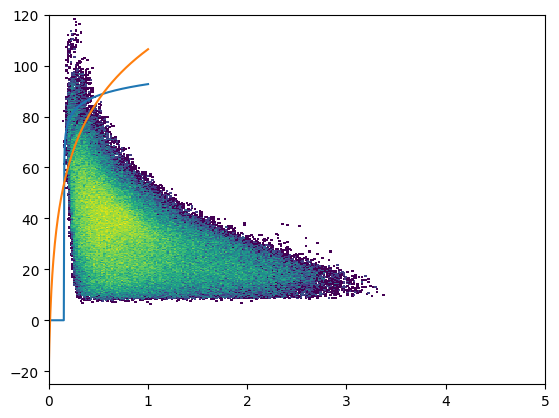

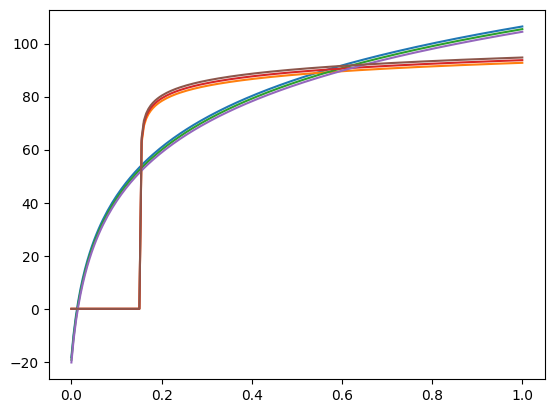

In [497]:
pars10, pars10_cov = op.curve_fit(fit_2n,cut1_sec1_x2,cut1_sec1_y2_0,p0=ini_par,maxfev = 5000)
plt.plot(cont_x,fit_2n(cont_x,*pars10))
pars11, pars11_cov = op.curve_fit(fit_2n,cut1_sec1_x2,cut1_sec1_y2_1,p0=ini_par,maxfev = 5000)
plt.plot(cont_x,fit_2n(cont_x,*pars11))
plt.scatter(cut1_sec1_x2,cut1_sec1_y2_0)
plt.scatter(cut1_sec1_x2,cut1_sec1_y2_1)
plt.show()

plt.pcolor(cut1_sec1_x,cut1_sec1_y,cut1_sec1_z_yx,norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*pars11))
plt.plot(cont_x,fit_2n(cont_x,*pars10))
plt.xlim([0.0,0.6])
plt.show()

plt.pcolor(x,y,exp_z_yx[0],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*pars11))
plt.plot(cont_x,fit_2n(cont_x,*pars10))
#plt.xlim([0.0,1.0])
plt.show()

cut1_sec1_pars = np.zeros((2,3,3))

width = [0.0,1,2]

for cut in range(3):
    for i in range(3):
        if i==2:
            cut1_sec1_pars[0][cut][i] = pars10[i]-width[cut]
            cut1_sec1_pars[1][cut][i] = pars11[i]+width[cut]
        else:
            cut1_sec1_pars[0][cut][i] = pars10[i]
            cut1_sec1_pars[1][cut][i] = pars11[i]
    plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[0][cut]))
    plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[1][cut]))
plt.show()
            





In [ ]:
#cut 1 
#Sec 1

# theta_start = 65
# theta_end = 92
# yidx_cov = yidx(theta_end)-yidx(theta_start)

# cut1_x = []
# cut1_y = []
# cut1_e = []
# cut1_x2 = np.zeros(len(x))
# cut1_e2 = np.zeros(len(x))
# cut1_n2 = np.zeros(len(x))
# cut1_y2 = np.zeros((2,3,len(x)))

# #sides {tight,mid,loose} pars
# cut1_sec1_pars = np.zeros((2,3,3))

# width = [1.5,2,2.5]

# for xbin in range(len(x)):
#     for ybin in range(len(y)):
#         if cut1_sec1_z_yx[ybin][xbin] >0.0 and y[ybin]>65:
#             cut1_x.append(x[xbin])
#             cut1_y.append(y[ybin])
#             cut1_e.append(1./cut1_sec1_z_yx[ybin][xbin])
            

# plt.scatter(cut1_x,cut1_y)
# plt.errorbar(cut1_x,cut1_y,yerr=cut1_e,ls='none')
# pars, pars_cov = op.curve_fit(fit_2n,cut1_x,cut1_y,sigma=cut1_e,p0=ini_par,maxfev = 5000)
# plt.plot(cont_x,fit_2n(cont_x,*pars))
# n=0
# for xbin in range(len(x)):
#     for b in range(len(cut1_x)):
#         if cut1_x[b] == x[xbin]:
#             cut1_x2[xbin] = x[xbin]
#             cut1_n2[xbin] += 1
#             cut1_e2[xbin] = np.sqrt(cut1_e2[xbin]*cut1_e2[xbin]*(cut1_n2[xbin]-1)/(cut1_n2[xbin])+cut1_e[b]*(cut1_y[b]-fit_func2(cut1_x[b],*pars))**2/(cut1_n2[xbin]))
#             for cut in range(3):
#                 cut1_y2[0][cut][xbin] = fit_func2(cut1_x[b],*pars) + width[cut]*cut1_e2[xbin]
#                 cut1_y2[1][cut][xbin] = fit_func2(cut1_x[b],*pars) - width[cut]*cut1_e2[xbin]



# for cut in range(3):
#     for side in range(2):
#         pars1, pars_cov1 = op.curve_fit(fit_2n,Remove_Zeros_X(cut1_x2,cut1_y2[side][cut]),Remove_Zeros_Y(cut1_y2[side][cut]),p0=pars,maxfev = 5000)
#         print(pars1,cut_name[cut],side_name[side])
#         for i in range(3):
#             cut1_sec1_pars[side][cut][i] = pars1[i]
            
#         if side ==0:
#             plt.scatter(Remove_Zeros_X(cut1_x2,cut1_y2[side][cut]),Remove_Zeros_Y(cut1_y2[side][cut]),color=cut_cols[cut])
#             plt.plot(cont_x,fit_2n(cont_x,*pars1),color=cut_cols[cut],label=cut_name[cut])
#         else:
#             plt.scatter(Remove_Zeros_X(cut1_x2,cut1_y2[side][cut]),Remove_Zeros_Y(cut1_y2[side][cut]),color=cut_cols[cut])
#             plt.plot(cont_x,fit_2n(cont_x,*pars1),color=cut_cols[cut])

# plt.ylim(ybounds)
# plt.xlim(xbounds)
# plt.show()




In [ ]:


#plt.pcolor(cut1_sec1_x,cut1_sec1_y,cut1_sec1_z_yx,norm = mpl.colors.LogNorm())
# plt.hist2d(xdumb_x[sec2], xdumb_y[sec2], bins=(len(x), len(y)), weights=xdense2[sec2],norm = mpl.colors.LogNorm())
# for cut in range(3):
#     for side in range(2):
#         if side ==0:
#             plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[side][cut]),color=cut_cols[cut],label=cut_name[cut])
#         else:
#             plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[side][cut]),color=cut_cols[cut])

# plt.ylim(ybounds)
# plt.xlim(xbounds)
# plt.show()

In [ ]:
# plt.pcolor(cut2_sec1_x,cut2_sec1_y,cut2_sec1_z_yx,norm = mpl.colors.LogNorm())
# #plt.hist2d(xdumb_x[sec2], xdumb_y[sec2], bins=(len(x), len(y)), weights=xdense2[sec2],norm = mpl.colors.LogNorm())
# for cut in range(3):
#     for side in range(2):
# #         if side ==0:
# #             plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[side][cut]),color=cut_cols[cut],label=cut_name[cut])
# #         else:
# #             plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[side][cut]),color=cut_cols[cut])

# plt.ylim(ybounds)
# plt.xlim(xbounds)
# plt.show()

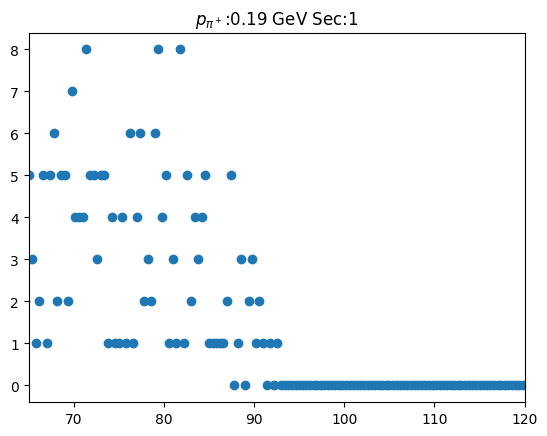

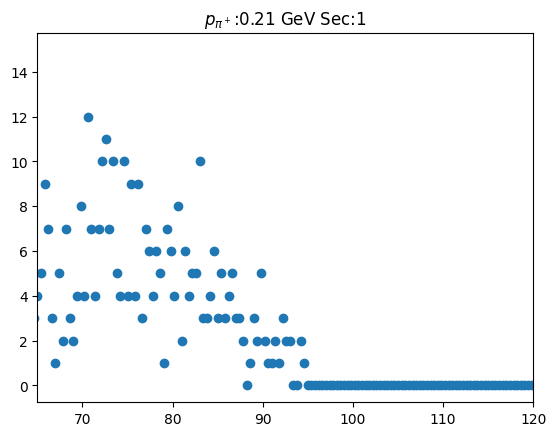

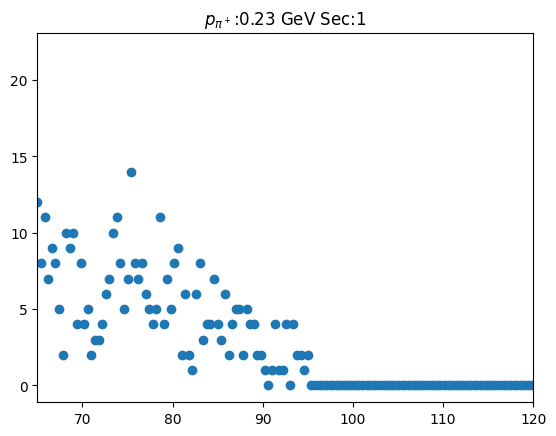

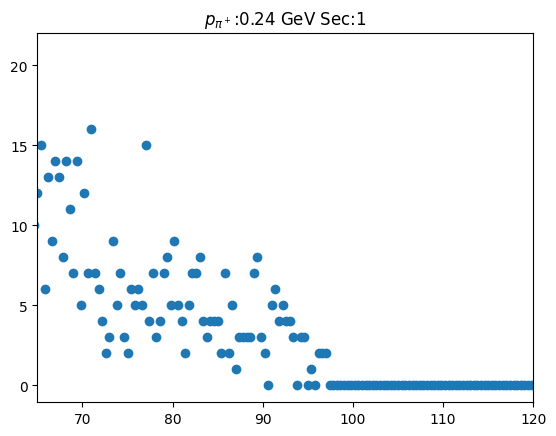

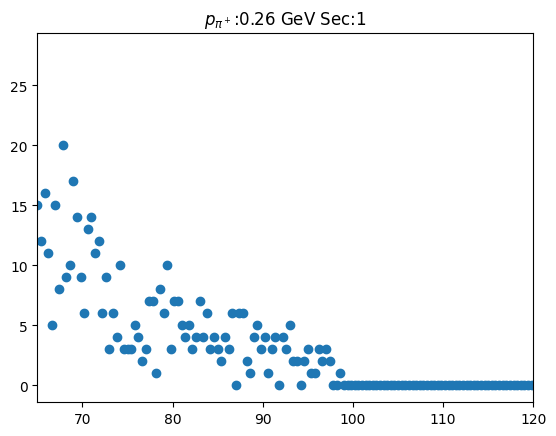

...

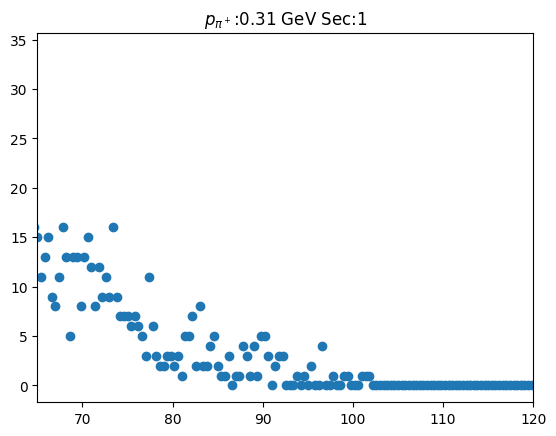

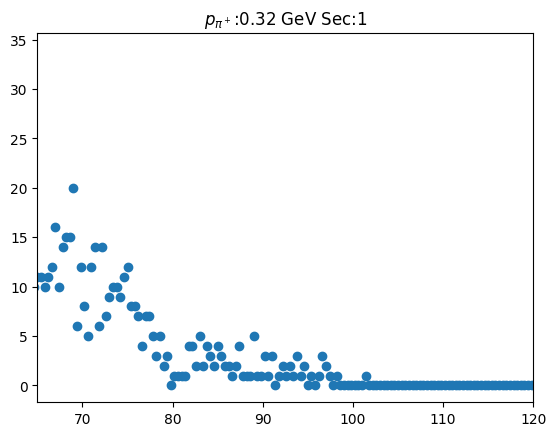

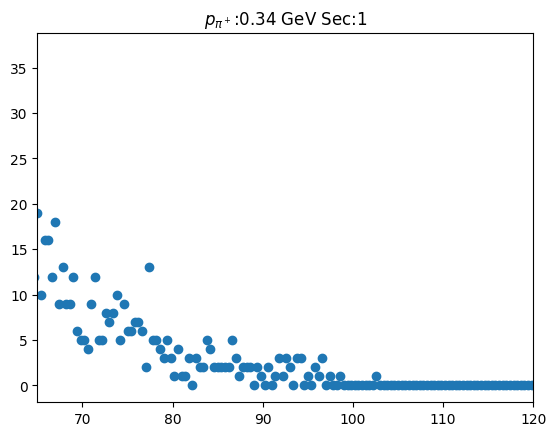

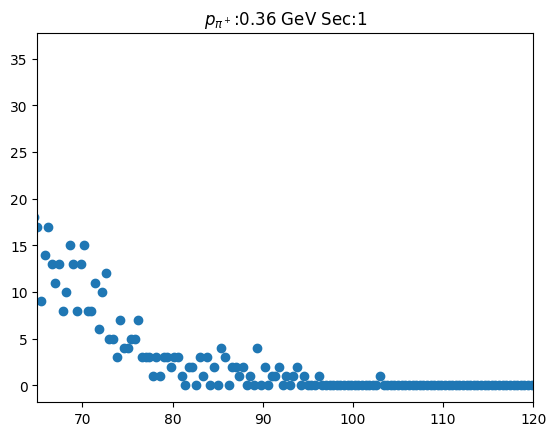

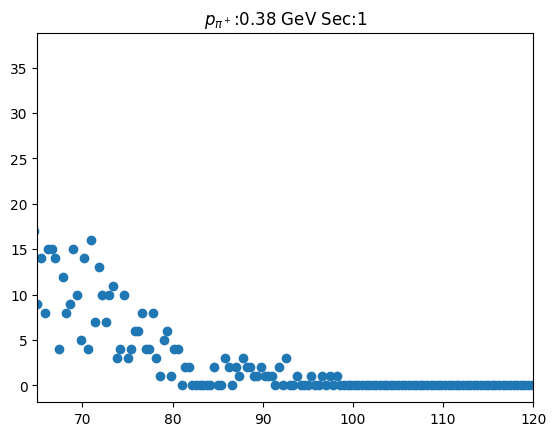

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


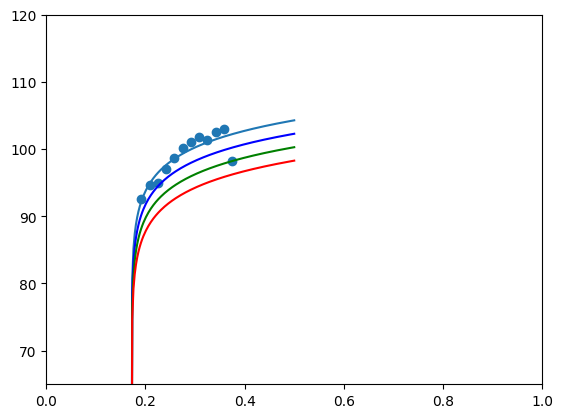

In [498]:
#Sec1 Cut 2
sec = 0

cut2_sec1_pars = np.zeros((3,3))

cut2_sec1_x = []
cut2_sec1_y = []

width= [2,4,6]
 
for xbin in range(len(x)):
    if x[xbin] > 0.18 and x[xbin] < 0.38:
        cut2_sec1_x.append(x[xbin])
        cut2_sec1_y.append(np.max(Remove_Zeros_X(y,cut2_sec1_z_xy[xbin])))
        plt.scatter(y,cut2_sec1_z_xy[xbin])
        plt.xlim(ybounds)
        plt.title("{}:{:.2f} GeV Sec:{}".format(Momentum,x[xbin],sec+1))
        plt.show()
        
        
plt.scatter(cut2_sec1_x,cut2_sec1_y)
pars, pars_cov = op.curve_fit(fit_2n,cut2_sec1_x,cut2_sec1_y,p0=ini_par3,maxfev=5000)
cont_x = np.linspace(0.0,0.5,200)
plt.plot(cont_x,fit_2n(cont_x,*pars))
for cut in range(3):
    for i in range(3):
        if i==2:
            cut2_sec1_pars[cut][i] = pars[i]-width[cut]
        else:
            cut2_sec1_pars[cut][i] = pars[i]
    plt.plot(cont_x,fit_2n(cont_x,*cut2_sec1_pars[cut]),label=cut_name[cut],color=cut_cols[cut])
plt.xlim(xbounds)
plt.ylim(ybounds)
plt.show()

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


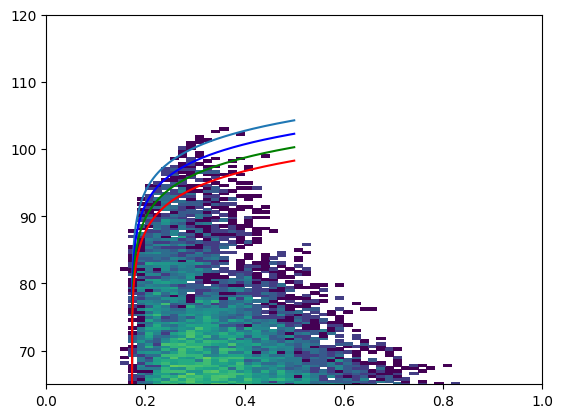

In [499]:
plt.pcolor(cut1_sec1_x,cut1_sec1_y,cut2_sec1_z_yx,norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*pars))
for cut in range(3):
    for i in range(3):
        if i==2:
            cut2_sec1_pars[cut][i] = pars[i]-width[cut]
        else:
            cut2_sec1_pars[cut][i] = pars[i]
    plt.plot(cont_x,fit_2n(cont_x,*cut2_sec1_pars[cut]),label=cut_name[cut],color=cut_cols[cut])
plt.ylim(ybounds)
plt.xlim(xbounds)
plt.show()

In [500]:
cut_ver = 1

exp_wcuts_z_xy = np.zeros((6,len(x),len(y)))
exp_wcuts_z_yx = np.zeros((6,len(y),len(x)))

sec=0

for xbin in range(len(x)):
    for ybin in range(len(y)):
        if y[ybin] < fit_func2(x[xbin],*cut2_sec1_pars[cut_ver]):
            if y[ybin] > fit_func2(x[xbin],*cut1_sec1_pars[1][cut_ver]) or y[ybin] < fit_func2(x[xbin],*cut1_sec1_pars[0][cut_ver]):
                exp_wcuts_z_xy[sec][xbin][ybin] = exp_z_xy[sec][xbin][ybin]
                exp_wcuts_z_yx[sec][ybin][xbin] = exp_z_yx[sec][ybin][xbin]
            
            
            
            

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


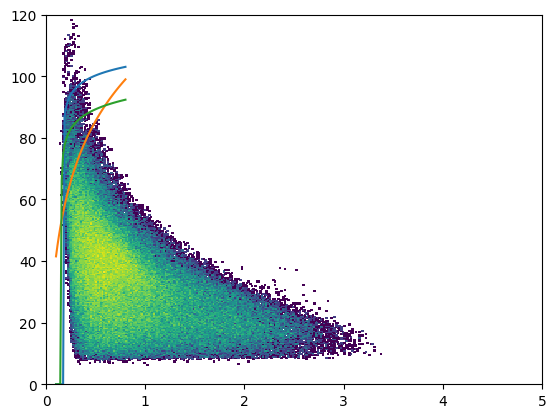

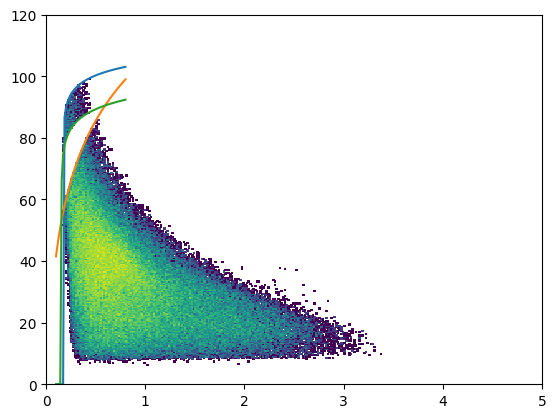

In [501]:
cont_x = np.linspace(0.1,0.8)
plt.pcolor(x,y,exp_z_yx[0],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*cut2_sec1_pars[cut_ver]))
plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[0][cut_ver]))
plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[1][cut_ver]))
plt.show()
plt.pcolor(x,y,exp_wcuts_z_yx[0],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*cut2_sec1_pars[cut_ver]))
plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[0][cut_ver]))
plt.plot(cont_x,fit_2n(cont_x,*cut1_sec1_pars[1][cut_ver]))
plt.show()

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


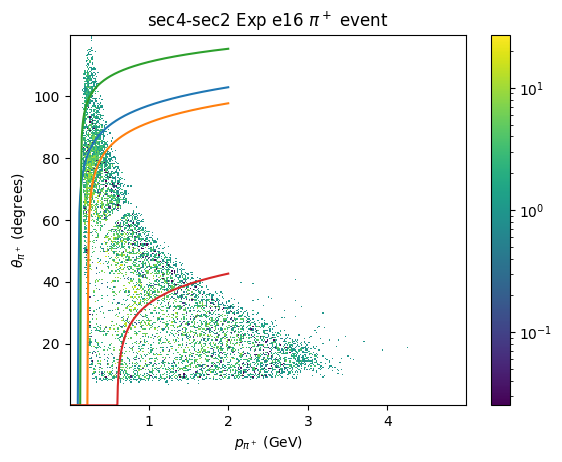

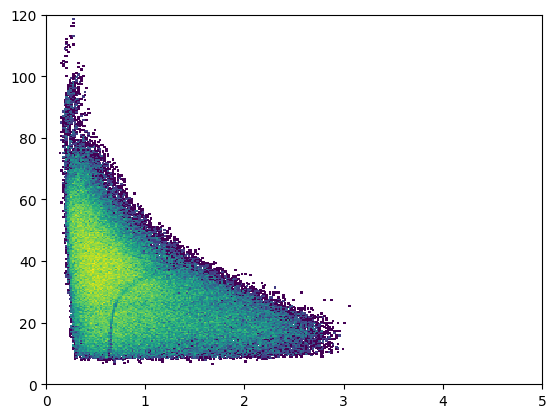

In [502]:
#Sector 2!

sec1=3
sec2=1

ini_par1 = [7.817,0.12,98]
ini_par2 = [7.5,0.24,93.5]
ini_par3 = [5.5,0.15,112]
ini_par4 = [7.8,0.6,40]
cont_x = np.linspace(0.0,2.0,200)

plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*ini_par1),label='guess1')
plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess2')
plt.plot(cont_x,fit_2n(cont_x,*ini_par3),label='guess3')
plt.plot(cont_x,fit_2n(cont_x,*ini_par4),label='guess4')
plt.title("{}-{} Exp {} {} {}".format(sec_names[sec1],sec_names[sec2],run,Particle,pid_cut[sel]))
plt.xlabel(xname)
plt.ylabel(yname)
plt.colorbar()
#plt.ylim(ybounds)
#plt.xlim(xbounds)
plt.show()

plt.pcolor(x,y,exp_z_yx[1],norm = mpl.colors.LogNorm())
plt.show()

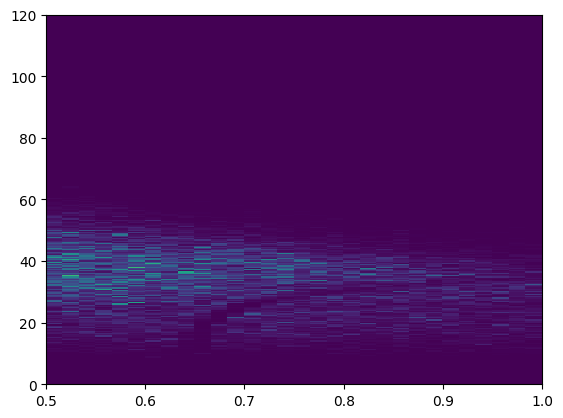

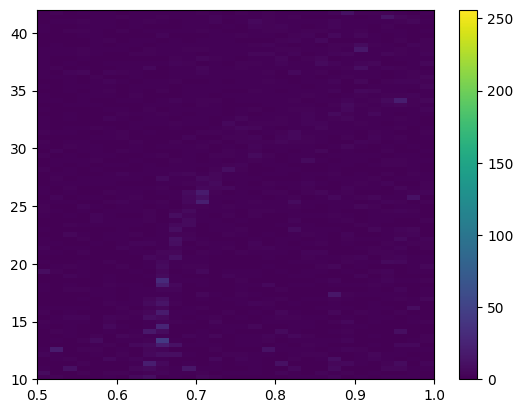

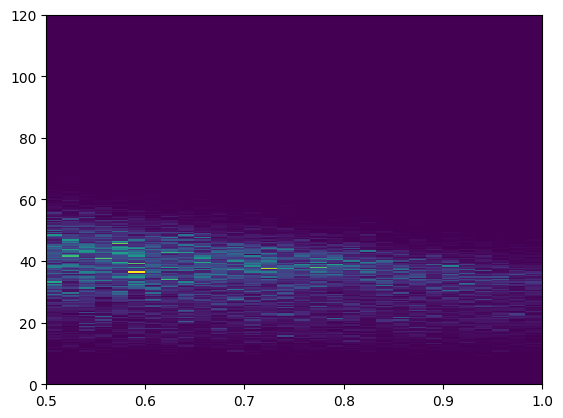

In [503]:
mag_sec2_z_xy = np.zeros((len(x),len(y)))
mag_sec2_z_yx = np.zeros((len(y),len(x)))
mag_sec1_z_xy = np.zeros((len(x),len(y)))
mag_sec1_z_yx = np.zeros((len(y),len(x)))
mag_sub_sec12_z_xy = np.zeros((len(x),len(y)))
mag_sub_sec12_z_yx = np.zeros((len(y),len(x)))

for xbin in range(len(x)):
    for ybin in range(len(y)):
        if exp_z_xy[1][xbin][ybin]>0.0:
            mag_sec2_z_xy[xbin][ybin] = exp_z_xy[1][xbin][ybin]**3
            mag_sec2_z_yx[ybin][xbin] = exp_z_yx[1][ybin][xbin]**3
            mag_sec1_z_xy[xbin][ybin] = exp_z_xy[0][xbin][ybin]**3
            mag_sec1_z_yx[ybin][xbin] = exp_z_yx[0][ybin][xbin]**3
            mag_sub_sec12_z_yx[ybin][xbin] = (exp_z_yx[0][ybin][xbin]/exp_z_yx[1][ybin][xbin])**2
            mag_sub_sec12_z_xy[xbin][ybin] = (exp_z_xy[0][xbin][ybin]/exp_z_xy[1][xbin][ybin])**2
            
plt.pcolor(x,y,mag_sec2_z_yx)
plt.xlim([0.5,1])
plt.show()


#,norm = mpl.colors.LogNorm()
plt.pcolor(x,y,mag_sub_sec12_z_yx)
plt.xlim([0.5,1])
plt.ylim([10,42])
plt.colorbar()
plt.show()

plt.pcolor(x,y,mag_sec1_z_yx)
plt.xlim([0.5,1])
plt.show()
        

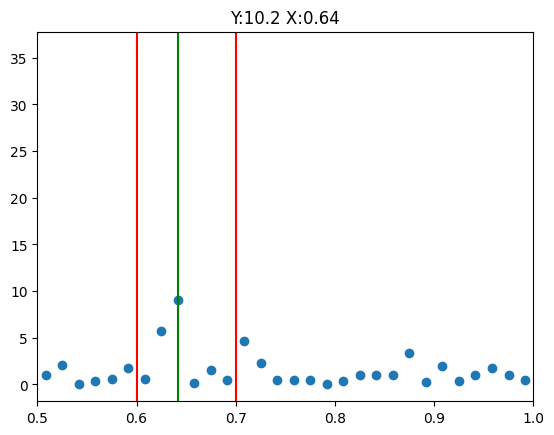

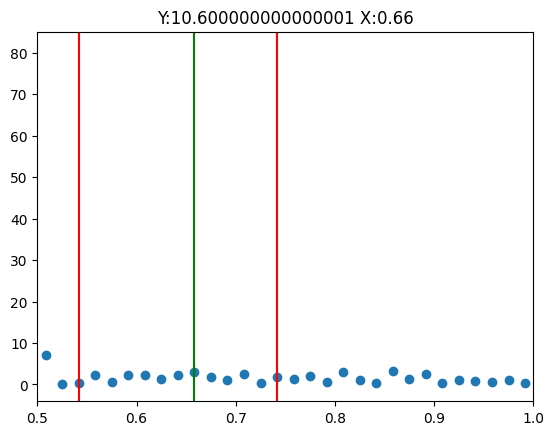

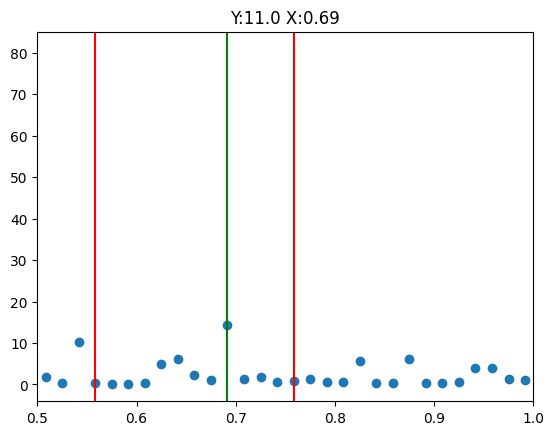

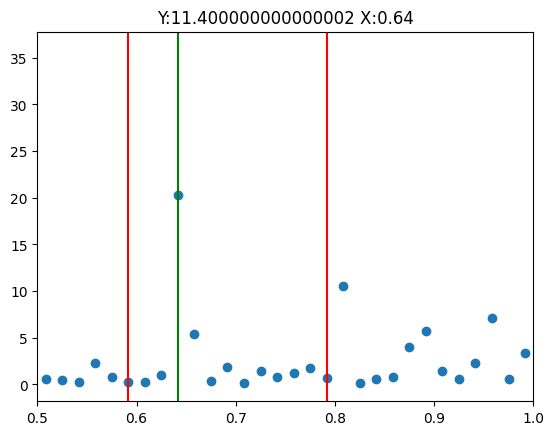

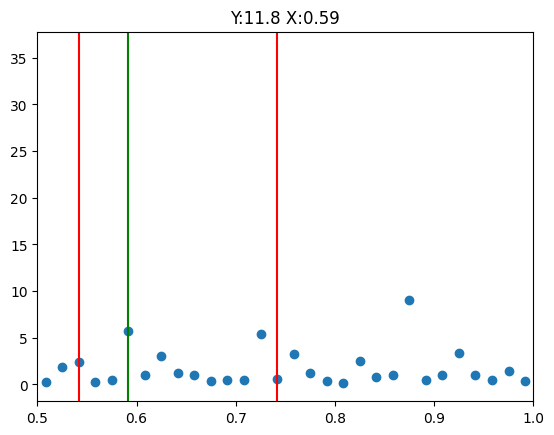

...

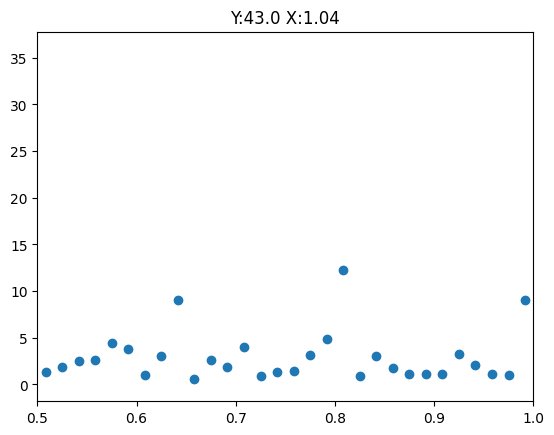

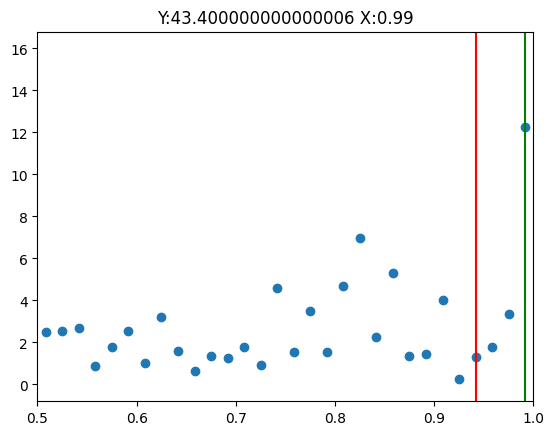

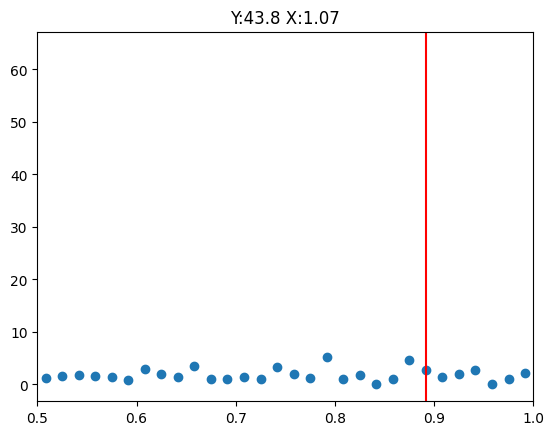

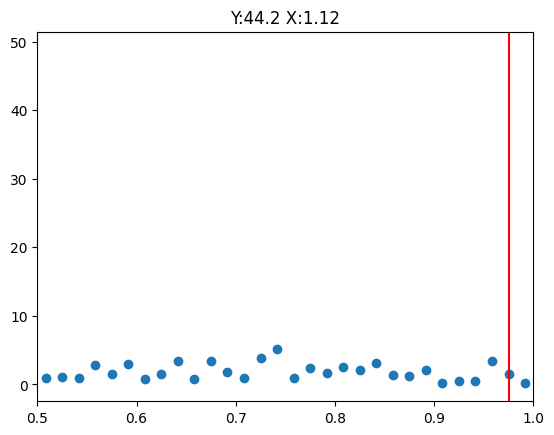

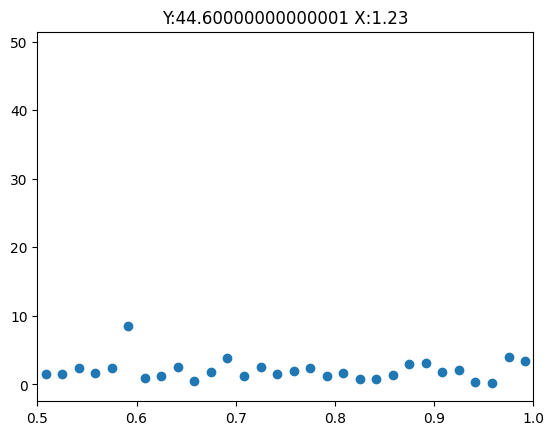

In [504]:
cut1_sec2_x = []
cut1_sec2_y = []
check_bounds = [0.6,0.7]
for ybin in range(len(y)):
    if y[ybin]>10 and y[ybin]<45:
        plt.scatter(x,mag_sub_sec12_z_yx[ybin])
        tmp_x = Bounds_on_Y(x,check_bounds[0],check_bounds[1])
        tmp_y = Bounds_on_X_From_Y(mag_sub_sec12_z_yx[ybin],x,check_bounds[0],check_bounds[1])
        plt.axvline(x=tmp_x[np.argmax(tmp_y)],color='g')
        plt.axvline(x=check_bounds[0],color='r')
        plt.axvline(x=check_bounds[1],color='r')
        cut1_sec2_x.append(tmp_x[np.argmax(tmp_y)])
        cut1_sec2_y.append(y[ybin])
        plt.xlim([0.5,1.0])
        check_bounds[0] = tmp_x[np.argmax(tmp_y)]-0.1
        check_bounds[1] = tmp_x[np.argmax(tmp_y)]+0.1
        plt.title("Y:{} X:{:.2f}".format(y[ybin],tmp_x[np.argmax(tmp_y)]))
        plt.show()
    


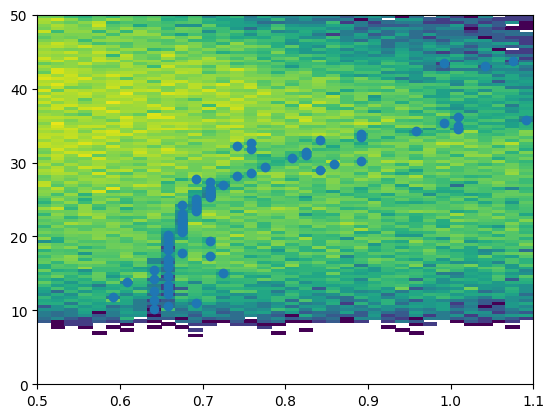

In [505]:

plt.pcolor(x,y,exp_z_yx[1],norm = mpl.colors.LogNorm())
plt.scatter(cut1_sec2_x,cut1_sec2_y)
plt.ylim([0.0,50])
plt.xlim([0.5,1.1])
plt.show()

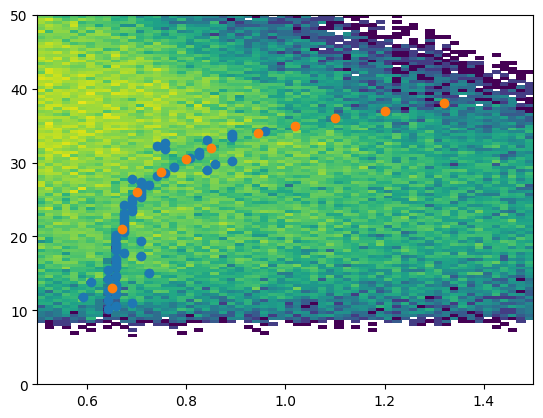

In [528]:

fit_cut1_sec2_x1 = Bounds_on_Y(cut1_sec2_x,0.0,0.98)
fit_cut1_sec2_y1 = Bounds_on_X_From_Y(cut1_sec2_y,cut1_sec2_x,0.0,0.98)

fit_cut1_sec2_x = []
fit_cut1_sec2_y = []

#for i in range(len(fit_cut1_sec2_x1)):
#    fit_cut1_sec2_x.append(fit_cut1_sec2_x1[i])
#    fit_cut1_sec2_y.append(fit_cut1_sec2_y1[i])

fit_cut1_sec2_x.append(0.65)
fit_cut1_sec2_y.append(13)

fit_cut1_sec2_x.append(0.67)
fit_cut1_sec2_y.append(21)

fit_cut1_sec2_x.append(0.7)
fit_cut1_sec2_y.append(26)

fit_cut1_sec2_x.append(0.75)
fit_cut1_sec2_y.append(28.7)

fit_cut1_sec2_x.append(0.8)
fit_cut1_sec2_y.append(30.5)
    
    
fit_cut1_sec2_x.append(0.85)
fit_cut1_sec2_y.append(32)

fit_cut1_sec2_x.append(0.945)
fit_cut1_sec2_y.append(34)

fit_cut1_sec2_x.append(1.02)
fit_cut1_sec2_y.append(35)

fit_cut1_sec2_x.append(1.1)
fit_cut1_sec2_y.append(36)

fit_cut1_sec2_x.append(1.2)
fit_cut1_sec2_y.append(37)

fit_cut1_sec2_x.append(1.32)
fit_cut1_sec2_y.append(38)



plt.pcolor(x,y,exp_z_yx[1],norm = mpl.colors.LogNorm())

plt.scatter(fit_cut1_sec2_x1,fit_cut1_sec2_y1)
plt.scatter(fit_cut1_sec2_x,fit_cut1_sec2_y)
plt.ylim([0.0,50])
plt.xlim([0.5,1.5])
plt.show()

[ 4.99656086  0.6454997  39.96383947]
[ 4.99656086  0.6504997  38.96383947] tight
[ 4.99656086  0.6404997  40.96383947] tight
[ 4.99656086  0.6654997  38.46383947] mid
[ 4.99656086  0.6254997  41.46383947] mid
[ 4.99656086  0.6604997  37.96383947] loose
[ 4.99656086  0.6304997  41.96383947] loose


/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


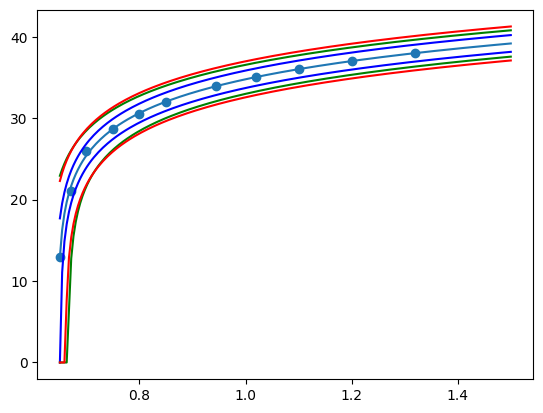

In [530]:
width = [1,1.5,2]
width2 = [0.005,0.02,0.015]

cut1_sec2_pars = np.zeros((2,3,3))

plt.scatter(fit_cut1_sec2_x,fit_cut1_sec2_y)
#fit_cut1_sec2_x = Bounds_on_Y(cut1_sec2_x,0.0,1.0)
#fit_cut1_sec2_y = Bounds_on_X_From_Y(cut1_sec2_y,cut1_sec2_x,0.0,1.0)
pars, pars_cov = op.curve_fit(fit_2n,fit_cut1_sec2_x,fit_cut1_sec2_y,p0=ini_par4,maxfev=5000)
print(pars)
cont_x = np.linspace(np.min(fit_cut1_sec2_x),1.5,200)
plt.plot(cont_x,fit_2n(cont_x,*pars))
for cut in range(3):
    for i in range(3):
        if i==2:
            cut1_sec2_pars[0][cut][i] = pars[i]-width[cut]
            cut1_sec2_pars[1][cut][i] = pars[i]+width[cut]
        elif i==1:
            cut1_sec2_pars[0][cut][i] = pars[i]+width2[cut]
            cut1_sec2_pars[1][cut][i] = pars[i]-width2[cut]
        else:
            cut1_sec2_pars[0][cut][i] = pars[i]
            cut1_sec2_pars[1][cut][i] = pars[i]
    print(cut1_sec2_pars[0][cut],cut_name[cut])
    print(cut1_sec2_pars[1][cut],cut_name[cut])
    plt.plot(cont_x,fit_2n(cont_x,*cut1_sec2_pars[0][cut]),color=cut_cols[cut])
    plt.plot(cont_x,fit_2n(cont_x,*cut1_sec2_pars[1][cut]),color=cut_cols[cut])
plt.show()

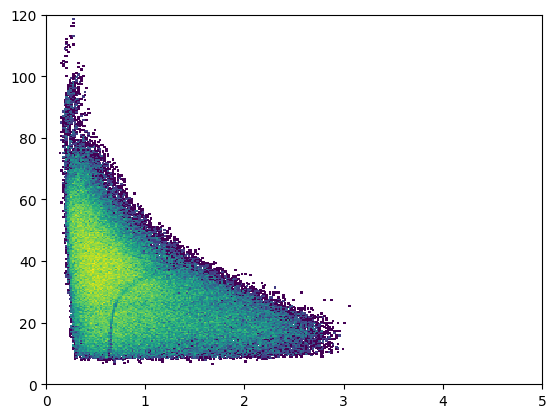

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


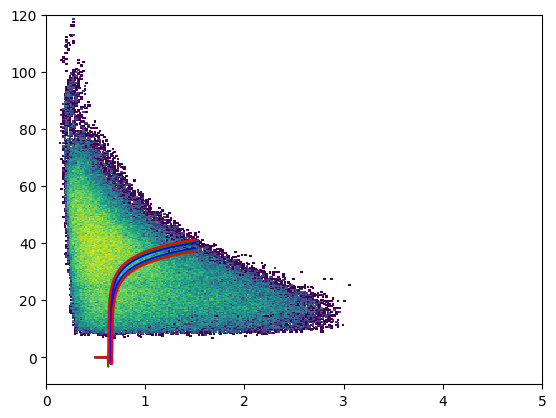

In [531]:
plt.pcolor(x,y,exp_z_yx[1],norm = mpl.colors.LogNorm())
plt.show()
cont_x = np.linspace(0.5,1.5,200)
plt.pcolor(x,y,exp_z_yx[1],norm = mpl.colors.LogNorm())
for side in range(2):
    for cut in range(3):
        plt.plot(cont_x,fit_2n(cont_x,*cut1_sec2_pars[side][cut]),color=cut_cols[cut])
plt.show()

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


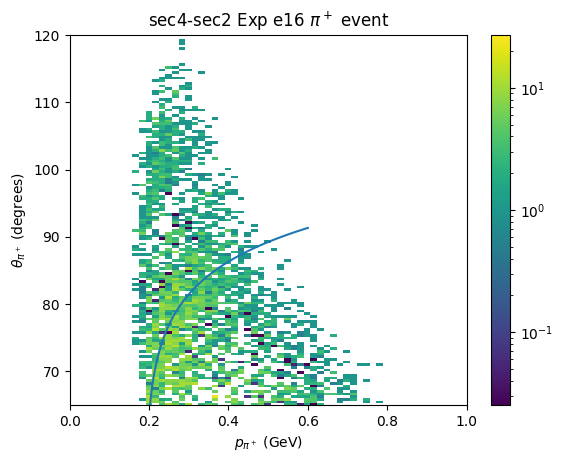

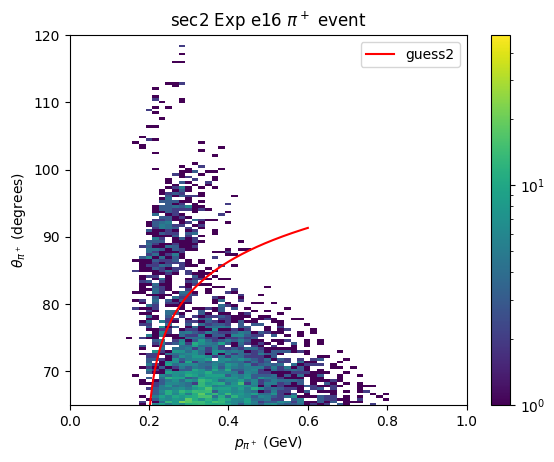

In [532]:

ini_par2 = [7.5,0.19,98]
cont_x = np.linspace(0.0,0.6,200)
plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())

plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess')

plt.title("{}-{} Exp {} {} {}".format(sec_names[sec1],sec_names[sec2],run,Particle,pid_cut[sel]))
plt.xlabel(xname)
plt.ylabel(yname)
plt.colorbar()
plt.ylim(ybounds)
plt.xlim(xbounds)
plt.show()

plt.hist2d(xdumb_x[sec2], xdumb_y[sec2], bins=(len(x), len(y)), weights=xdense2[sec2],norm = mpl.colors.LogNorm())

plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess2',color='r')

plt.title("{} Exp {} {} {}".format(sec_names[sec2],run,Particle,pid_cut[sel]))
plt.xlabel(xname)
plt.ylabel(yname)
plt.colorbar()
plt.ylim(ybounds)
plt.xlim(xbounds)
plt.legend()
plt.show()


/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


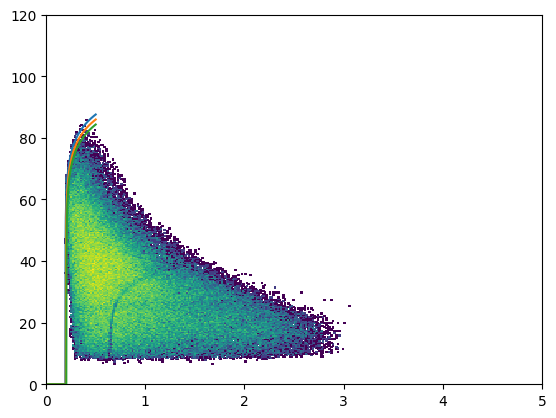

In [535]:
#Sec2 cut 2
sec = 1
cut2_sec2_lim_pars = ini_par2
cut2_sec2_pars = np.zeros((3,3))

width = [1.5,3,4.5]
width2 = [0.005,0.01,0.015]

cut2_sec2_z_xy = np.zeros((len(x),len(y)))
cut2_sec2_z_yx = np.zeros((len(y),len(x)))

for xbin in range(len(x)):
    for ybin in range(len(y)):
        if y[ybin] < fit_func2(x[xbin],*cut2_sec2_lim_pars):
            cut2_sec2_z_xy[xbin][ybin] = exp_z_xy[sec][xbin][ybin]
            cut2_sec2_z_yx[ybin][xbin] = exp_z_yx[sec][ybin][xbin]
            
plt.pcolor(x,y,cut2_sec2_z_yx,norm = mpl.colors.LogNorm())
cont_x = np.linspace(0.0,0.5,200)
for cut in range(3):
    for i in range(3):
        if i==2:
            cut2_sec2_pars[cut][i] = cut2_sec2_lim_pars[i]-width[cut]
        elif i==1:
            cut2_sec2_pars[cut][i] = cut2_sec2_lim_pars[i]+width2[cut]
        else:
            cut2_sec2_pars[cut][i] = cut2_sec2_lim_pars[i]
    plt.plot(cont_x,fit_2n(cont_x,*cut2_sec2_pars[cut]))


plt.show()




In [539]:
cut_ver = 1

#exp_wcuts_z_xy = np.zeros((6,len(x),len(y)))
#exp_wcuts_z_yx = np.zeros((6,len(y),len(x)))

sec=1

for xbin in range(len(x)):
    for ybin in range(len(y)):
        exp_wcuts_z_xy[sec][xbin][ybin] = 0.0
        exp_wcuts_z_yx[sec][ybin][xbin] = 0.0
        if y[ybin] < fit_func2(x[xbin],*cut2_sec2_pars[cut_ver]):
            if y[ybin] > fit_func2(x[xbin],*cut1_sec2_pars[1][cut_ver]) or y[ybin] < fit_func2(x[xbin],*cut1_sec2_pars[0][cut_ver]):
                exp_wcuts_z_xy[sec][xbin][ybin] = exp_z_xy[sec][xbin][ybin]
                exp_wcuts_z_yx[sec][ybin][xbin] = exp_z_yx[sec][ybin][xbin]
            
            
            




/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


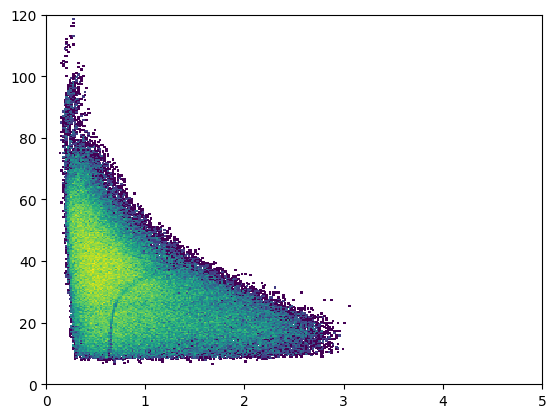

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


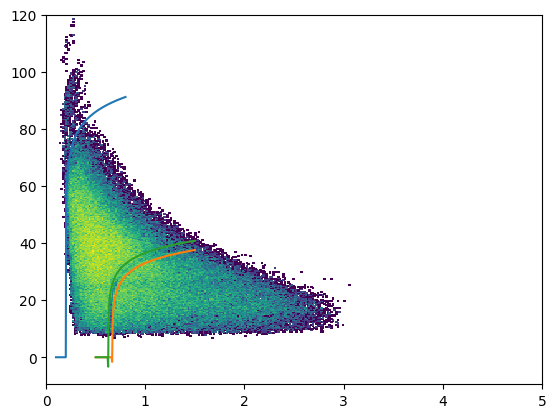

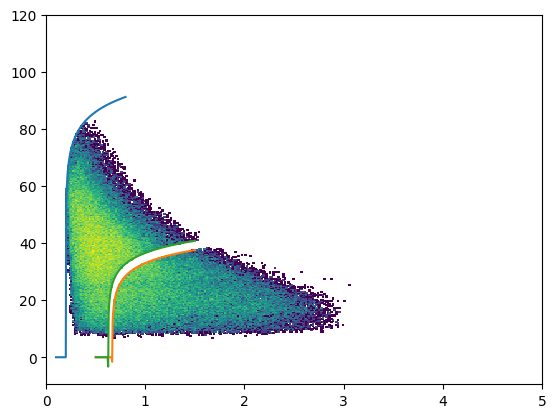

In [540]:
cont_x1 = np.linspace(0.1,0.8,200)
cont_x2 = np.linspace(0.5,1.5,200)
plt.pcolor(x,y,exp_z_yx[sec],norm = mpl.colors.LogNorm())
plt.show()

plt.pcolor(x,y,exp_z_yx[sec],norm = mpl.colors.LogNorm())
plt.plot(cont_x1,fit_2n(cont_x1,*cut2_sec2_pars[cut_ver]))
plt.plot(cont_x2,fit_2n(cont_x2,*cut1_sec2_pars[0][cut_ver]))
plt.plot(cont_x2,fit_2n(cont_x2,*cut1_sec2_pars[1][cut_ver]))
plt.show()
plt.pcolor(x,y,exp_wcuts_z_yx[sec],norm = mpl.colors.LogNorm())
plt.plot(cont_x1,fit_2n(cont_x1,*cut2_sec2_pars[cut_ver]))
plt.plot(cont_x2,fit_2n(cont_x2,*cut1_sec2_pars[0][cut_ver]))
plt.plot(cont_x2,fit_2n(cont_x2,*cut1_sec2_pars[1][cut_ver]))
plt.show()

In [ ]:
ini_par1

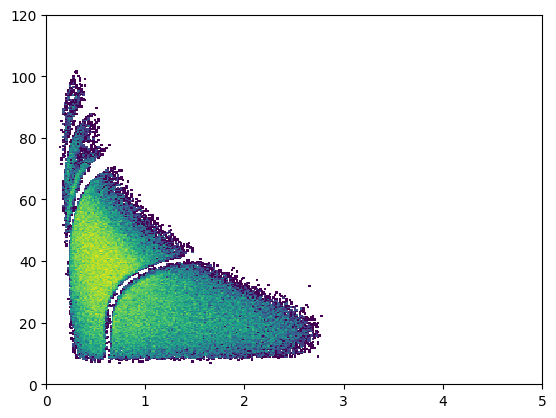

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)
/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: divide by zero encountered in log
  out = c_ + a_*np.log(x_-b_)


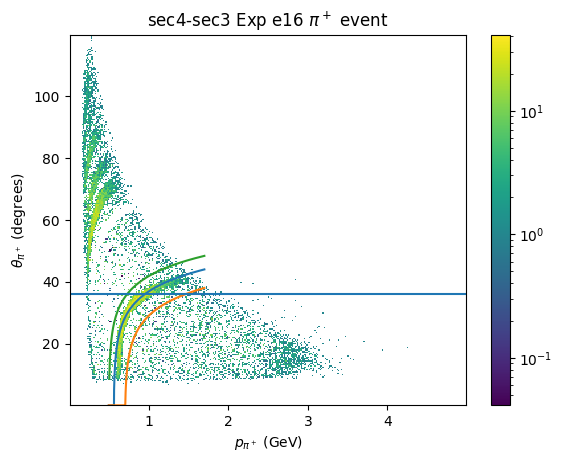

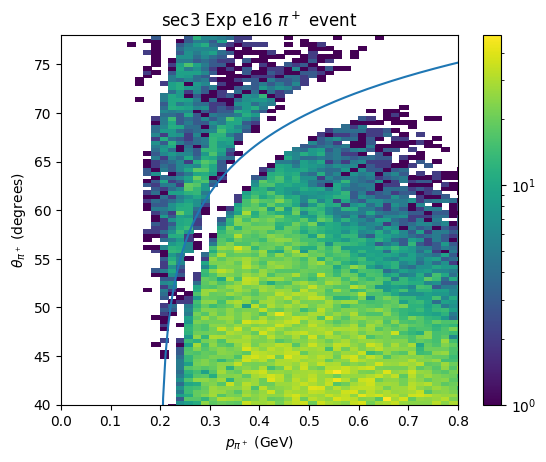

In [541]:
# Sector 3 Experiment Focused

xbounds = [0.0,1.0]
ybounds = [65.0,120.0]


#Just an upper edge bound
#norm_exp_zvals_xy[sec1][sec2][i][j]
#exp_z_xy[sec1][i][j]
#best isolation option is 4 - 1
#looks like it's close to theta = 90
sec1 = 3
sec2 = 2
cont_x = np.linspace(xbounds[0],xbounds[1],200)


plt.pcolor(x,y,exp_z_yx[sec2],norm = mpl.colors.LogNorm())
plt.show()

ini_par1 = [7.5, 0.56, 43]
ini_par10 = [7.5,0.7,38]
ini_par11 = [7.5,0.5,47]

cont_x = np.linspace(0.5,1.7,200)
plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*ini_par1),label='guess')
plt.plot(cont_x,fit_2n(cont_x,*ini_par10),label='guess bot')
plt.plot(cont_x,fit_2n(cont_x,*ini_par11),label='guess top')
#plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess')
#plt.plot(cont_x,fit_2n(cont_x,*ini_par3),label='guess')
plt.axhline(y=36)
plt.title("{}-{} Exp {} {} {}".format(sec_names[sec1],sec_names[sec2],run,Particle,pid_cut[sel]))
plt.xlabel(xname)
plt.ylabel(yname)
plt.colorbar()
#plt.ylim(ybounds)
#plt.xlim(xbounds)
plt.show()

cont_x = np.linspace(0.0,1.0,200)

ini_par2 = [7.5,0.2,79]
#ini_par20 = [7.5,0.7,38]
#ini_par21 = [7.5,0.5,47]
#plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())
plt.pcolor(x,y,exp_z_yx[sec2],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess')
#plt.plot(cont_x,fit_2n(cont_x,*ini_par20),label='guess bot')
#plt.plot(cont_x,fit_2n(cont_x,*ini_par21),label='guess top')
plt.title("{} Exp {} {} {}".format(sec_names[sec2],run,Particle,pid_cut[sel]))
plt.xlabel(xname)
plt.ylabel(yname)
plt.colorbar()
plt.ylim([40,78])
plt.xlim([0.0,.8])
plt.show()


[10.89119439  0.62019465  0.01554345]


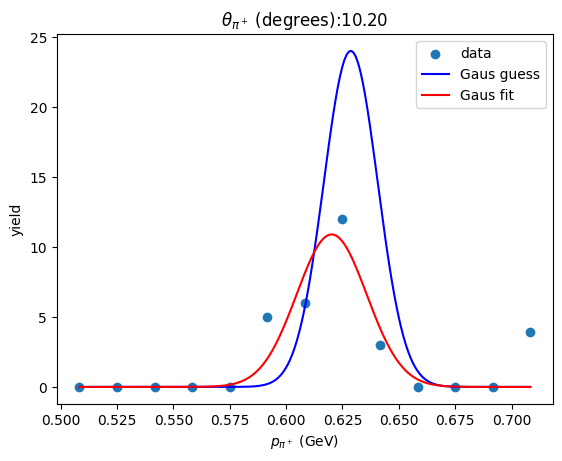

[9.08803002 0.61473721 0.0140521 ]


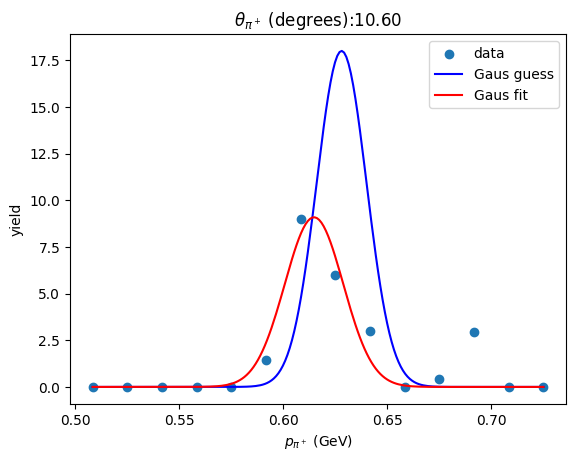

[6.72728899 0.64452085 0.0425861 ]


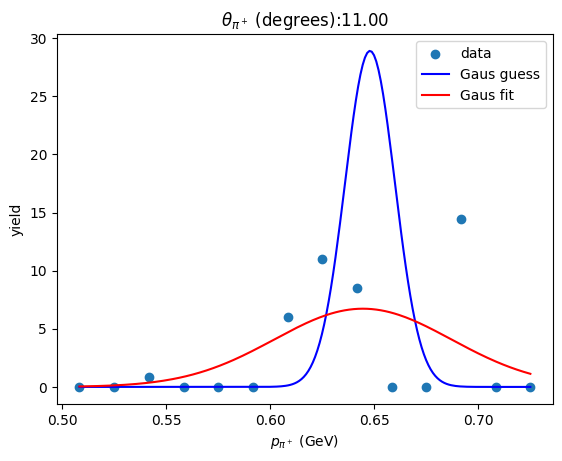

[6.46200013 0.62504037 0.02490219]


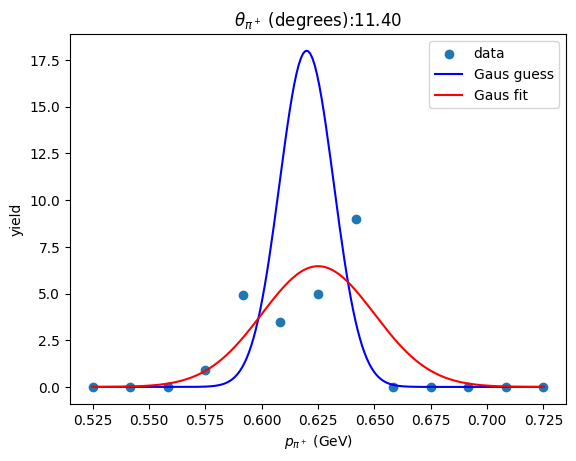

[14.41945861  0.6235746   0.01678345]


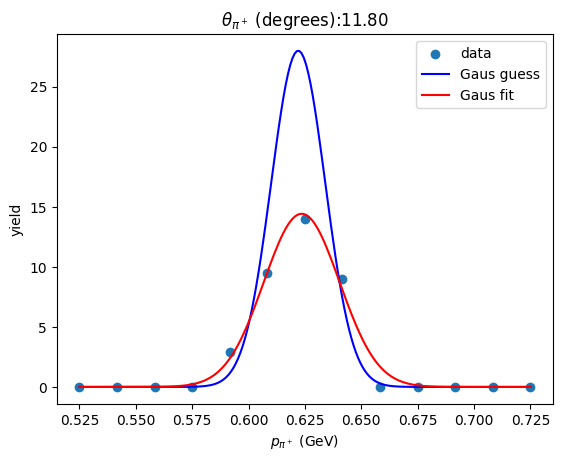

[7.06400161 0.63018236 0.01952395]


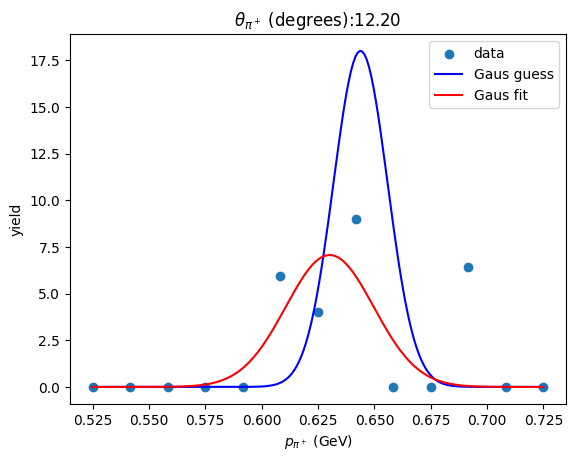

[16.92435039  0.63455071  0.02032129]


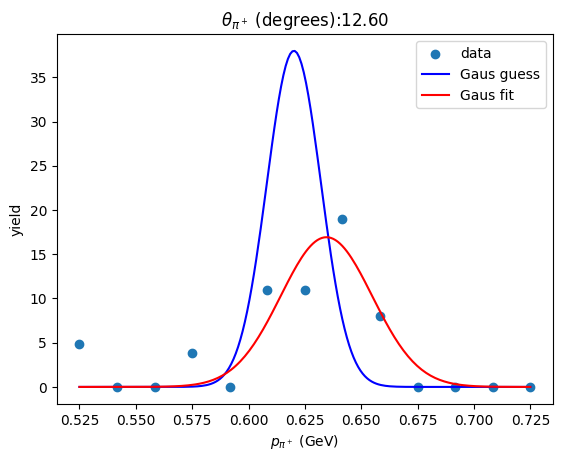

[16.97569923  0.63020763  0.02062829]


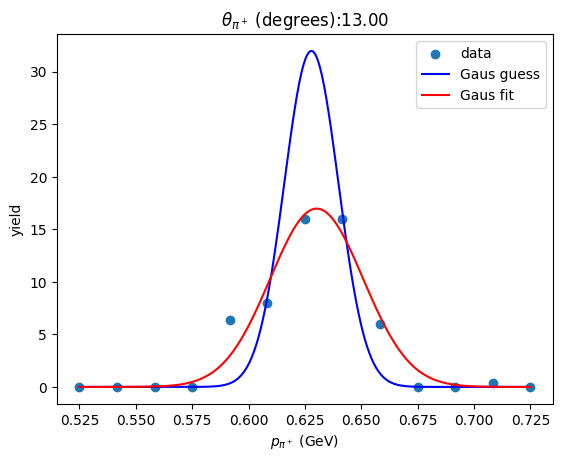

[15.16983717  0.62817031  0.02255377]


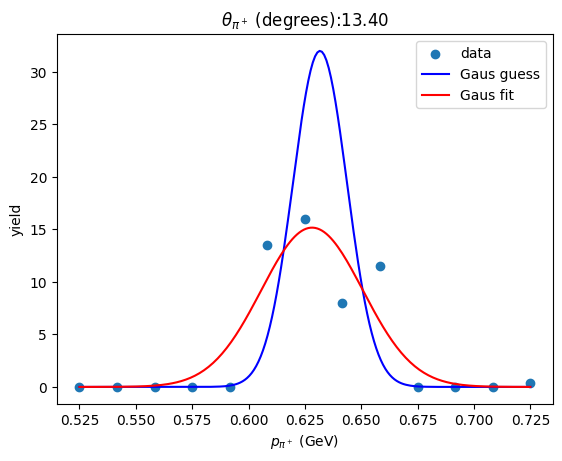

[1.93348421e+01 6.22716164e-01 1.41275092e-02]


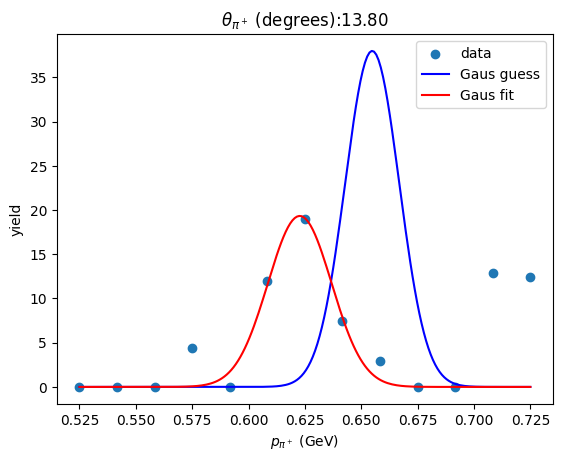

[1.97437081e+01 6.27389485e-01 1.81233103e-02]


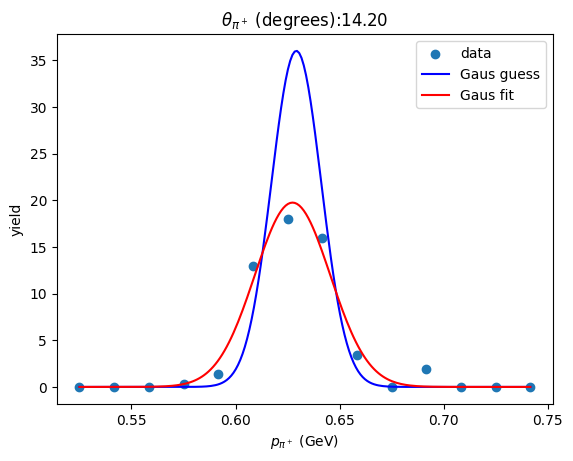

[2.09572990e+01 6.27172951e-01 1.71538857e-02]


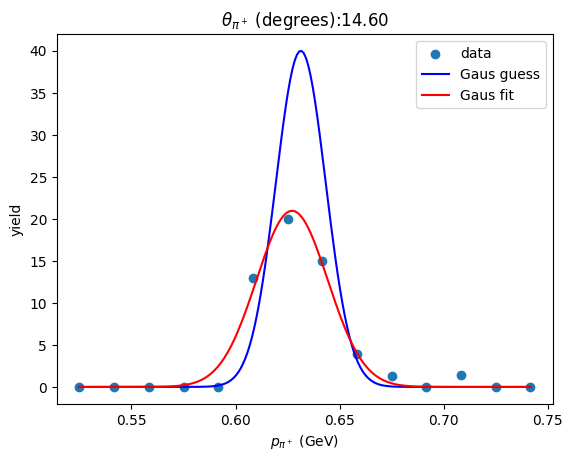

[20.28380324  0.63038156  0.02038634]


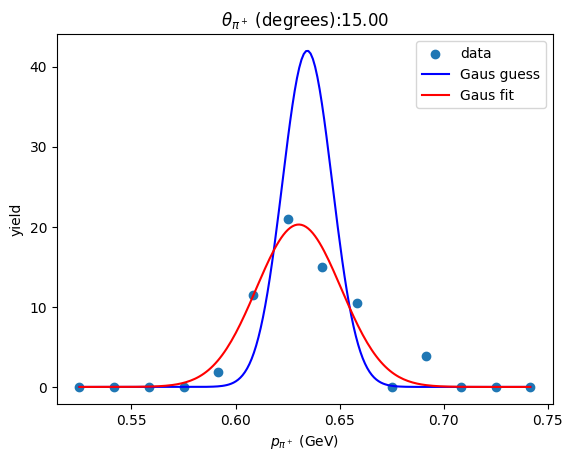

[17.28704128  0.61993423  0.02765657]


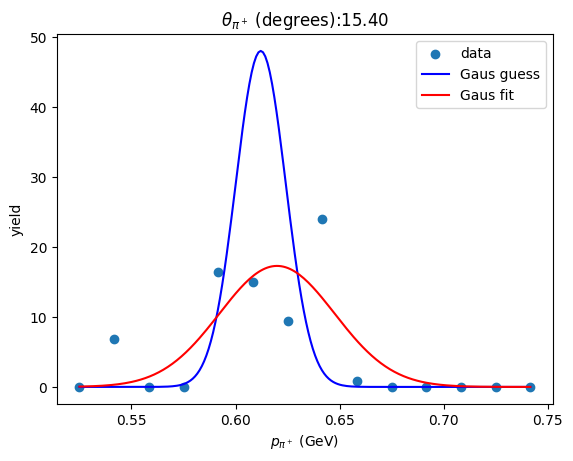

[18.08889684  0.62911903  0.02378167]


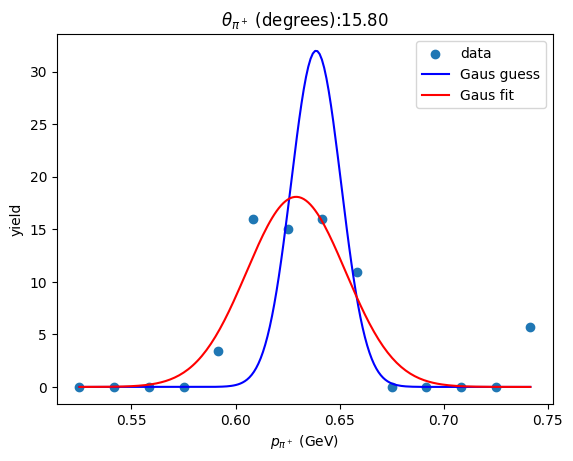

[20.40145937  0.62905347  0.0231808 ]


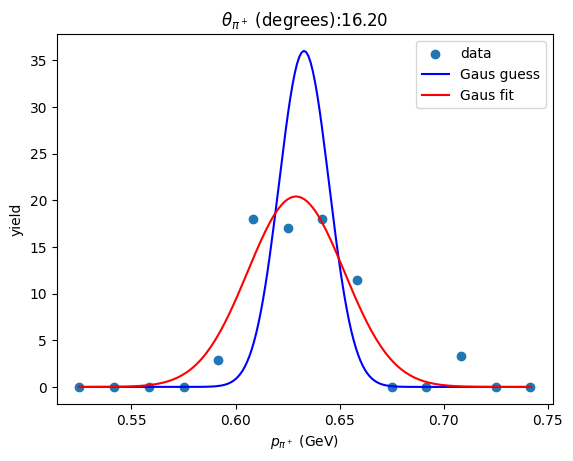

[16.60174568  0.6304882   0.02463548]


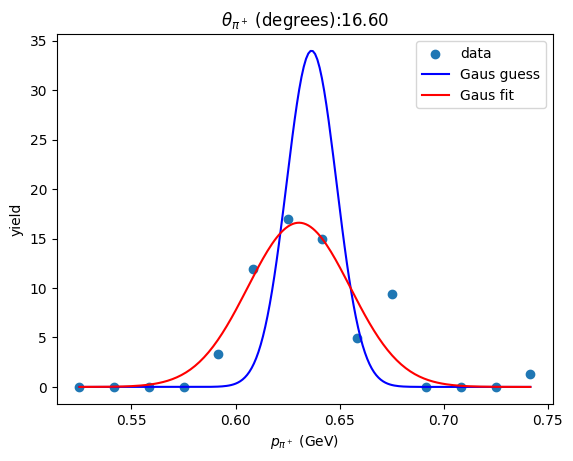

[2.04554185e+01 6.26565200e-01 1.97414785e-02]


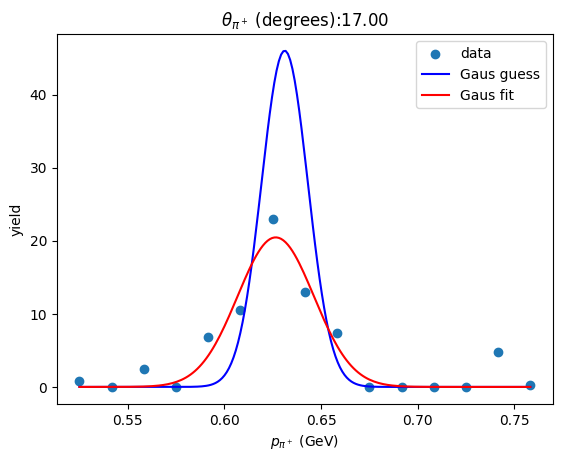

[2.30997940e+01 6.32472112e-01 1.76356568e-02]


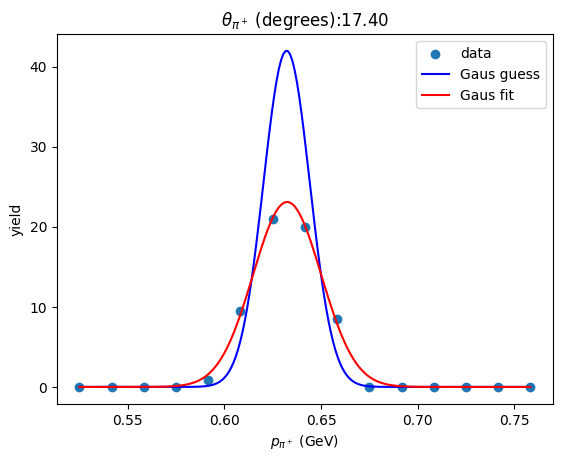

[16.03472436  0.62949988  0.03100014]


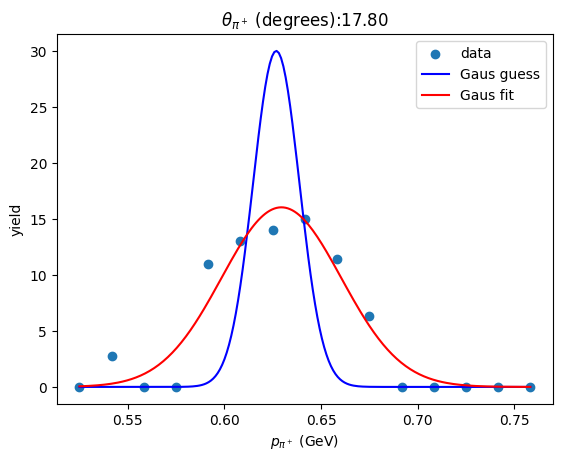

[23.92690184  0.62555149  0.02620508]


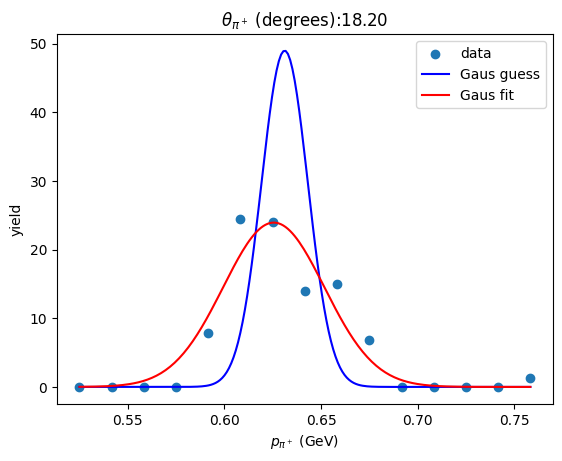

[16.1677434   0.62379699  0.02662404]


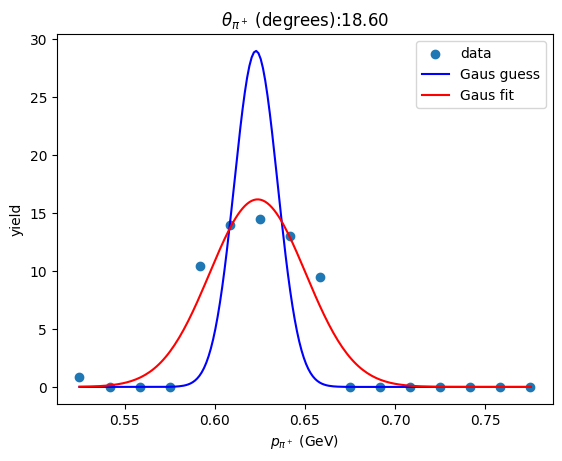

[18.01858909  0.62659333  0.02698697]


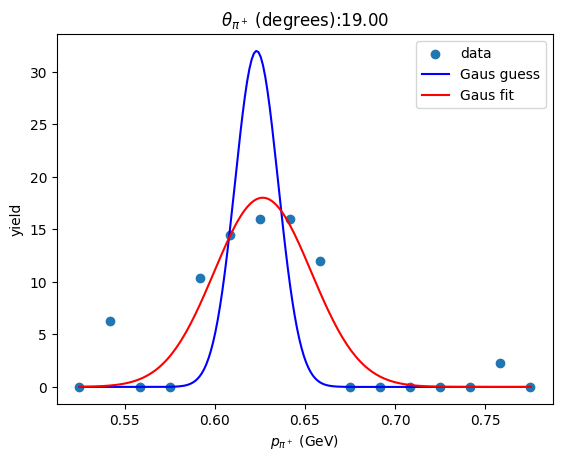

[15.52587519  0.6304183   0.02635374]


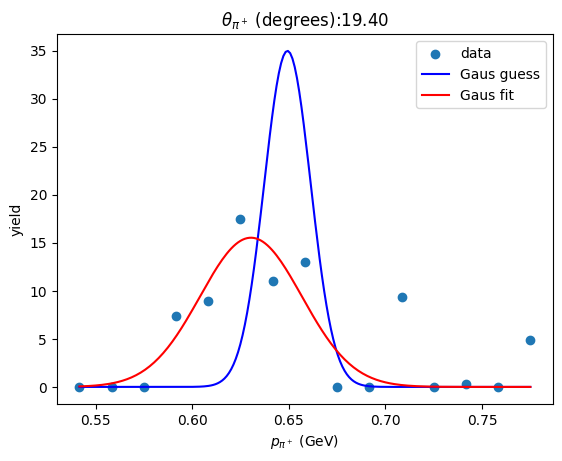

[22.84656496  0.62984829  0.02325615]


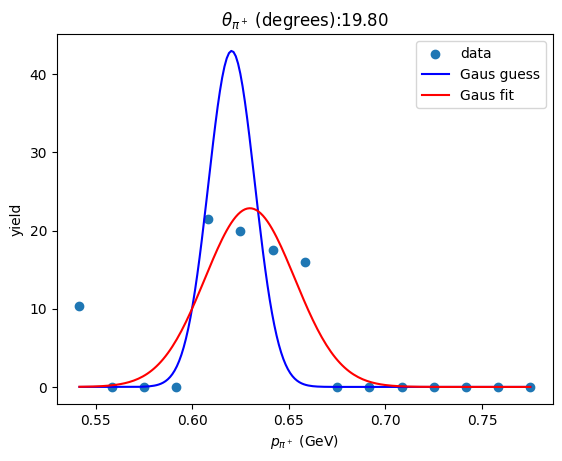

[18.98737876  0.63187481  0.02587809]


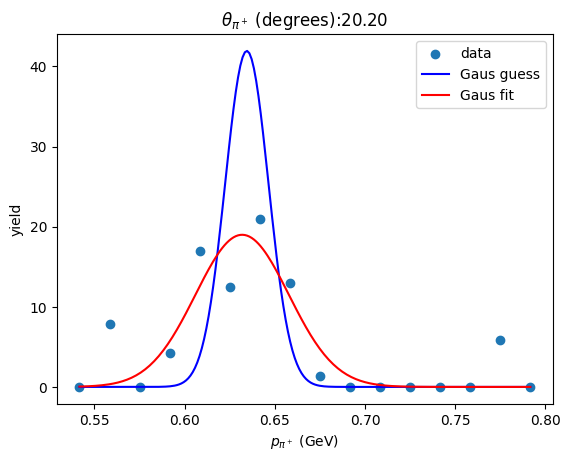

[2.69065322e+01 6.42017844e-01 2.17757269e-02]


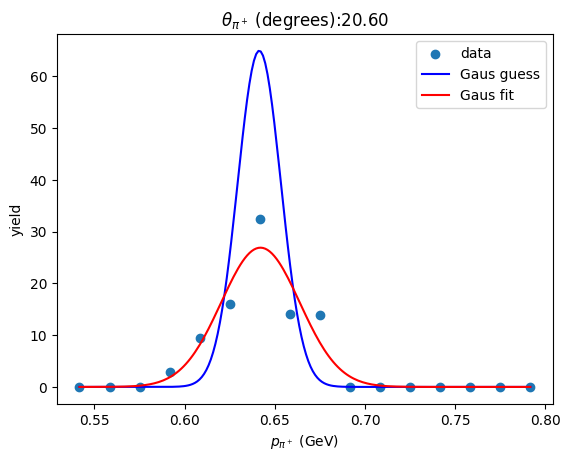

[21.48426537  0.6391321   0.02307691]


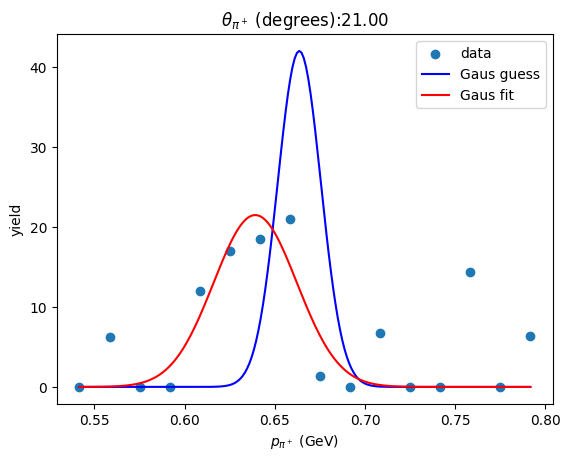

[19.43178951  0.63079143  0.02708014]


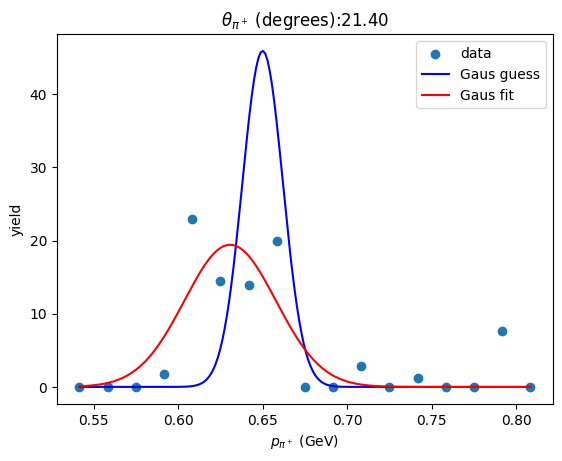

[2.98158722e+01 6.37296326e-01 2.29056814e-02]


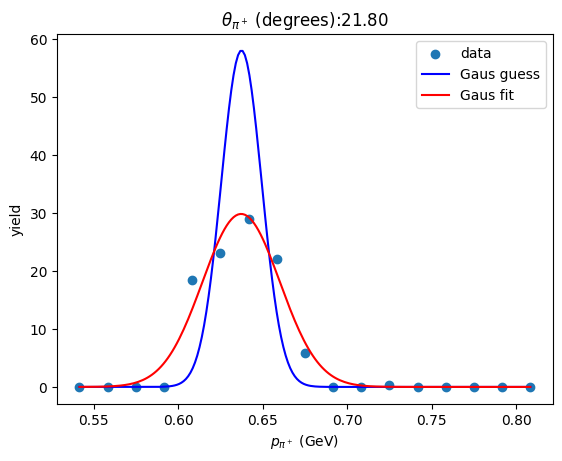

[20.23043059  0.64146232  0.02659734]


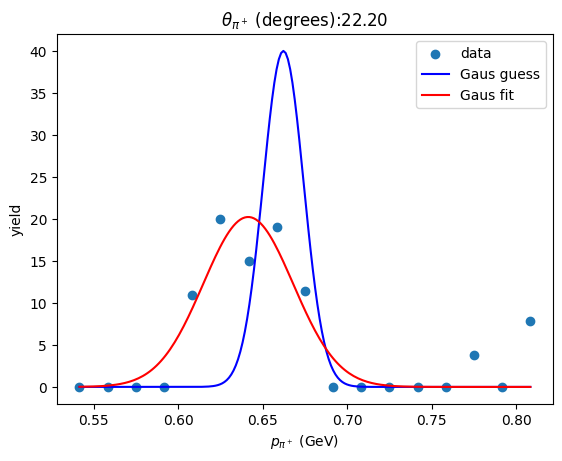

[24.066851    0.64438917  0.0250726 ]


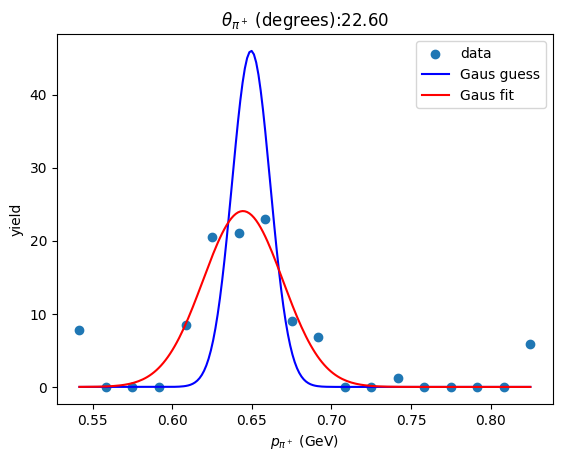

[23.58090105  0.64450858  0.03044813]


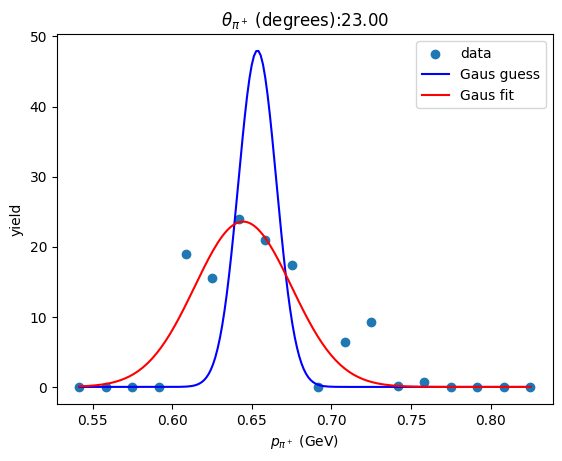

[21.04928063  0.64319091  0.03194397]


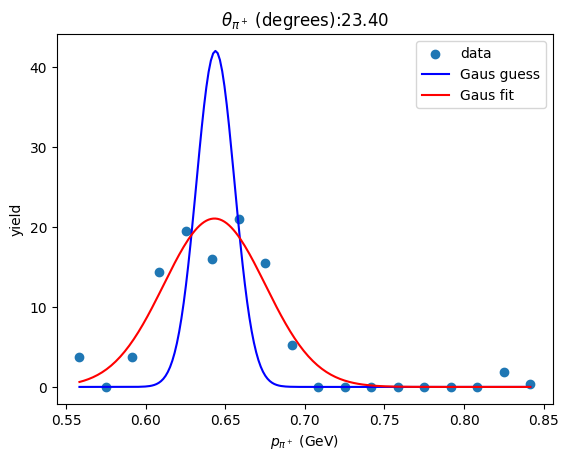

[2.82619452e+01 6.42794157e-01 2.25078157e-02]


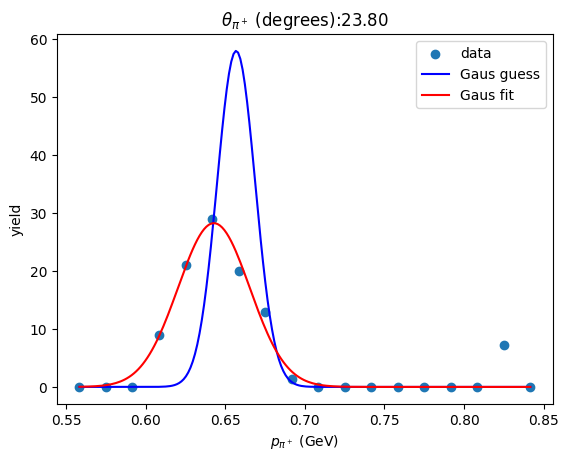

[3.09303583e+01 6.52269262e-01 2.24091160e-02]


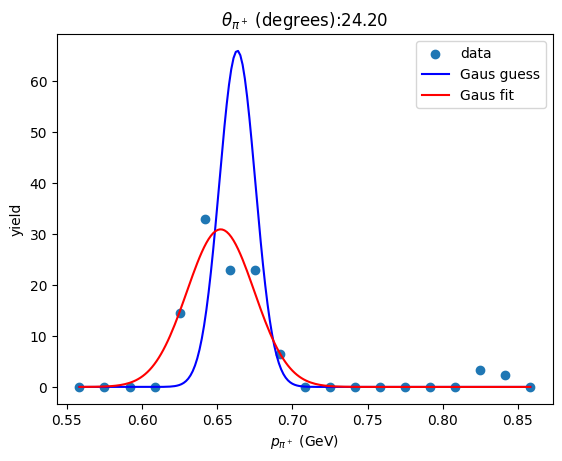

[25.58172438  0.6598028   0.02804877]


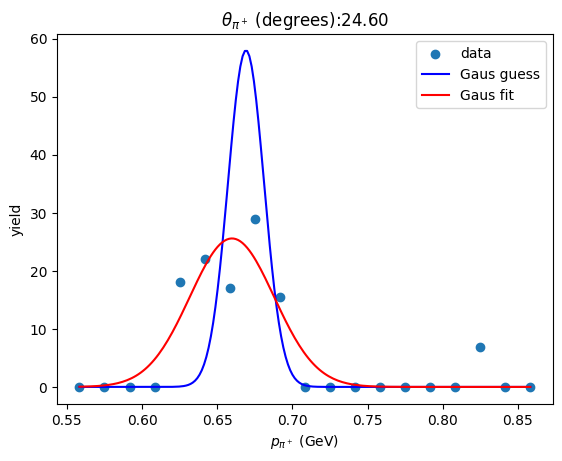

[23.59497354  0.65306442  0.02802462]


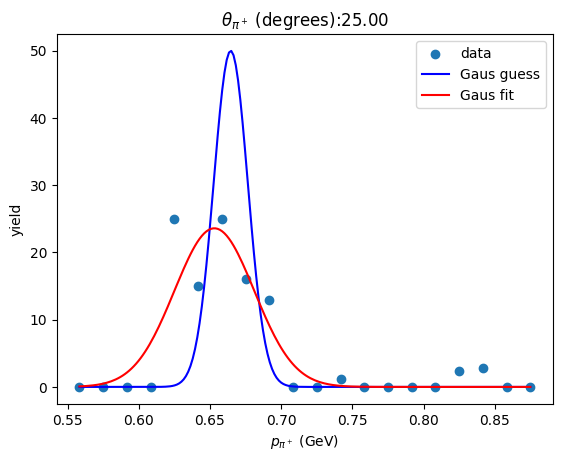

[21.62754717  0.65986385  0.03244527]


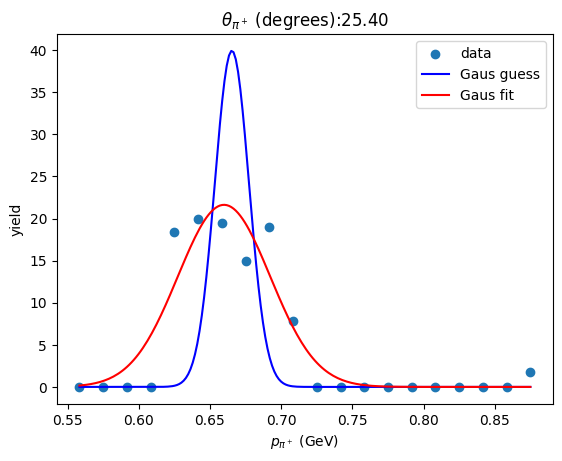

[25.14052699  0.6640964   0.03304007]


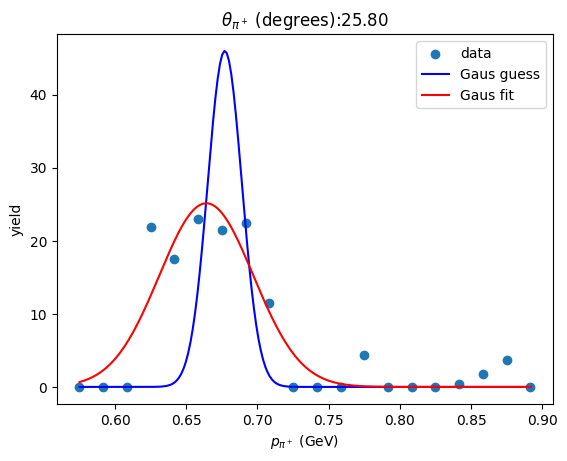

[3.01031928e+01 6.79666174e-01 2.88482741e-02]


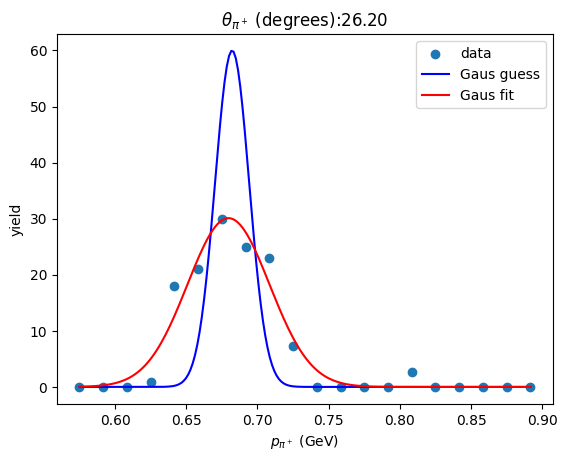

[22.5717643   0.67476769  0.03385655]


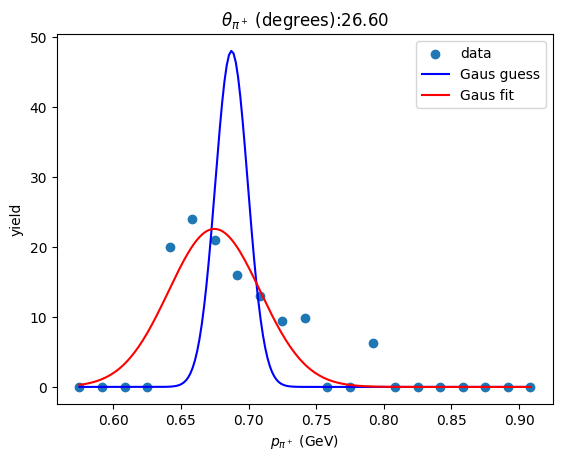

[27.52314206  0.68181803  0.03189654]


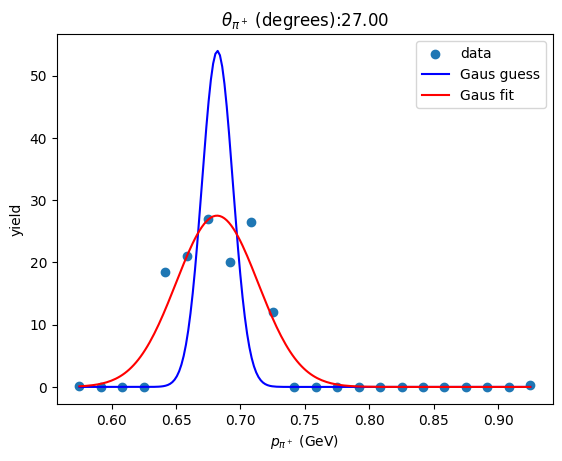

[30.6553572   0.68260326  0.03072521]


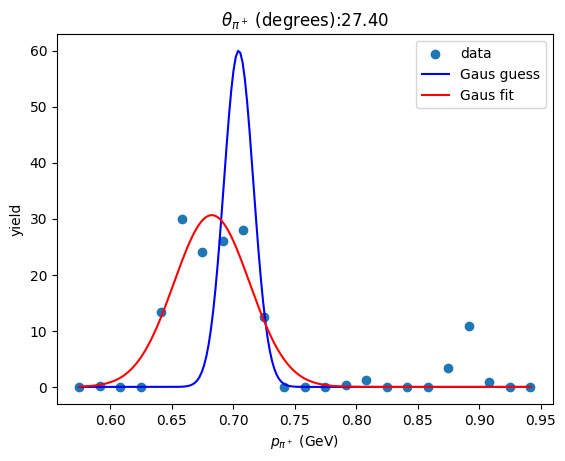

[32.16103502  0.69214306  0.03357088]


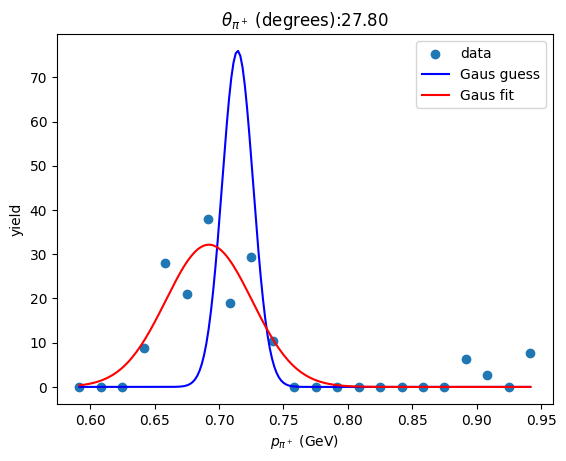

[27.3103013   0.69687343  0.0344321 ]


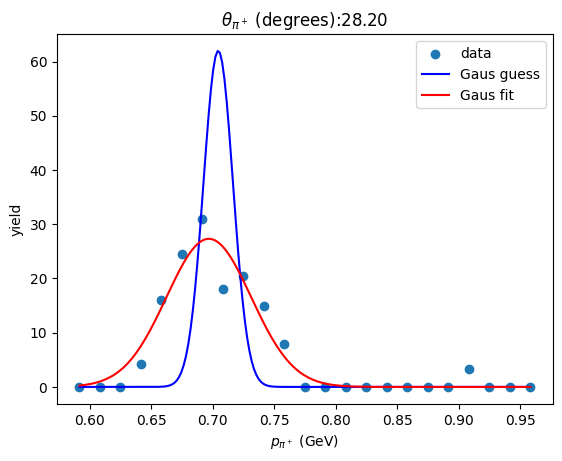

[30.02094959  0.70506807  0.03480905]


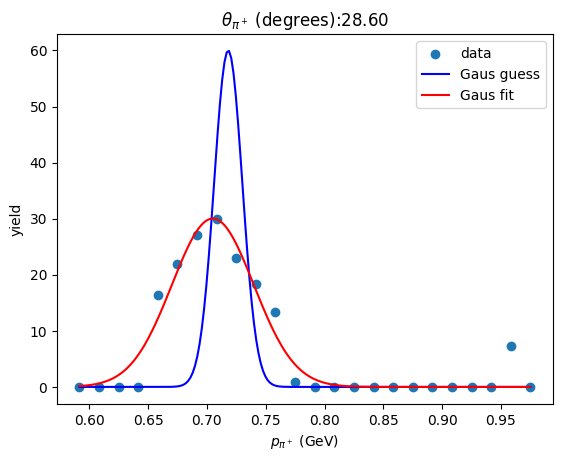

[26.06576223  0.71322387  0.03601763]


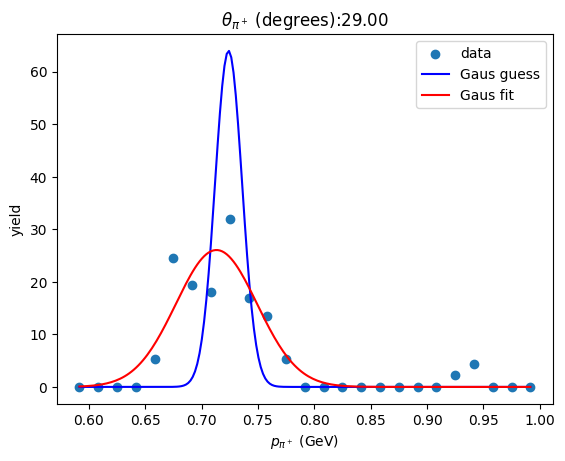

[22.88497239  0.71997665  0.03920863]


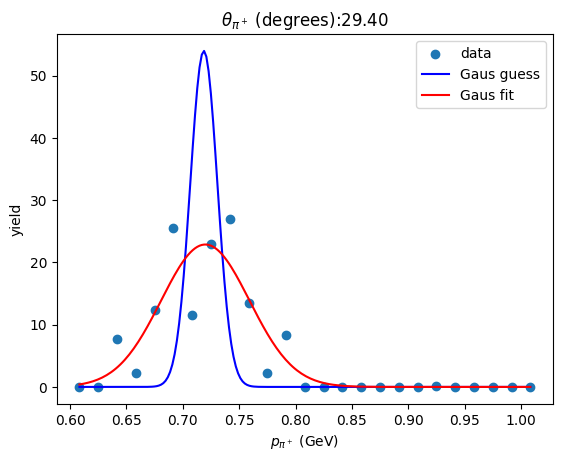

[2.90663981e+01 7.27730576e-01 2.85148341e-02]


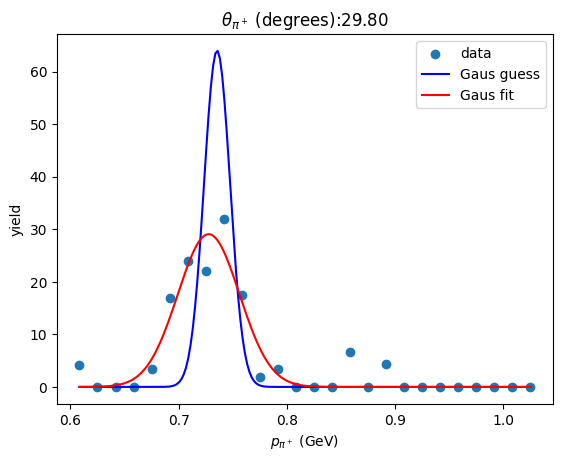

[26.2587946   0.72820052  0.03808396]


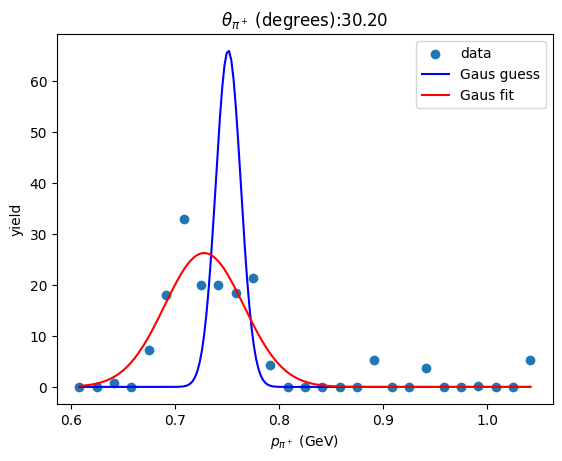

[30.89585096  0.73838396  0.03683   ]


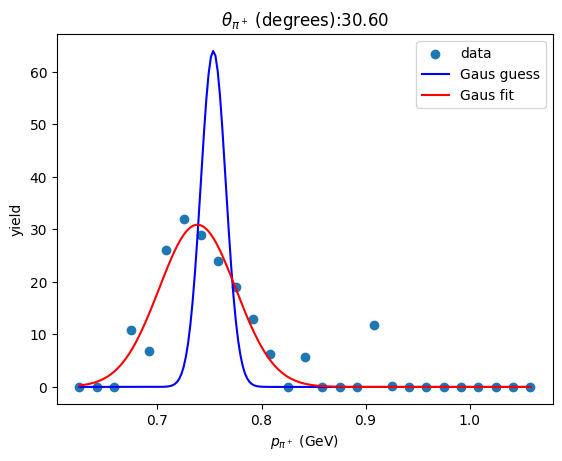

[25.7195209   0.75129763  0.04724771]


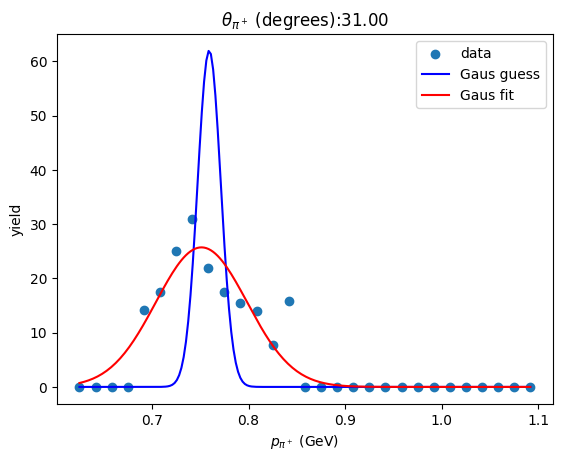

[27.49147484  0.76177346  0.03830938]


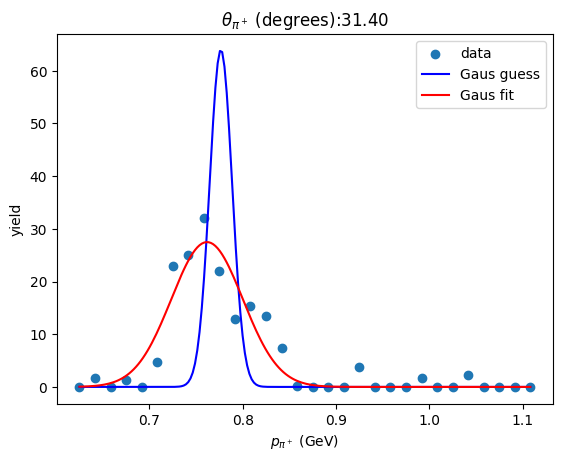

[31.44303998  0.77604501  0.0399813 ]


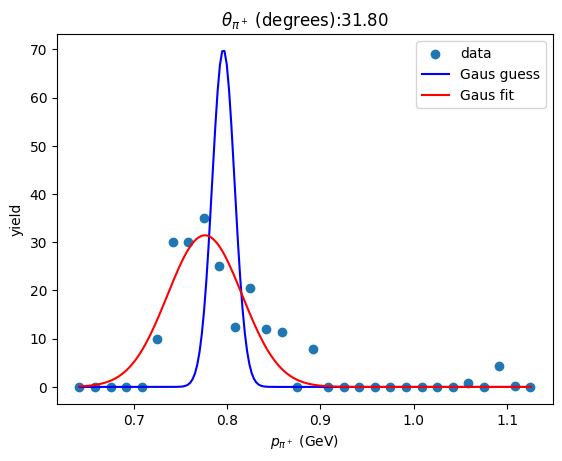

[30.58403813  0.79413898  0.04954956]


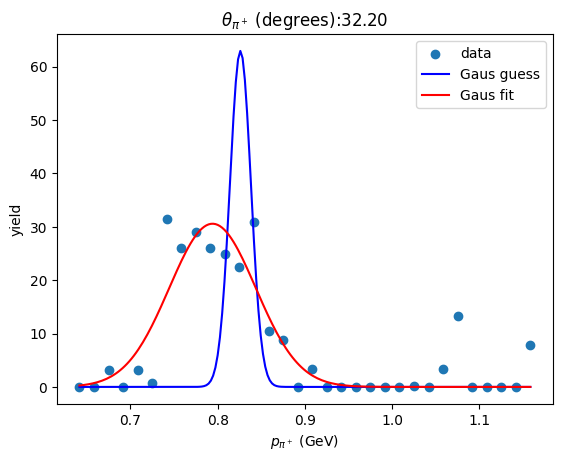

[27.73511606  0.80129662  0.05074259]


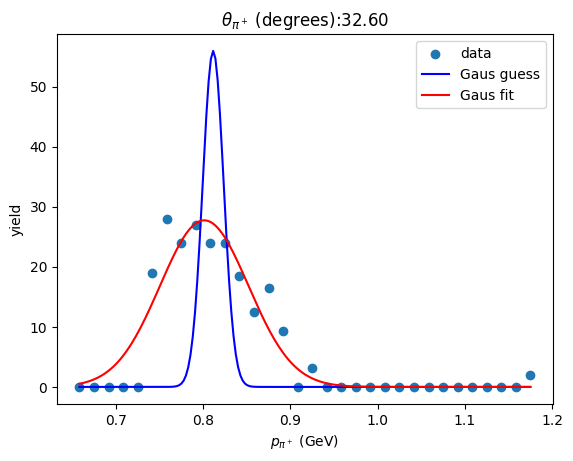

[26.27747392  0.82066807  0.05404002]


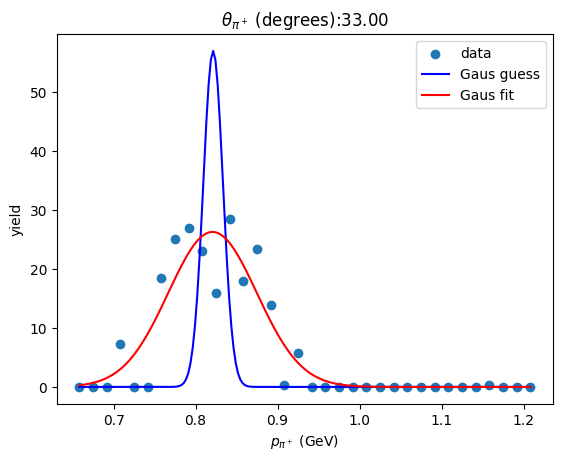

[28.00043654  0.83036722  0.05739817]


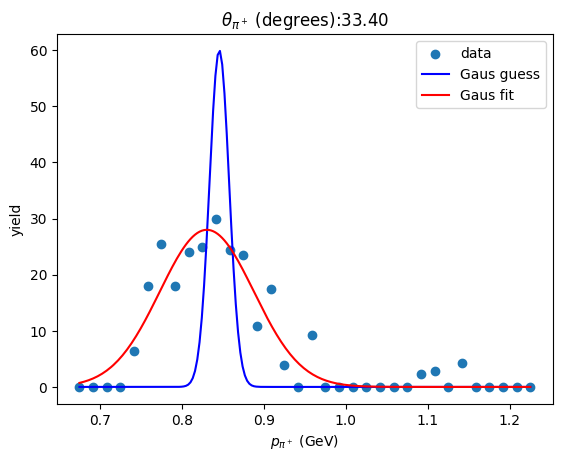

[31.00222473  0.85126315  0.05828949]


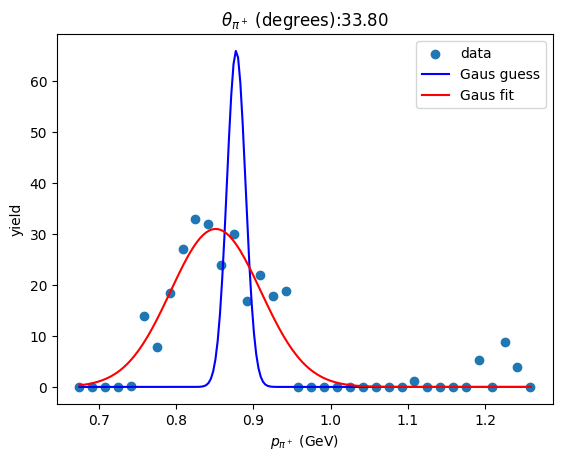

[29.59131673  0.87012736  0.0624807 ]


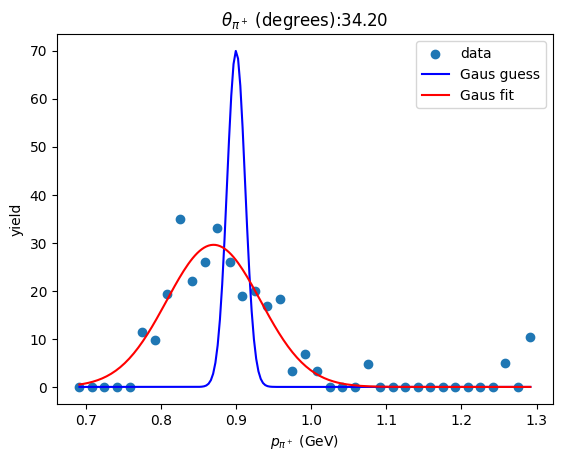

[29.21034336  0.87025882  0.05359031]


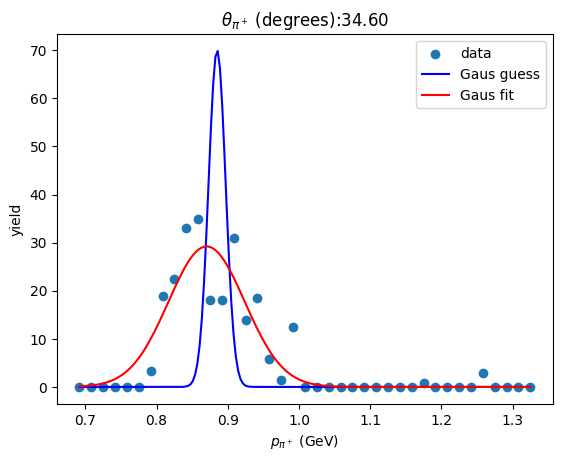

[30.13692061  0.90877326  0.0659971 ]


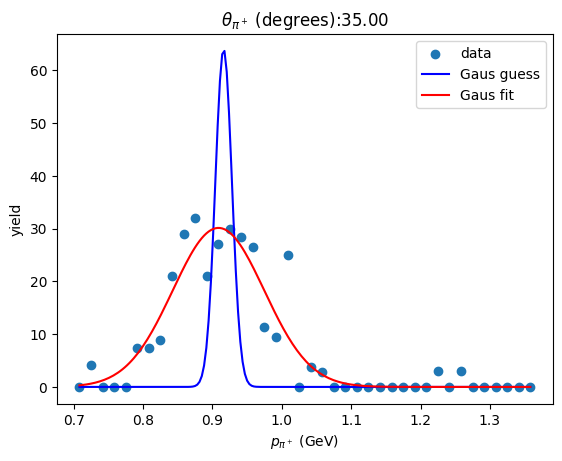

[24.46209402  0.9248008   0.07635976]


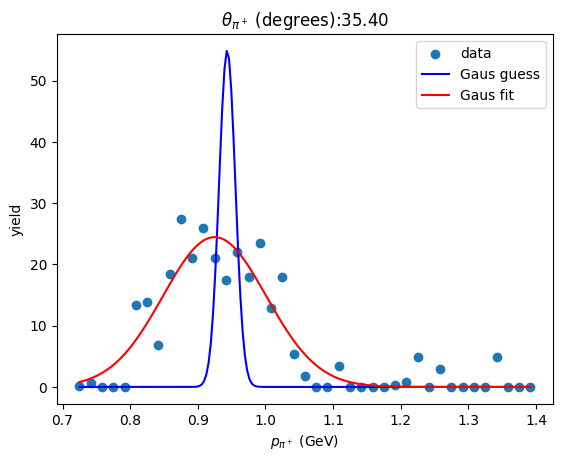

[28.45644762  0.93793     0.0548714 ]


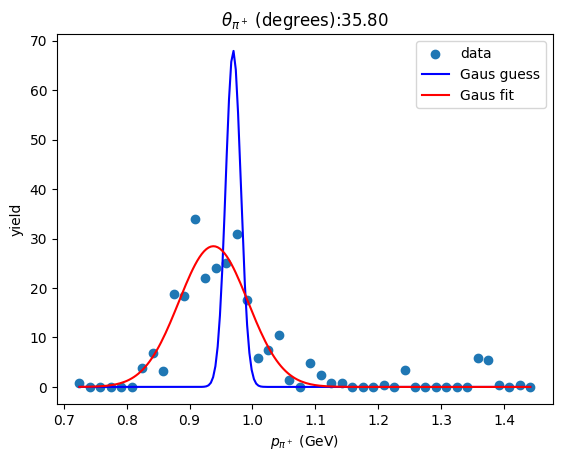

[26.25648657 33.11303083  1.44925649]


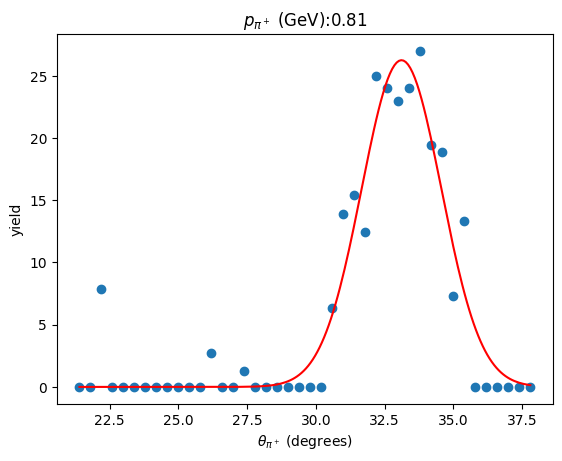

[29.0977901  33.43005533  1.4091744 ]


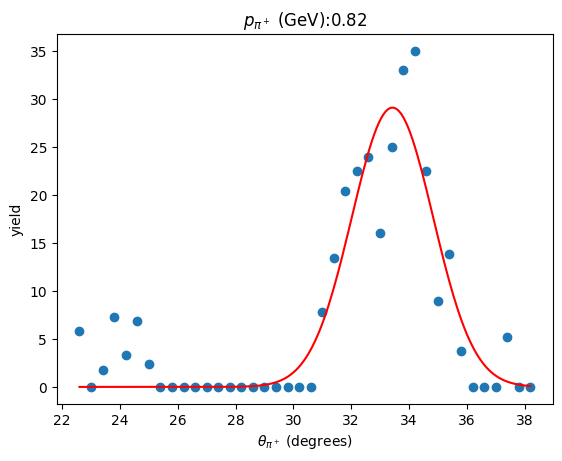

[31.21443107 33.45396526  1.42005351]


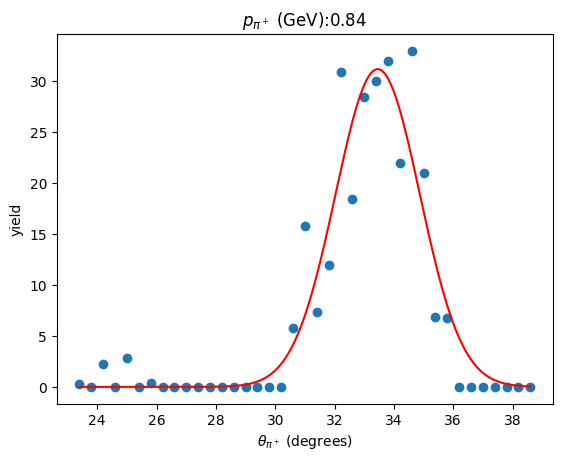

[30.21293613 34.14192825  1.16580675]


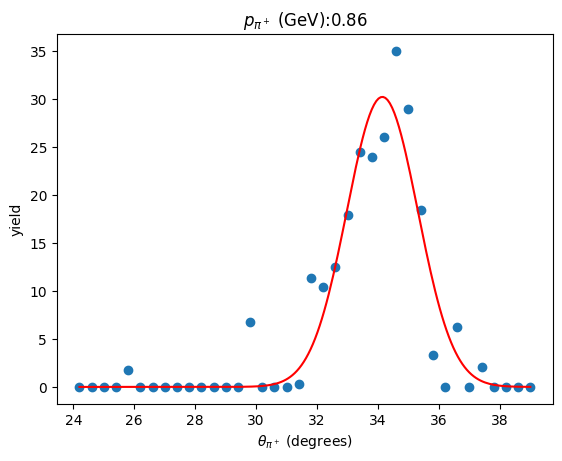

[30.91645389 34.38173506  1.39835761]


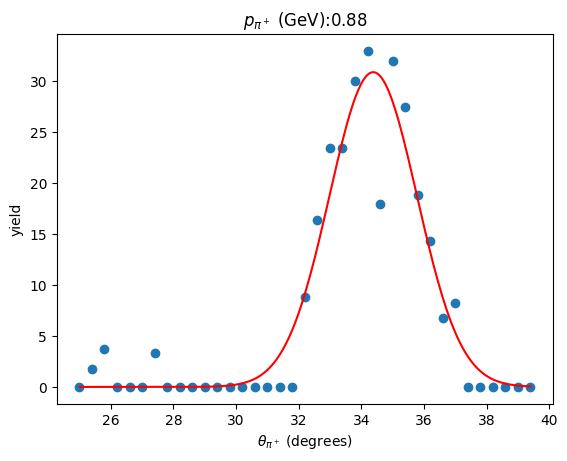

[22.7785431  34.56819047  1.25622079]


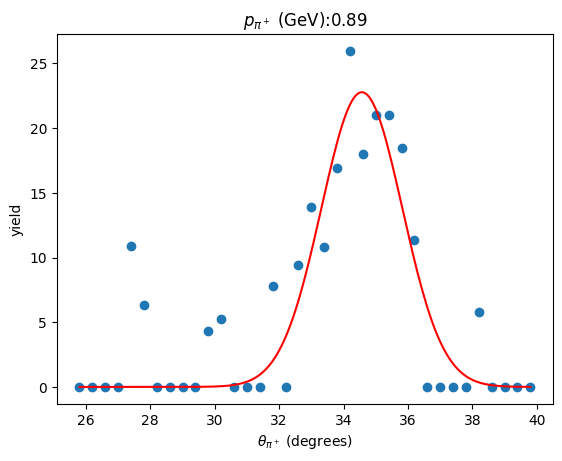

[30.62236165 35.13556215  1.24617826]


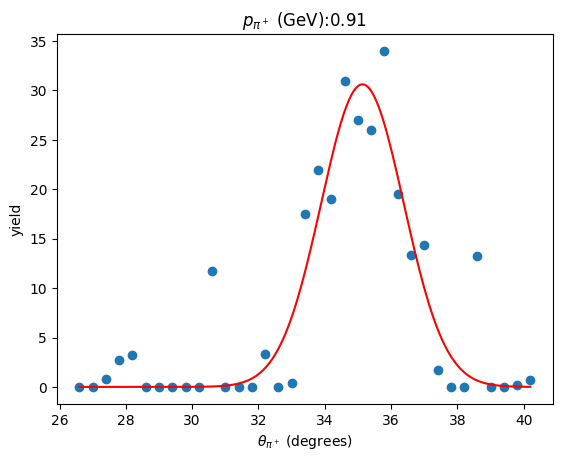

[26.590322   35.38345719  1.24985514]


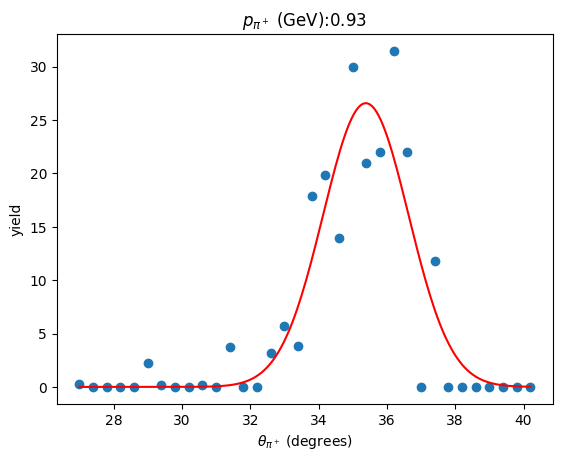

[24.86326023 35.53700813  1.32783641]


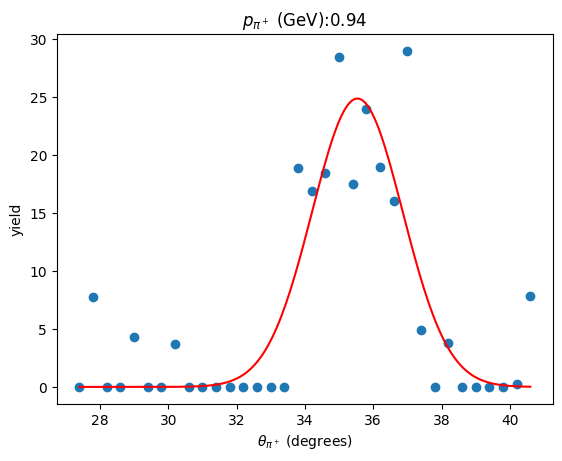

[23.61663568 35.79604609  1.30167246]


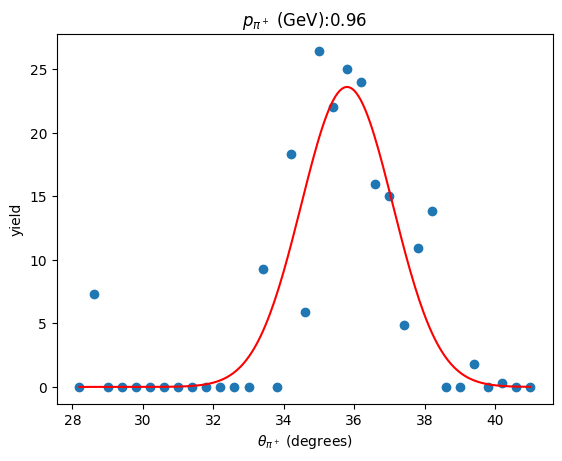

[27.53625422 36.24283729  0.93107075]


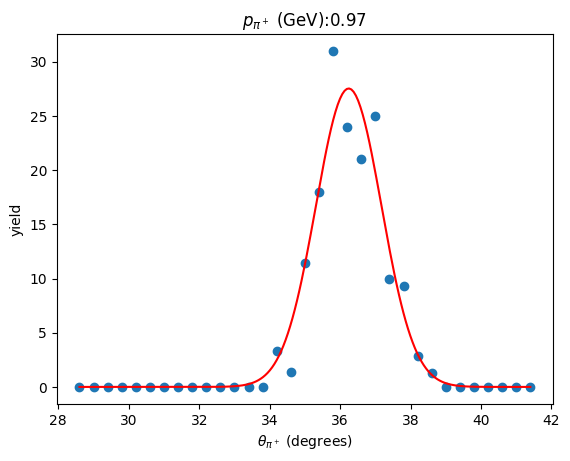

[23.93640948 36.2408165   1.18461137]


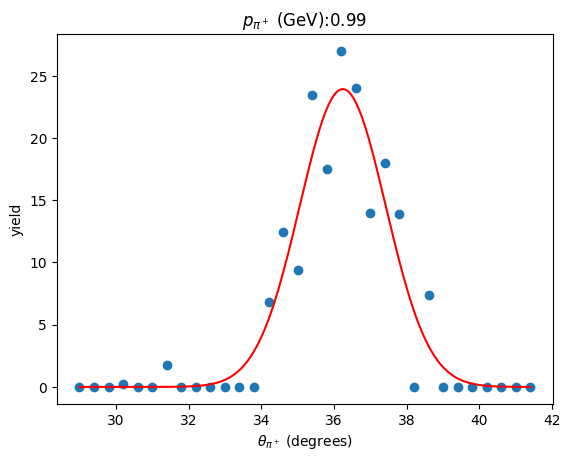

[18.15307029 36.56983496  1.32154841]


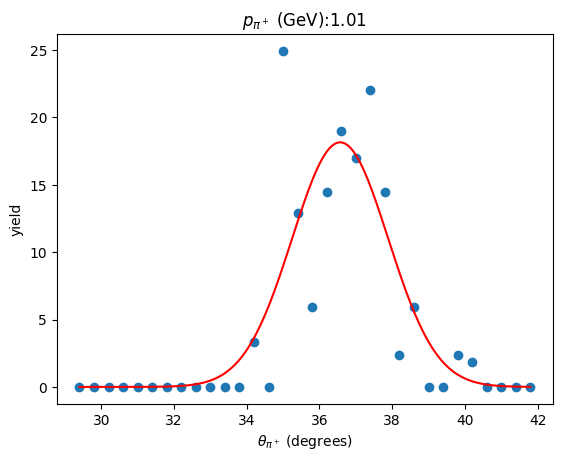

[20.96419243 36.90332382  1.01827664]


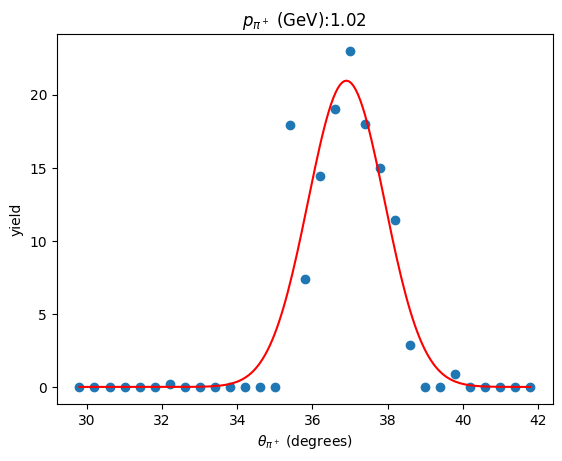

[13.45991245 37.27464414  1.34131449]


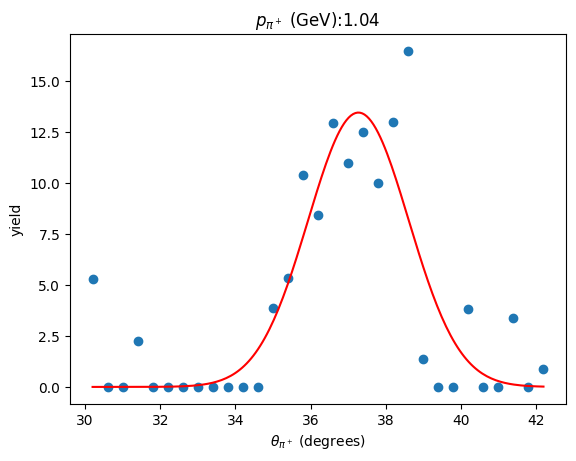

[14.44143577 37.62401417  1.14172488]


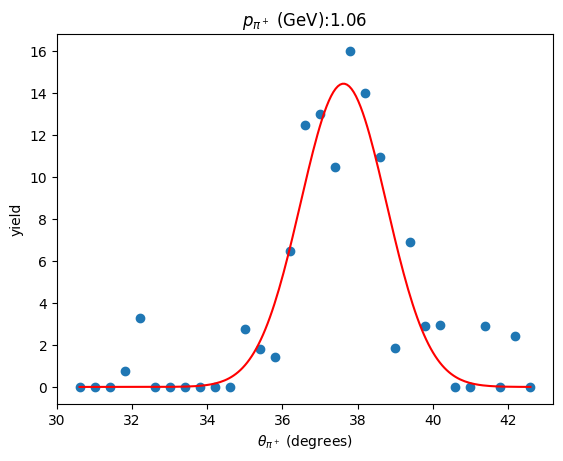

[13.80440009 37.66135233  1.05620018]


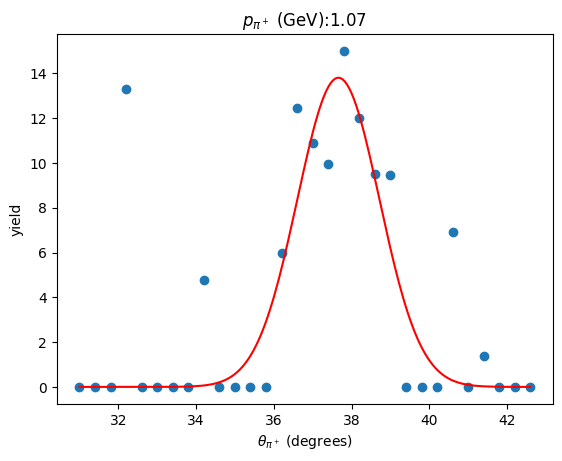

[12.88517672 37.5939891   1.41454907]


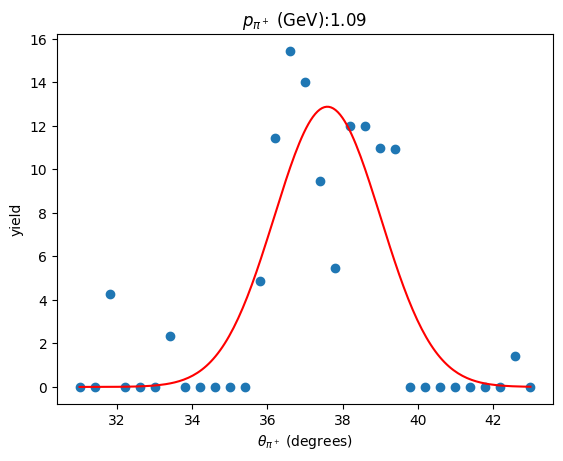

[13.73696152 37.67547034  1.11859453]


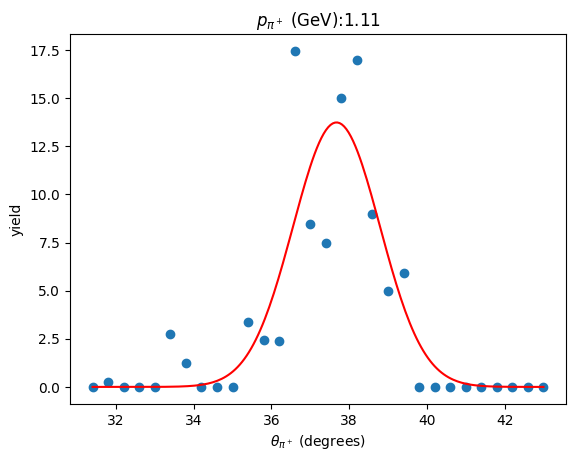

[ 9.85699992 38.10836705  1.07153649]


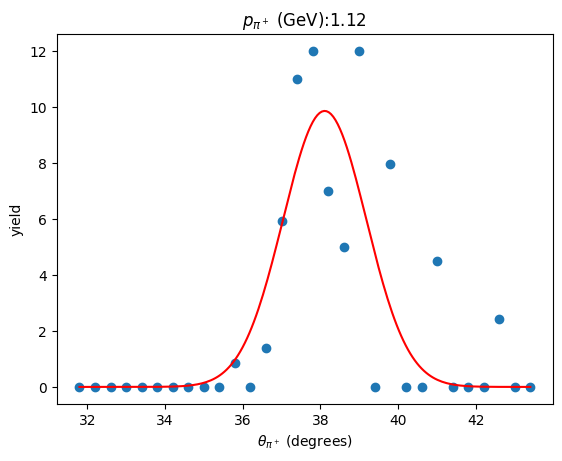

[ 9.8533147 38.5747359  1.1361846]


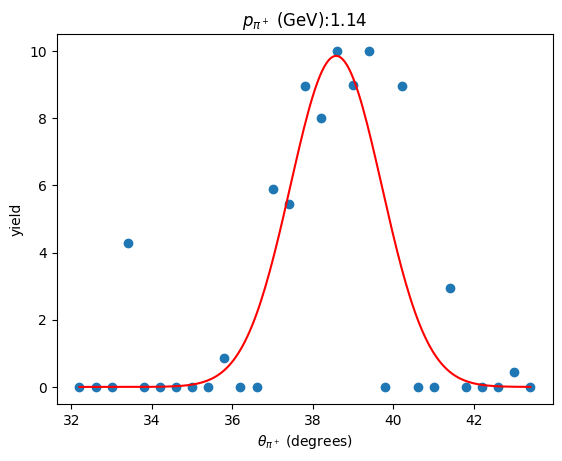

[ 8.7595358  38.16896624  1.216306  ]


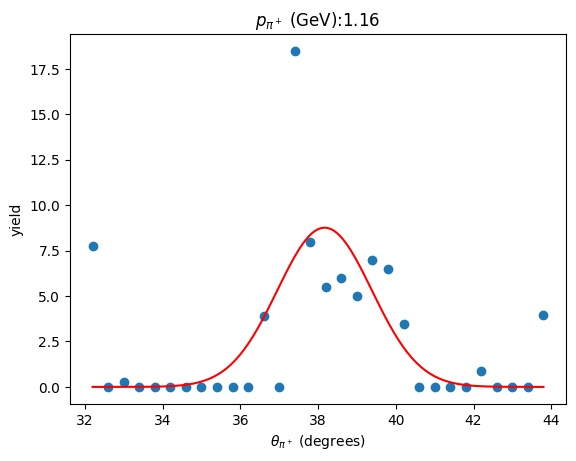

[ 9.07145409 38.8443707   1.09163613]


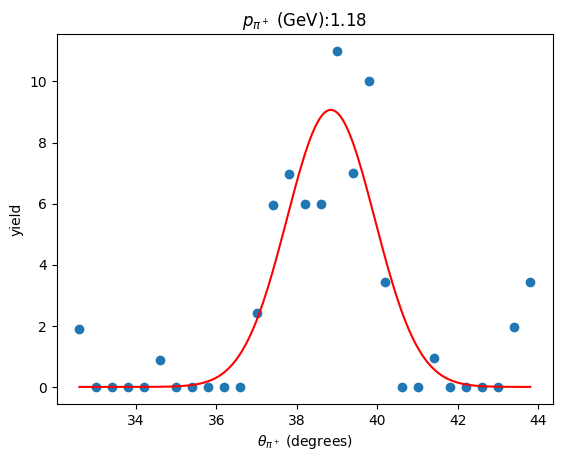

[ 7.56018381 38.57181215  0.99935467]


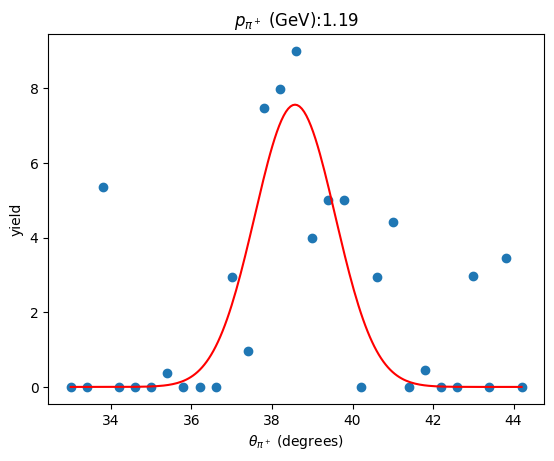

[ 7.87148516 39.15107963  1.1359196 ]


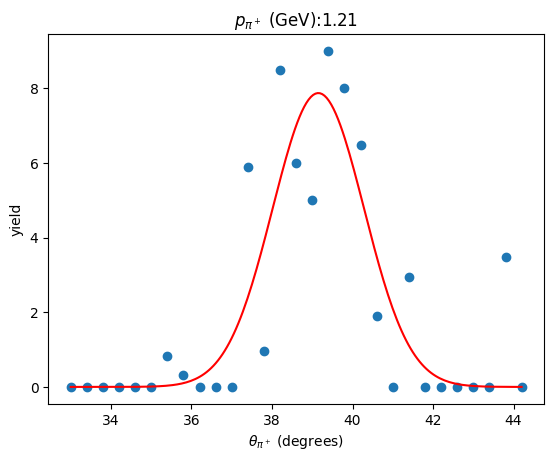

[ 7.14786607 38.31405243  1.55701636]


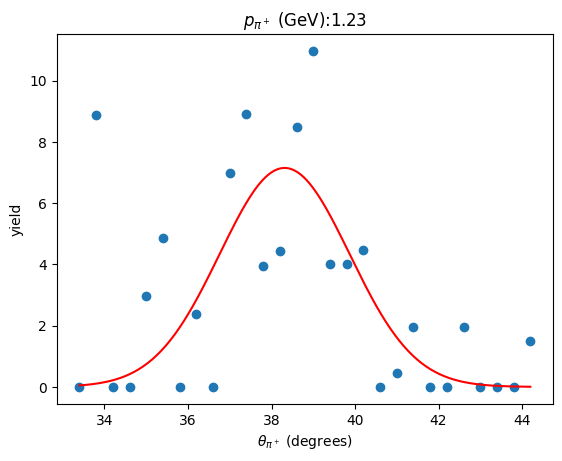

[ 8.52288812 39.15658961  0.92686666]


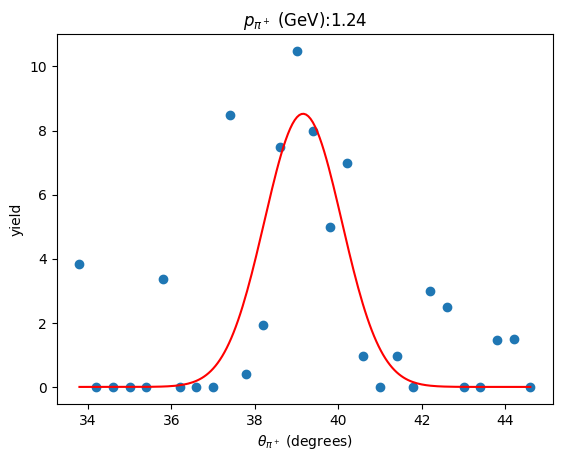

[ 7.6874517  39.22756728  0.97105297]


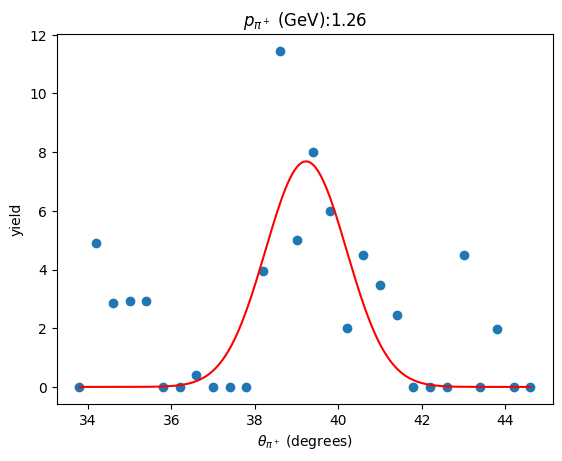

[ 4.08758743 38.91064218  1.32222579]


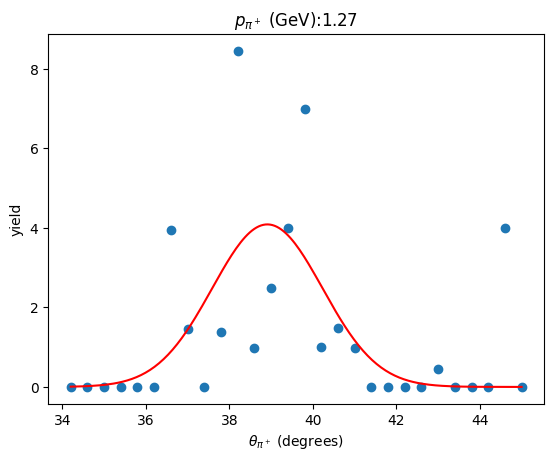

[ 4.77779947 39.85887691  0.87869576]


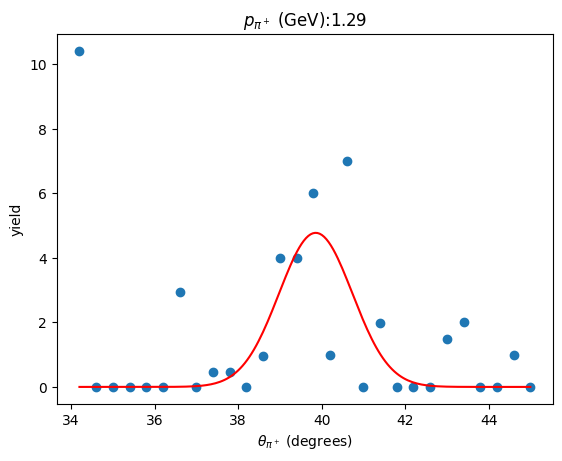

[ 5.28436271 39.81828426  1.42441982]


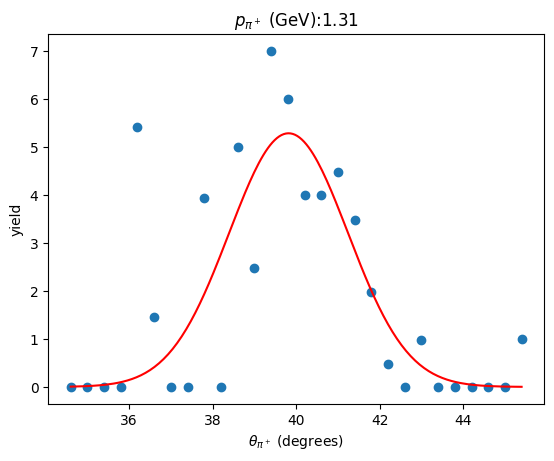

[ 4.70894492 39.13515989  1.6337286 ]


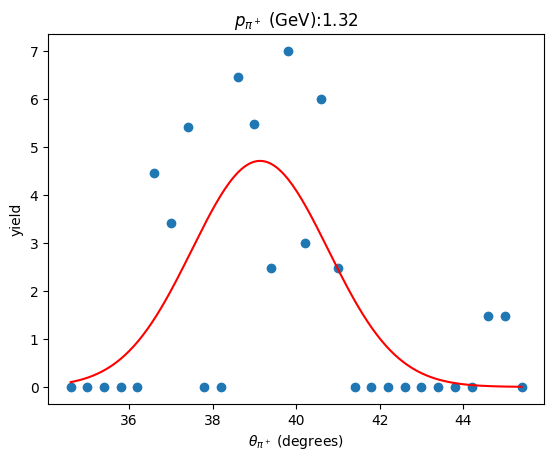

[ 4.04018844 39.17201645  1.22693548]


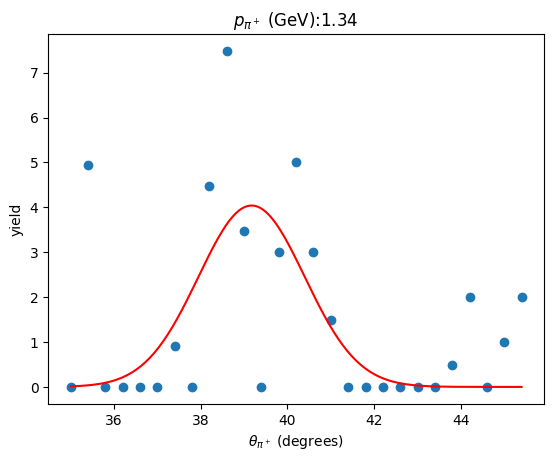

[ 2.92771872 39.46536314  1.30260856]


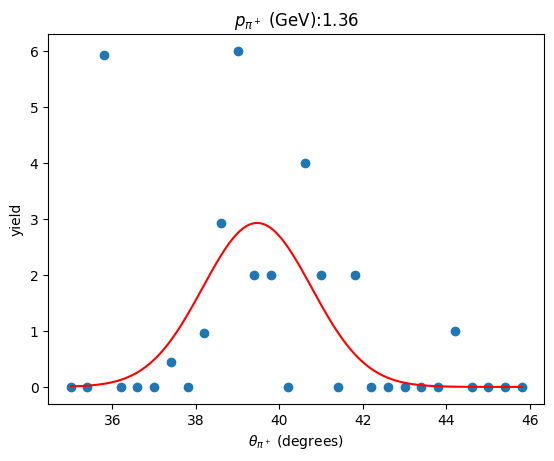

[ 4.12741904 40.41328847  0.96156325]


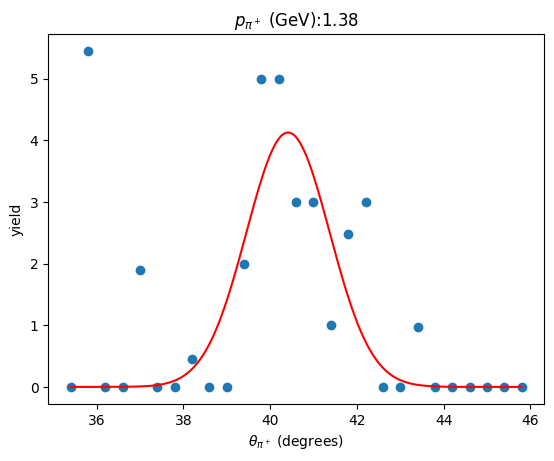

[ 2.1792714  39.40780556  2.1550319 ]


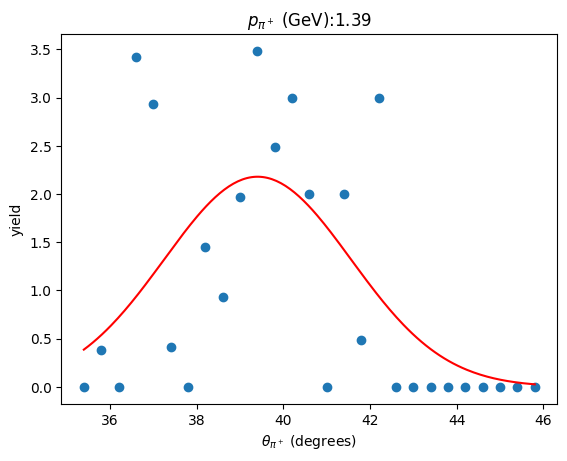

In [547]:
cut1_sec3_x = [[[],[],[]],[[],[],[]]]
cut1_sec3_y = [[[],[],[]],[[],[],[]]]

cut1_sec3_x0 = []
cut1_sec3_y0 = [] 

width = [3.5,3,2.5]
sign = [1,-1]

sec1 = 0
sec2 = 2

test_pars = [0.0,0.63,0.012]



for ybin in range(len(y)):
    if Count_Non_Zero(norm_exp_zvals_yx[sec1][sec2][ybin])>2:
        if y[ybin] > 10:
            if y[ybin]< 36:
                tmp_x = Bounds_on_Y(x,inv_fit_func2(y[ybin],*ini_par11),inv_fit_func2(y[ybin],*ini_par10))
                tmp_y = Bounds_on_X_From_Y(norm_exp_zvals_yx[sec1][sec2][ybin],x,inv_fit_func2(y[ybin],*ini_par11),inv_fit_func2(y[ybin],*ini_par10))
                plt.scatter(tmp_x,tmp_y,label='data')
                plt.title("{}:{:.2f}".format(yname,y[ybin]))
                plt.ylabel("yield")
                plt.xlabel(xname)
                test_pars[0] = np.max(tmp_y)*2
                #test_pars[1] = tmp_x[np.argmax(tmp_y)]
                test_pars[1] = np.average(tmp_x,weights=tmp_y)
                try:
                    pars, pars_cov = op.curve_fit(Gaus,tmp_x,tmp_y,p0=test_pars,maxfev=5000)
                    cont_x = np.linspace(np.min(tmp_x),np.max(tmp_x),200)
                    plt.plot(cont_x,Gaus(cont_x,*test_pars),label='Gaus guess',color='b')
                    plt.plot(cont_x,Gaus(cont_x,*pars),label='Gaus fit',color='r')
                    print(pars)
                    cut1_sec3_x0.append(pars[1])
                    cut1_sec3_y0.append(y[ybin])
                    for side in range(2):
                        for cut in range(3):
                            cut1_sec3_x[side][cut].append(pars[1]+sign[side]*width[cut]*pars[2])
                            cut1_sec3_y[side][cut].append(y[ybin])
                except RuntimeError:
                    plt.plot(cont_x,Gaus(cont_x,*test_pars),label='Gaus guess',color='b')
                    print("Runtime Error")
                plt.legend()
                plt.show()

test_pars = [0.0,33,2]
sign = [-1,1]
for xbin in range(len(y)):
    if Count_Non_Zero(norm_exp_zvals_xy[sec1][sec2][xbin])>2:
        if x[xbin] > 0.8:
            if x[xbin]< 1.4:
                tmp_x = Bounds_on_Y(y,fit_func2(x[xbin],*ini_par10),fit_func2(x[xbin],*ini_par11))
                tmp_y = Bounds_on_X_From_Y(norm_exp_zvals_xy[sec1][sec2][xbin],y,fit_func2(x[xbin],*ini_par10),fit_func2(x[xbin],*ini_par11))
                plt.scatter(tmp_x,tmp_y,label='data')
                plt.title("{}:{:.2f}".format(xname,x[xbin]))
                plt.ylabel("yield")
                plt.xlabel(yname)
                test_pars[0] = np.max(tmp_y)
                test_pars[1] = np.average(tmp_x,weights=tmp_y)
                try:
                    pars, pars_cov = op.curve_fit(Gaus,tmp_x,tmp_y,p0=test_pars,maxfev=5000)
                    cont_x = np.linspace(np.min(tmp_x),np.max(tmp_x),200)
                    plt.plot(cont_x,Gaus(cont_x,*pars),label='Gaus fit',color='r')
                    print(pars)
                    cut1_sec3_x0.append(x[xbin])
                    cut1_sec3_y0.append(pars[1])
                    for side in range(2):
                        for cut in range(3):
                            cut1_sec3_x[side][cut].append(x[xbin])
                            cut1_sec3_y[side][cut].append(pars[1]+sign[side]*width[cut]*pars[2])
                except RuntimeError:
                    print("Runtime Error")
                plt.show()
                
                


In [548]:
# cut1_sec3_pars0 = np.zeros(3)

# pars, pars_cov = op.curve_fit(fit_2n,cut1_sec3_x0,cut1_sec3_y0,p0=ini_par1,maxfev=5000)
# for i in range(3):
#     cut1_sec3_pars0[i] = pars[i]
    


/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


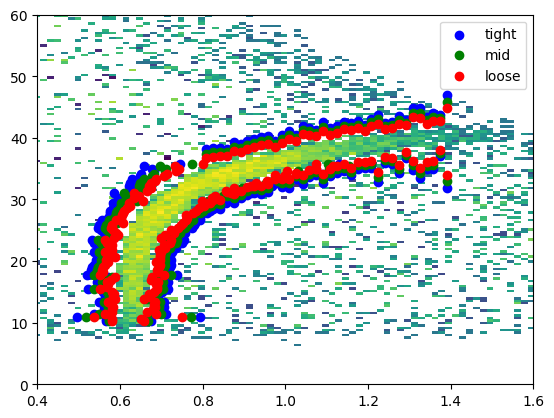

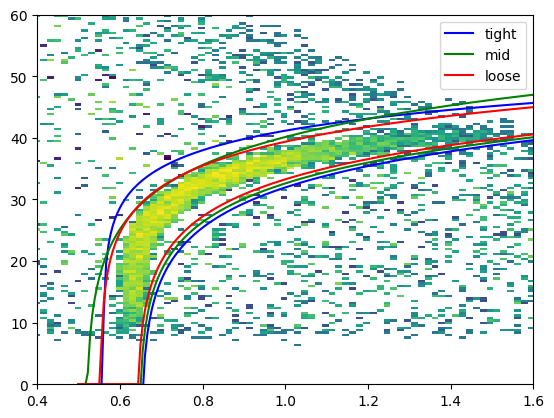

In [549]:
cut1_sec3_pars = np.zeros((2,3,3))


plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())
for side in range(2):
    for cut in range(3):
        pars, pars_cov = op.curve_fit(fit_2n,cut1_sec3_x[side][cut],cut1_sec3_y[side][cut],p0=ini_par1,maxfev=5000)
        for i in range(3):
            cut1_sec3_pars[side][cut][i] = pars[i]
        if side ==0:
            plt.scatter(cut1_sec3_x[side][cut],cut1_sec3_y[side][cut],color=cut_cols[cut],label=cut_name[cut])
        else:
            plt.scatter(cut1_sec3_x[side][cut],cut1_sec3_y[side][cut],color=cut_cols[cut])
plt.legend()
plt.xlim([0.4,1.6])
plt.ylim([0.0,60])
plt.show()

cont_x = np.linspace(0.5,1.6,200)
plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())
for side in range(2):
    for cut in range(3):
        #pars, pars_cov = op.curve_fit(fit_2n,cut1_sec3_x[side][cut],cut1_sec3_y[side][cut],p0=ini_par1,maxfev=5000)
        if side ==0:
            plt.plot(cont_x,fit_2n(cont_x,*cut1_sec3_pars[side][cut]),color=cut_cols[cut],label=cut_name[cut])
        else:
            plt.plot(cont_x,fit_2n(cont_x,*cut1_sec3_pars[side][cut]),color=cut_cols[cut])
plt.legend()
plt.xlim([0.4,1.6])
plt.ylim([0.0,60])
plt.show()

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


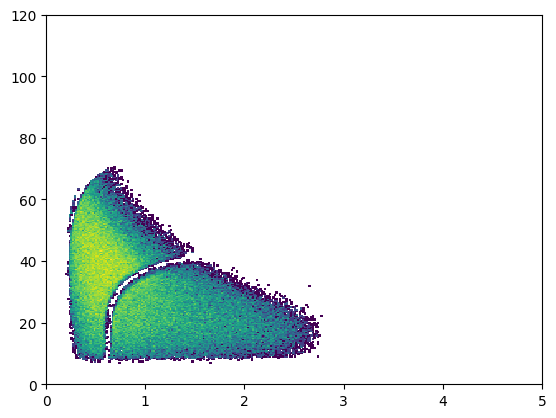

In [559]:
sec1 = 3
sec2 = 2

cut2_sec3_x = x
cut2_sec3_y = y
cut2_sec3_z_yx = np.zeros((ydim,xdim))
cut2_sec3_z_xy =np.zeros((xdim,ydim))
cont_x = np.linspace(0.0,0.6,200)

#plt.pcolor(x,y,cut2_sec3_z_yx[sec2],norm = mpl.colors.LogNorm())
#plt.plot(cont_x,fit_2n(cont_x,*ini_par2))
#plt.show()


for xbin in range(len(x)):
    for ybin in range(len(y)):
        if y[ybin] < fit_func2(x[xbin],*ini_par2):
            cut2_sec3_z_yx[ybin][xbin] = exp_z_yx[sec2][ybin][xbin]
            cut2_sec3_z_xy[xbin][ybin] = exp_z_xy[sec2][xbin][ybin]
            
plt.pcolor(x,y,cut2_sec3_z_yx,norm = mpl.colors.LogNorm())
plt.show()

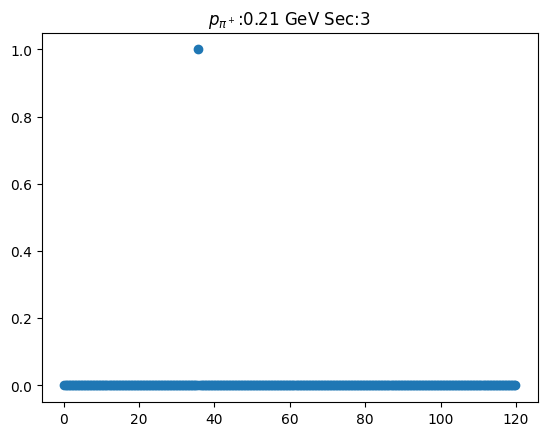

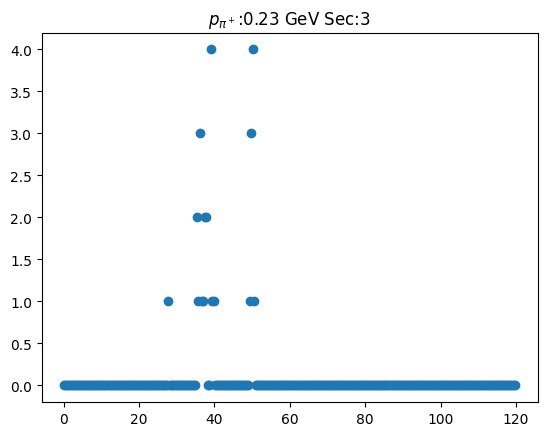

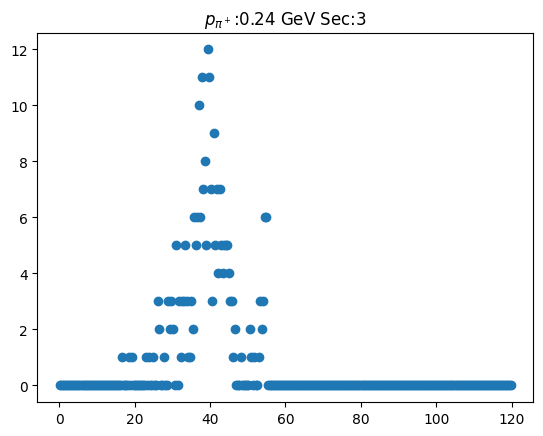

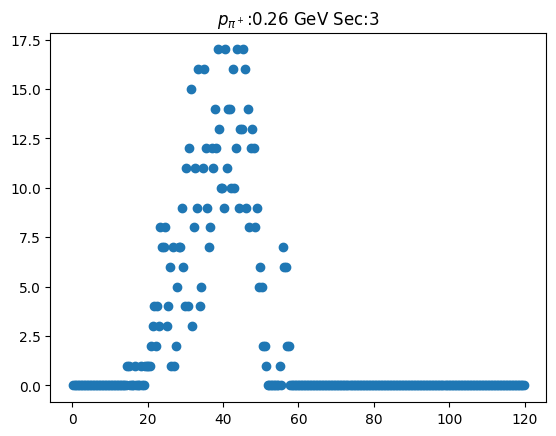

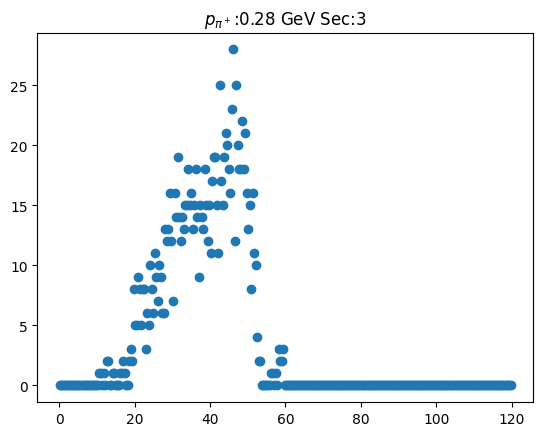

...

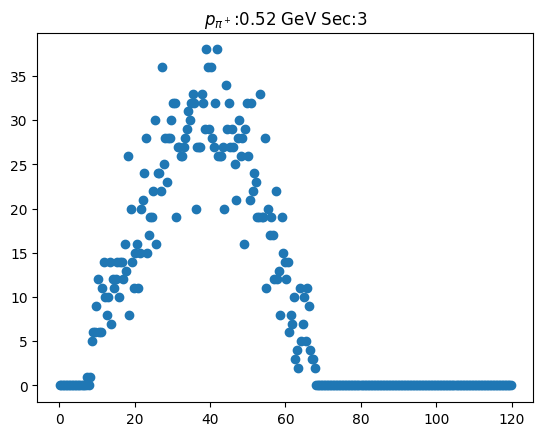

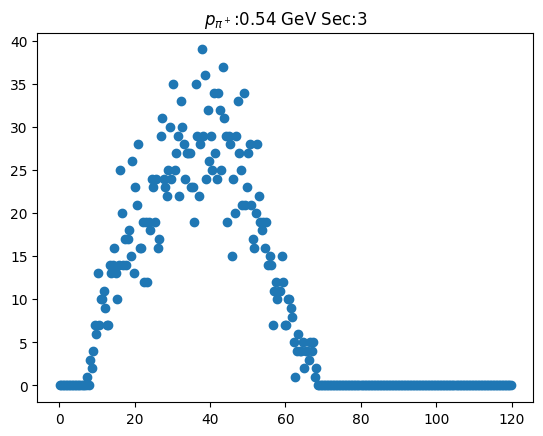

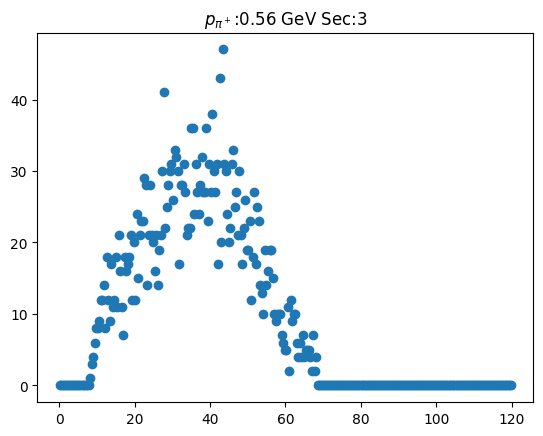

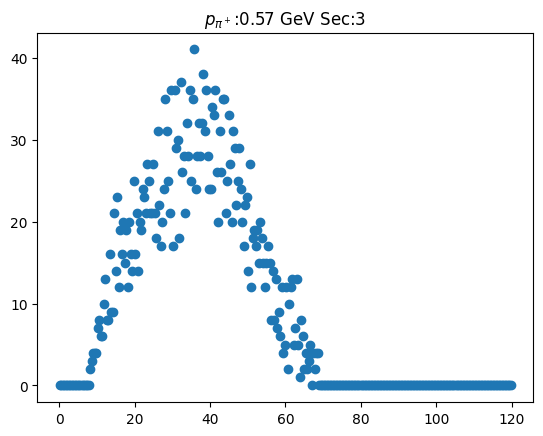

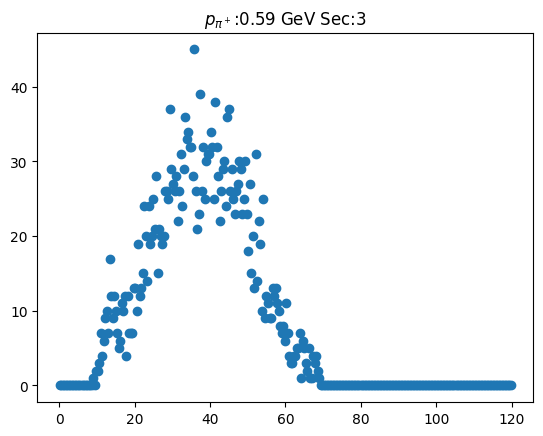

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


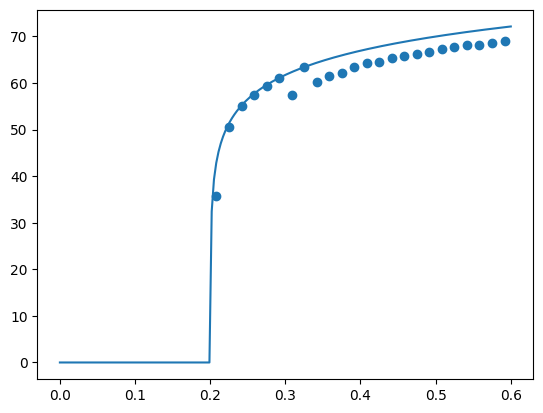

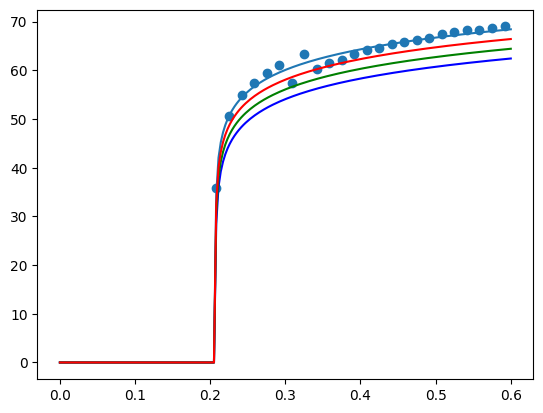

In [583]:
#Sec3 Cut 2
sec = 2

cut2_sec3_pars = np.zeros((3,3))

cut2_sec3_x = []
cut2_sec3_y = []

width= [6,4,2]
 
for xbin in range(len(x)):
    if x[xbin] > 0.18 and x[xbin] < 0.6:
        if Count_Non_Zero(cut2_sec3_z_xy[xbin])>0:
            cut2_sec3_x.append(x[xbin])
            cut2_sec3_y.append(np.max(Remove_Zeros_X(y,cut2_sec3_z_xy[xbin])))
            plt.scatter(y,cut2_sec3_z_xy[xbin])
            #plt.xlim(ybounds)
            plt.title("{}:{:.2f} GeV Sec:{}".format(Momentum,x[xbin],sec+1))
            plt.show()
        
plt.scatter(cut2_sec3_x,cut2_sec3_y)
plt.plot(cont_x,fit_2n(cont_x,*ini_par2))
plt.show()
        
        
plt.scatter(cut2_sec3_x,cut2_sec3_y)
pars, pars_cov = op.curve_fit(fit_2n,cut2_sec3_x,cut2_sec3_y,p0=ini_par2,maxfev=5000)
cont_x = np.linspace(0.0,0.6,200)
plt.plot(cont_x,fit_2n(cont_x,*pars))

for cut in range(3):
    for i in range(3):
        if i==2:
            cut2_sec3_pars[cut][i] = pars[i]-width[cut]
        else:
            cut2_sec3_pars[cut][i] = pars[i]
    plt.plot(cont_x,fit_2n(cont_x,*cut2_sec3_pars[cut]),label=cut_name[cut],color=cut_cols[cut])
#plt.xlim(xbounds)
#plt.ylim(ybounds)
plt.show()

In [588]:
cut_ver = 1

#exp_wcuts_z_xy = np.zeros((6,len(x),len(y)))
#exp_wcuts_z_yx = np.zeros((6,len(y),len(x)))

sec=2

for xbin in range(len(x)):
    for ybin in range(len(y)):
        exp_wcuts_z_xy[sec][xbin][ybin] = 0.0
        exp_wcuts_z_yx[sec][ybin][xbin] = 0.0
        if y[ybin] < fit_func2(x[xbin],*cut2_sec3_pars[cut_ver]):
            if y[ybin] > fit_func2(x[xbin],*cut1_sec3_pars[1][cut_ver]) or y[ybin] < fit_func2(x[xbin],*cut1_sec3_pars[0][cut_ver]):
                exp_wcuts_z_xy[sec][xbin][ybin] = exp_z_xy[sec][xbin][ybin]
                exp_wcuts_z_yx[sec][ybin][xbin] = exp_z_yx[sec][ybin][xbin]

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


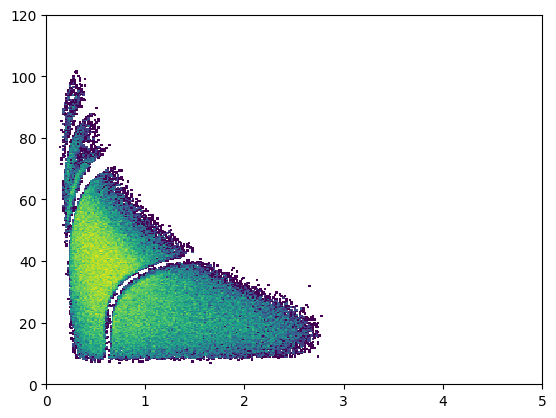

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


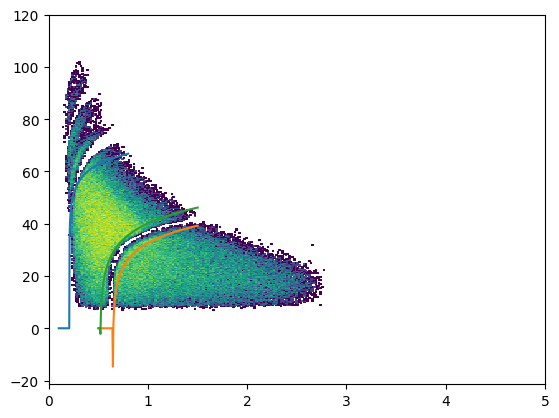

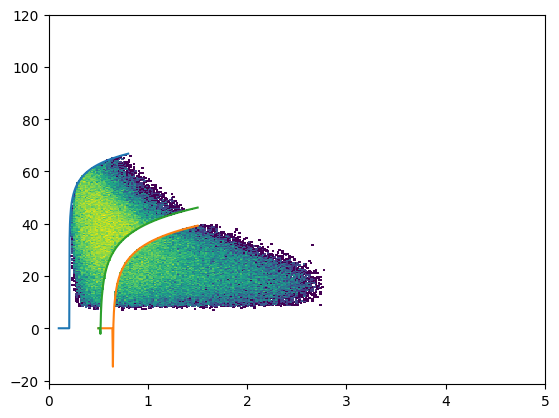

In [589]:
sec=2
cont_x1 = np.linspace(0.1,0.8,200)
cont_x2 = np.linspace(0.5,1.5,200)
plt.pcolor(x,y,exp_z_yx[sec],norm = mpl.colors.LogNorm())
plt.show()

plt.pcolor(x,y,exp_z_yx[sec],norm = mpl.colors.LogNorm())
plt.plot(cont_x1,fit_2n(cont_x1,*cut2_sec3_pars[cut_ver]))
plt.plot(cont_x2,fit_2n(cont_x2,*cut1_sec3_pars[0][cut_ver]))
plt.plot(cont_x2,fit_2n(cont_x2,*cut1_sec3_pars[1][cut_ver]))
plt.show()
plt.pcolor(x,y,exp_wcuts_z_yx[sec],norm = mpl.colors.LogNorm())
plt.plot(cont_x1,fit_2n(cont_x1,*cut2_sec3_pars[cut_ver]))
plt.plot(cont_x2,fit_2n(cont_x2,*cut1_sec3_pars[0][cut_ver]))
plt.plot(cont_x2,fit_2n(cont_x2,*cut1_sec3_pars[1][cut_ver]))
plt.show()

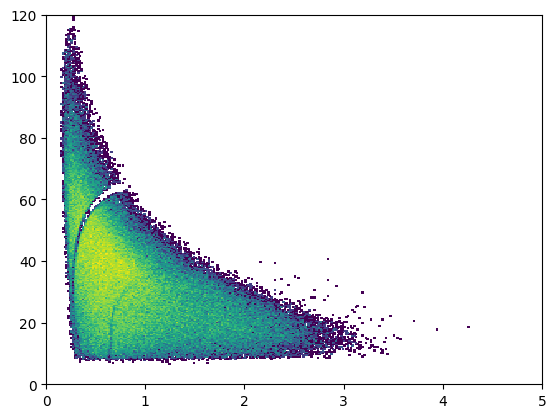

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: divide by zero encountered in log
  out = c_ + a_*np.log(x_-b_)
/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_31545/1833212147.py:7: RuntimeWarning: invalid value encountered in log
  out = c_ + a_*np.log(x_-b_)


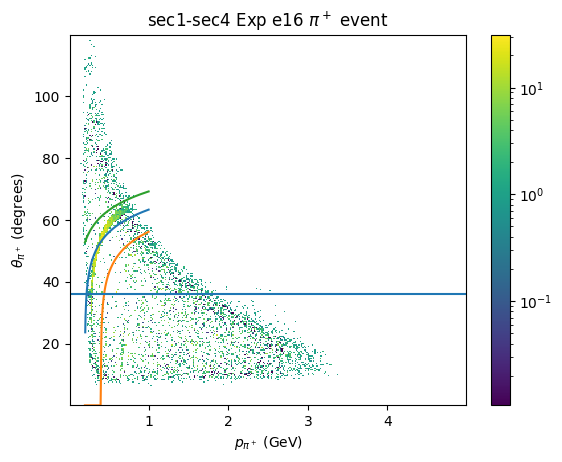

In [594]:
# Sector 4 Experiment Focused

xbounds = [0.0,1.0]
ybounds = [65.0,120.0]


#Just an upper edge bound
#norm_exp_zvals_xy[sec1][sec2][i][j]
#exp_z_xy[sec1][i][j]
#best isolation option is 4 - 1
#looks like it's close to theta = 90
sec1 = 0
sec2 = 3
cont_x = np.linspace(xbounds[0],xbounds[1],200)


plt.pcolor(x,y,exp_z_yx[sec2],norm = mpl.colors.LogNorm())
plt.show()

ini_par1 = [7.5, 0.2, 65]
ini_par10 = [7.5,0.4,60]
ini_par11 = [7.5,0.1,70]

cont_x = np.linspace(0.2,1.0,200)
plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())
plt.plot(cont_x,fit_2n(cont_x,*ini_par1),label='guess')
plt.plot(cont_x,fit_2n(cont_x,*ini_par10),label='guess bot')
plt.plot(cont_x,fit_2n(cont_x,*ini_par11),label='guess top')
#plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess')
#plt.plot(cont_x,fit_2n(cont_x,*ini_par3),label='guess')
plt.axhline(y=36)
plt.title("{}-{} Exp {} {} {}".format(sec_names[sec1],sec_names[sec2],run,Particle,pid_cut[sel]))
plt.xlabel(xname)
plt.ylabel(yname)
plt.colorbar()
#plt.ylim(ybounds)
#plt.xlim(xbounds)
plt.show()

cont_x = np.linspace(0.0,1.0,200)

# ini_par2 = [7.5,0.2,79]
# #ini_par20 = [7.5,0.7,38]
# #ini_par21 = [7.5,0.5,47]
# #plt.hist2d(nxdumb_x[sec1][sec2], nxdumb_y[sec1][sec2], bins=(xdim, ydim), weights=nxdense2[sec1][sec2],norm = mpl.colors.LogNorm())
# plt.pcolor(x,y,exp_z_yx[sec2],norm = mpl.colors.LogNorm())
# plt.plot(cont_x,fit_2n(cont_x,*ini_par2),label='guess')
# #plt.plot(cont_x,fit_2n(cont_x,*ini_par20),label='guess bot')
# #plt.plot(cont_x,fit_2n(cont_x,*ini_par21),label='guess top')
# plt.title("{} Exp {} {} {}".format(sec_names[sec2],run,Particle,pid_cut[sel]))
# plt.xlabel(xname)
# plt.ylabel(yname)
# plt.colorbar()
# plt.ylim([40,78])
# plt.xlim([0.0,.8])
# plt.show()
